In [1]:
from contextlib import contextmanager
import os
import sys
from joblib import Parallel, delayed
import itertools
from pdpbox.pdp_calc_utils import _calc_ice_lines_inter
from pdpbox.pdp import pdp_isolate, PDPInteract
from pdpbox.utils import (_check_model, _check_dataset, _check_percentile_range, _check_feature,
                    _check_grid_type, _check_memory_limit, _make_list,
                    _calc_memory_usage, _get_grids, _get_grid_combos, _check_classes)
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns
class ML_algorithm_committee:
    def __init__(self, algorithms=None, **train_options):
        """
        Initializes the ML_algorithm_committee with the provided algorithms.
        If no algorithms are provided, use a default list of 14 algorithms.
        """
        ####attributes get from .tran_models method###
        self.models = None
        self.models_scores = None
        self.hyperparameters_optimization_results = None
        self.scaler_X = None
        self.scaler_y = None
        ###current data, once models trained, able for users to check what current model committee used for training###
        ###also, allow .importance_analysis to directly call the dataset without need to indicate X, y etc again###
        self.current_data = None
        self.problem_type = None
        self.num_classes = None
        ###attributes get from .importance_analysis###
        ###analysis type: SHAP/PDP/permutation or weighted among them, default to be SHAP###
        ###weighted/original;weighted method: r/r2 (r2 default) or accuraccy/f1-score/precision/recall/AUC for classification (AUC default)###
        self.feature_importances = None
        self.performance_ranking = None 
        self.best_models = None
        self.feature_ranking = None
        self.top_features = None
        #######################
        self.second_order_matrix=None
        ###visulization part###
        #######################
        ###scatter plot for regression prediction###
        ###AUC etc for classification prediction###
        ###output importance/ranking heatmap plot (SHAP/PDP/permutation or weighted among them, default to be SHAP) (heatmap/vionlin plot) (weighted/original) (weighted method: r/r2 etc.) feature importance and ML algorithm###
        ###default algorithms list###
        self.default_algorithm_list = ['xgboost', 'catboost', 'lightgbm', 'svm', 'knn', 'gradient_boost',
                                       'random_forest', 'decision_tree', 'extra_trees', 'adaboost',
                                       'hist_gradient_boosting', 'deepforest', 'ann', 'cnn']

    def pdp_multi_interact(self, model, dataset, model_features, features, 
                    num_grid_points=None, grid_types=None, percentile_ranges=None, grid_ranges=None, cust_grid_points=None, 
                    cust_grid_combos=None, use_custom_grid_combos=False,
                    memory_limit=0.9, n_jobs=-1, predict_kwds=None, data_transformer=None):

        if n_jobs==-1:
            n_jobs=1

        def _expand_default(x, default, length):
            if x is None:
                return [default] * length
            return x

        def _get_grid_combos(feature_grids, feature_types):
            grids = [np.array(list(feature_grid),dtype=np.float16) for feature_grid in feature_grids]
            for i in range(len(feature_types)):
                if feature_types[i] == 'onehot':
                    grids[i] = np.eye(len(grids[i])).astype(int).tolist()
            return np.stack(np.meshgrid(*grids,copy=bool), -1).reshape(-1, len(grids))

        if predict_kwds is None:
            predict_kwds = dict()

        nr_feats = len(features)

        # check function inputs
        n_classes, predict = _check_model(model=model)
        _check_dataset(df=dataset)
        _dataset = dataset.copy()

        # prepare the grid
        pdp_isolate_outs = []
        if use_custom_grid_combos:
            grid_combos = cust_grid_combos
            feature_grids = []
            feature_types = []
        else:
            num_grid_points = _expand_default(x=num_grid_points, default=5, length=nr_feats)
            grid_types = _expand_default(x=grid_types, default='percentile', length=nr_feats)
            for i in range(nr_feats):
                _check_grid_type(grid_type=grid_types[i])

            percentile_ranges = _expand_default(x=percentile_ranges, default=None, length=nr_feats)
            for i in range(nr_feats):
                _check_percentile_range(percentile_range=percentile_ranges[i])

            grid_ranges = _expand_default(x=grid_ranges, default=None, length=nr_feats)
            cust_grid_points = _expand_default(x=cust_grid_points, default=None, length=nr_feats)

            _check_memory_limit(memory_limit=memory_limit)

            pdp_isolate_outs = []
            for idx in range(nr_feats):
                pdp_isolate_out = pdp_isolate(
                    model=model, dataset=_dataset, model_features=model_features, feature=features[idx],
                    num_grid_points=num_grid_points[idx], grid_type=grid_types[idx], percentile_range=percentile_ranges[idx],
                    grid_range=grid_ranges[idx], cust_grid_points=cust_grid_points[idx], memory_limit=memory_limit,
                    n_jobs=n_jobs, predict_kwds=predict_kwds, data_transformer=data_transformer)
                pdp_isolate_outs.append(pdp_isolate_out)

            if n_classes > 2:
                feature_grids = [pdp_isolate_outs[i][0].feature_grids for i in range(nr_feats)]
                feature_types = [pdp_isolate_outs[i][0].feature_type  for i in range(nr_feats)]
            else:
                feature_grids = [pdp_isolate_outs[i].feature_grids for i in range(nr_feats)]
                feature_types = [pdp_isolate_outs[i].feature_type  for i in range(nr_feats)]

            grid_combos = _get_grid_combos(feature_grids, feature_types)

        feature_list = []
        for i in range(nr_feats):
            feature_list.extend(_make_list(features[i]))

        # Parallel calculate ICE lines
        true_n_jobs = _calc_memory_usage(
            df=_dataset, total_units=len(grid_combos), n_jobs=n_jobs, memory_limit=memory_limit)

        grid_results = Parallel(n_jobs=true_n_jobs)(delayed(_calc_ice_lines_inter)(
            grid_combo, data=_dataset, model=model, model_features=model_features, n_classes=n_classes,
            feature_list=feature_list, predict_kwds=predict_kwds, data_transformer=data_transformer)
                                                    for grid_combo in grid_combos)

        ice_lines = pd.concat(grid_results, axis=0).reset_index(drop=True)
        pdp = ice_lines.groupby(feature_list, as_index=False).mean()

        # combine the final results
        pdp_interact_params = {'n_classes': n_classes, 
                            'features': features, 
                            'feature_types': feature_types,
                            'feature_grids': feature_grids}
        if n_classes > 2:
            pdp_interact_out = []
            for n_class in range(n_classes):
                _pdp = pdp[feature_list + ['class_%d_preds' % n_class]].rename(
                    columns={'class_%d_preds' % n_class: 'preds'})
                pdp_interact_out.append(
                    PDPInteract(which_class=n_class,
                                pdp_isolate_outs=[pdp_isolate_outs[i][n_class] for i in range(nr_feats)],
                                pdp=_pdp, **pdp_interact_params))
        else:
            pdp_interact_out = PDPInteract(
                which_class=None, pdp_isolate_outs=pdp_isolate_outs, pdp=pdp, **pdp_interact_params)

        return pdp_interact_out

    def center(self, arr): 
        return arr - np.mean(arr)

    def compute_f_vals(self,mdl, X, features, selectedfeatures, num_grid_points=5, use_data_grid=False):
        f_vals = {}
        data_grid = None
        if use_data_grid:
            data_grid = X[selectedfeatures].values
        
        # check function inputs
        n_classes, predict = _check_model(model=mdl)

        # Calculate partial dependencies for full feature set
        p_full = self.pdp_multi_interact(mdl, X, features, selectedfeatures, 
                                    num_grid_points=[num_grid_points] * len(selectedfeatures),
                                    cust_grid_combos=data_grid,
                                    use_custom_grid_combos=use_data_grid)
        if n_classes >2:
            p_full_pdp=p_full[0].pdp
            for i in range(1,len(p_full)):
                p_full_pdp+=p_full[i].pdp
            p_full_pdp=p_full_pdp/n_classes
            f_vals[tuple(selectedfeatures)] = self.center(p_full_pdp.preds.values)
            grid = p_full_pdp.drop('preds', axis=1)
        else:
            f_vals[tuple(selectedfeatures)] = self.center(p_full.pdp.preds.values)
            grid = p_full.pdp.drop('preds', axis=1)
        # Calculate partial dependencies for [1..SFL-1]
        for n in range(1, len(selectedfeatures)):
            for subsetfeatures in itertools.combinations(selectedfeatures, n):
                if use_data_grid:
                    data_grid = X[list(subsetfeatures)].values
                p_partial = self.pdp_multi_interact(mdl, X, features, subsetfeatures, 
                                            num_grid_points=[num_grid_points] * len(selectedfeatures),
                                            cust_grid_combos=data_grid,
                                            use_custom_grid_combos=use_data_grid)
                
                if n_classes >2:
                    p_partial_pdp=p_partial[0].pdp
                    for i in range(1,len(p_partial)):
                        p_partial_pdp+=p_partial[i].pdp
                    p_partial_pdp=p_partial_pdp/n_classes
                    p_joined = pd.merge(grid, p_partial_pdp, how='left')
                else:
                    p_joined = pd.merge(grid, p_partial.pdp, how='left')
                f_vals[tuple(subsetfeatures)] = self.center(p_joined.preds.values)
        return f_vals

    def compute_h_val(self,f_vals, selectedfeatures):
        denom_els = f_vals[tuple(selectedfeatures)].copy()
        numer_els = f_vals[tuple(selectedfeatures)].copy()
        sign = -1.0
        for n in range(len(selectedfeatures)-1, 0, -1):
            for subfeatures in itertools.combinations(selectedfeatures, n):
                print(tuple(subfeatures))
                numer_els += sign * f_vals[tuple(subfeatures)]
            sign *= -1.0
        numer = np.sum(numer_els**2)
        denom = np.sum(denom_els**2)
        return math.sqrt(numer/denom) if numer < denom else np.nan

    def compute_h_val_any(self,f_vals, allfeatures, selectedfeature):
        otherfeatures = list(allfeatures)
        otherfeatures.remove(selectedfeature)
        denom_els = f_vals[tuple(allfeatures)].copy()
        numer_els = denom_els.copy()
        numer_els -= f_vals[(selectedfeature,)]
        numer_els -= f_vals[tuple(otherfeatures)]
        numer = np.sum(numer_els**2)
        denom = np.sum(denom_els**2)
        return math.sqrt(numer/denom) if numer < denom else np.nan

    def compute_interactions(self,model,X_train,feature_all,feature_select_list):  
        result_dict={}
        total_time = 0  # Total time taken by the function
        for i in range(len(feature_select_list)):
            for j in range(len(feature_select_list)):
                if i<j :
                    print(i,j)
                    try:
                        current_features=[feature_select_list[i],feature_select_list[j]]
                        start_time = time.time()  # Start time of the computation
                        f_vals=self.compute_f_vals(model, X_train, feature_all,current_features)
                        h_val=self.compute_h_val(f_vals,current_features)
                        elapsed_time = time.time() - start_time  # Time taken for the computation
                        if np.isnan(h_val):
                            print('current h_val is nan, convert to 0')
                            h_val = 0
                        result_dict[tuple(current_features)]=h_val
                        total_time += elapsed_time  # Add the elapsed time to the total time
                        print("Elapsed time taken:", elapsed_time)
                    except Exception as e:
                        print(e)
                        result_dict[tuple(current_features)]=0
                    print(result_dict[tuple(current_features)])
        print("Total time taken:", total_time)  # Print the total time taken
        return result_dict

    def h_index_weighted_matrix_compute(self,project_name):
        """
        Compute the H-index weighted matrix for the given models and data.

        Parameters:
        - project_name (str): The name of the project, used for creating the directory where the images are saved.

        This function computes the H-index weighted matrix for each model in the model committee. It first concatenates 
        the training and test datasets, and then computes the weighted matrix for each model based on its interactions and 
        scores. Finally, it computes the first and second order H matrices and saves them as heatmaps.

        Returns:
        - matrix_list (list): List of weighted matrices for each model.
        - second_order_matrix (DataFrame): The second order H matrix.
        - first_order_matrix (DataFrame): The first order H matrix.
        - image_1st (str): Path to the saved image of the first order H matrix.
        - image_2nd (str): Path to the saved image of the second order H matrix.
        """
        
        # Define the directory to save the images
        dir_path = os.path.join('.', project_name, 'h_index_weighted_matrix_compute')
        os.makedirs(dir_path, exist_ok=True)
        
        # Concatenate the training and test datasets
        X_for_computing= pd.concat([self.current_data[0], self.current_data[1]])

        def construct_matrix_weighted(target_dict,target_score):
            # Construct a weighted matrix from the given dictionary and score
            df=pd.DataFrame(columns=X_for_computing.columns,index=X_for_computing.columns)
            for each in target_dict:
                df.loc[each[0],each[1]]=target_dict[each]*target_score
                df.loc[each[1],each[0]]=target_dict[each]*target_score
            return df

        # Initialize the total matrix list and total metric score
        total_h_matrix_list=[]
        total_metric_score=0

        # For each model, compute the interactions and the weighted matrix, and add to the total matrix list and total metric score
        for each_key in self.models.keys():
            CURRENT_MODEL=self.models[each_key]
            CURRENT_MODEL_DICT=self.compute_interactions(CURRENT_MODEL,X_for_computing,X_for_computing.columns,list(X_for_computing.columns))
            if self.problem_type=='regression':
                CURRENT_SCORE=self.models_scores[each_key][1][1]
                CURRENT_DF=construct_matrix_weighted(CURRENT_MODEL_DICT,CURRENT_SCORE)
            else:
                CURRENT_SCORE=self.models_scores[each_key][1][4]
                CURRENT_DF=construct_matrix_weighted(CURRENT_MODEL_DICT,CURRENT_SCORE)
            total_h_matrix_list.append(CURRENT_DF)
            total_metric_score+=CURRENT_SCORE
        
        # Compute the weighted matrix
        Weighted_Matrix = sum([df.values for df in total_h_matrix_list]) / total_metric_score
        Weighted_Matrix = pd.DataFrame(Weighted_Matrix, index=total_h_matrix_list[0].index, columns=total_h_matrix_list[0].columns)
        Weighted_Matrix = Weighted_Matrix.fillna(0)
        Weighted_Matrix = Weighted_Matrix / Weighted_Matrix.max().max()
        divided_matrices = [df / total_metric_score for df in total_h_matrix_list]
        
        def Second_Order_H_Matrix_Plot(H_DF_WEIGHTED):
            # Create and save the heatmap for the second order H matrix
            # Set the figure size
            heatmap_figsize = (max(12, H_DF_WEIGHTED.shape[0] * 0.6), max(12, H_DF_WEIGHTED.shape[0] * 0.6))
            plt.figure(figsize=heatmap_figsize)
            # Create the heatmap
            sns.heatmap(H_DF_WEIGHTED, annot=False, cmap="hot_r", cbar_kws={'label': 'Second Order H Statistics'})
            # Set the title and labels
            plt.title('Weighted Second Order H statistics')
            plt.xticks(rotation=45, ha="right")
            plt.xlabel('Features')
            plt.ylabel('Features')
            plt.tight_layout()
            # Save the figure
            image_file = os.path.join(dir_path, "Second_Order_H_Matrix_Plot.png")
            plt.savefig(image_file)
            plt.show()
            return image_file

        def First_Order_H_Matrix_Plot(Model_Names_List, Matrix_list):
            # Create and save the heatmap for the first order H matrix
            # Compute the summary matrix
            summary_matrix = pd.DataFrame(index=Model_Names_List)
            for name, matrix in zip(Model_Names_List, Matrix_list):
                row_values = matrix.sum(axis=1).T  # Sum over rows
                for model_name, value in row_values.iteritems():
                    summary_matrix.loc[name, model_name] = value
            # Normalize the summary matrix
            summary_matrix = summary_matrix.fillna(0)
            summary_matrix = summary_matrix / summary_matrix.max().max()
            # Set the figure size
            heatmap_figsize = (max(12, summary_matrix.shape[0] * 0.6), max(12, summary_matrix.shape[0] * 0.6))
            plt.figure(figsize=heatmap_figsize)
            # Create the heatmap
            sns.heatmap(summary_matrix, annot=False, cmap="hot_r", cbar_kws={'label': 'First Order H Statistics'})
            # Set the title and labels
            plt.title('First Order H Statistics')
            plt.xticks(rotation=45, ha="right")
            plt.xlabel('Models')
            plt.ylabel('Models')
            plt.tight_layout()
            # Save the figure
            image_file = os.path.join(dir_path, "First_Order_H_Matrix_Plot.png")
            plt.savefig(image_file)
            plt.show()
            return summary_matrix,image_file
        
        # Compute the first and second order H matrices and save as heatmaps
        first_order_matrix,image_1st=First_Order_H_Matrix_Plot(list(self.models.keys()), divided_matrices)
        second_order_matrix=Weighted_Matrix
        image_2nd=Second_Order_H_Matrix_Plot(Weighted_Matrix)
        matrix_list=divided_matrices
        self.second_order_matrix=second_order_matrix
        plt.close()
        return matrix_list,second_order_matrix,first_order_matrix,image_1st,image_2nd


In [2]:
import os
import shap
import pandas as pd
import keras
from sklearn.preprocessing import *
import numpy as np
ANN_loaded=keras.models.load_model("Acid_OER.h5")

In [3]:
CMT=ML_algorithm_committee()
CMT.models={'ann':ANN_loaded}
CMT.problem_type='regression'

In [4]:
from sklearn.preprocessing import *
from sklearn.model_selection import train_test_split
seed=1234
Minmaxsc  = MinMaxScaler(feature_range=(0, 1))
Minmaxsc2  = MinMaxScaler(feature_range=(0, 1))
Stdsc  = StandardScaler()
Stdsc2  = StandardScaler()
MAsc  = MaxAbsScaler()
MAsc2  = MaxAbsScaler()
Rsc  = RobustScaler()
Rsc2  = RobustScaler()
database=pd.read_csv('processed_database.csv')
data_output_full=database.iloc[:,1]
data_input_full=database.iloc[:,2:]
data_input_full_ANN=Stdsc.fit_transform(data_input_full)
data_output_full_ANN=Stdsc2.fit_transform(np.array(data_output_full).reshape(-1,1))
X_train_ANN,X_test_ANN,y_train_ANN,y_test_ANN=train_test_split(data_input_full_ANN,data_output_full_ANN,test_size=0.05,random_state=seed)


In [5]:
# Getting column names
input_column_names = data_input_full.columns
output_column_name = data_output_full.name # Assuming data_output_full is a Series

# Converting NumPy arrays back to DataFrame
X_train_ANN_df = pd.DataFrame(X_train_ANN, columns=input_column_names)
X_test_ANN_df = pd.DataFrame(X_test_ANN, columns=input_column_names)

# If your y_train_ANN and y_test_ANN are 1-D arrays, you can convert them into a Series:
y_train_ANN_series = pd.Series(y_train_ANN.flatten(), name=output_column_name)
y_test_ANN_series = pd.Series(y_test_ANN.flatten(), name=output_column_name)


In [6]:
CMT.current_data=(X_train_ANN_df,X_test_ANN_df,y_train_ANN_series,y_test_ANN_series)

In [7]:
CMT.models_scores={'ann': ([None,
   1,
   None,
   None],
  [None,
   1,
   None,
   None])}

0 1
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Atomic Number',)
Elapsed time taken: 3.055788278579712
0.29270340665334227
0 2
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Period',)
Elapsed time taken: 2.960081100463867
0.06736418908984844
0 3
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Group',)
Elapsed time taken: 3.1046979427337646
0.11618941772985705
0 4
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Ionization Potential',)
Elapsed time taken: 3.127634048461914
0.04014531435661563
0 5
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Electronegativity',)
Elapsed time taken: 2.570124864578247
0.07606388959677121
0 6
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.539210081100464
0.1651073292049284
0 7
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.970055103302002
0.32607860716465553
0 8
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 2.9471187591552734
0.1956766262883391
0 9
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Atomic Number',)
Elapsed time taken: 2.9610795974731445
0.07277005931571115
0 10
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Period',)
Elapsed time taken: 2.9371438026428223
0.8153037699257231
0 11
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Group',)
Elapsed time taken: 2.9341518878936768
0.13429835761973352
0 12
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Ionization Potential',)
Elapsed time taken: 3.091730833053589
0.1727847762314637
0 13
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.5641424655914307
0.09817717848991551
0 14
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.1033756732940674
0.25272039643061844
0 15
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.9501090049743652
0.1756305101232799
0 16
15/15 [==============================] - 0s 643us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.543198585510254
0.13898842236917572
0 17
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.558156728744507
0.5668440606570495
0 18
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Period',)
Elapsed time taken: 2.5561635494232178
0.043451133338515725
0 19
15/15 [==============================] - 0s 570us/step
('Element_1 Relative

15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.502307415008545
0.2652809214586014
0 21
15/15 [==============================] - 0s 643us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.531230926513672
0.09882825900434372
0 22
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.0734541416168213
0.3493506577154574
0 23
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.5222532749176025
0.2715274584498131
0 24
15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.0914061069488525
0.30532420706974356
0 25
15/15 [==============================] - 0s 641us/step
('El

15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Group',)
Elapsed time taken: 2.14227032661438
0.32982695915821747
0 28
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 2.1322977542877197
0
0 29
15/15 [==============================] - 0s 784us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.1522419452667236
0.6201837218628055
0 30
15/15 [==============================] - 0s 643us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.806168794631958
0.45301084066939534
0 31
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.242003917694092
0.5221120649967995
0 32
15/15 [==============================] - 0s 570us/step
('E

15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_5 Group',)
Elapsed time taken: 1.736356258392334
0.23137774869562838
0 36
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.7144136428833008
0.2007779458809403
0 37
15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.729374647140503
0.2601274680635099
0 38
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.747326374053955
0.11513858790413267
0 39
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.716437816619873
0.2987702631562674
0 40
15/15 [==============================] - 0s 641us/step
('Element_1 Relative 

15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.7243883609771729
0.07048668412734874
0 45
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.8490536212921143
0.45927429782215107
0 46
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.6884839534759521
0.1564701317805583
0 47
15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.712421178817749
0.15752864037962763
0 48
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.3065054416656494
0.0
0 49
15/15 [==============================] - 0s 784us/step
('Element_1 Relat

15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.2576367855072021
0.0
0 55
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.2765848636627197
0.0
0 56
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.2666120529174805
0.0
0 57
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.276585578918457
0.0
0 58
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_8 Period',)
Elapsed time taken: 1.2676112651824951
0.0
0 59
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Element_8 Group',)
Elapsed time taken: 1.276585340499878
0.0

15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_3D',)
Elapsed time taken: 1.6765186786651611
0.6569179360088993
0 66
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_2D',)
Elapsed time taken: 1.676513433456421
0.1987520529533018
0 67
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_1D',)
Elapsed time taken: 1.6825284957885742
0.1817220382360123
0 68
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Urchin',)
Elapsed time taken: 1.8749561309814453
0.06890587002677559
0 69
15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Judge_SAC',)
Elapsed time taken: 1.6944687366485596
0.024596229658380504
0 70
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_QD',)
Elapsed time taken: 1.696462869644165
0.29739121

15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 1.6824719905853271
0.08310153102398982
0 75
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 1.7024469375610352
0.7329600480473263
0 76
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 1.7074341773986816
0.19821300197796848
0 77
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.6964607238769531
0.218920794295857
0 78
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.6984586715698242
0.05406887688678664
0 79
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge

15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7333643436431885
0.4611414442017941
0 84
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_oxalate',)
Elapsed time taken: 1.2925424575805664
0.0
0 85
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Spinel',)
Elapsed time taken: 1.7014491558074951
0.3249568236538049
0 86
15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Judge_Perovskite',)
Elapsed time taken: 1.7124199867248535
0.19234064288693734
0 87
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.7104556560516357
0.07870083133478517
0 88
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Prussian_Blue',)
Elapsed time

15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Graphene',)
Elapsed time taken: 1.7303717136383057
0.5053513969968979
0 94
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_c3n4',)
Elapsed time taken: 1.7273790836334229
0.14890613113590712
0 95
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_MXene',)
Elapsed time taken: 1.6984591484069824
0.18201907530579592
0 96
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_CNT',)
Elapsed time taken: 1.7213940620422363
0.19893562543478993
0 97
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_IL',)
Elapsed time taken: 1.7054383754730225
0.21084136008229326
0 98
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.29

15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Judge_Molten',)
Elapsed time taken: 1.694467306137085
0.09313394371550826
0 103
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.6924736499786377
0.7742885569677117
0 104
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Electrospin',)
Elapsed time taken: 1.7223927974700928
0.1882326296794056
0 105
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.7154130935668945
0.15615698907084496
0 106
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 712us/step
('Element_1 Relative Atomic Mass',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.6904776096343994
0
0 107
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Spray',)
Elapsed time taken: 1.706437587738037
0.5260057216739221
0 108
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mass',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.8191325664520264
0.7915803377029415
0 109
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.2745914459228516
0.0
0 110
15/15 [==============================] - 0s 641us/step
('Element_1 Relative Atomic Mass',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.7134170532226562
0.11094604143653093
0 111
15/15 [==============================] - 0s 570us/step
('Element_1 Relative Atomic Mas

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_1 Group',)
Elapsed time taken: 3.011944532394409
0.08191494132640599
1 4
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_1 Ionization Potential',)
Elapsed time taken: 2.991997718811035
0.04659734390298647
1 5
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Element_1 Electronegativity',)
Elapsed time taken: 2.6548984050750732
0.08677261608398196
1 6
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.5751144886016846
0.12317844577288523
1 7
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_1 Atomic Radius',)
Elapsed time taken: 3.073777198791504
0.20734830187276276
1 8
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 2.9331555366516113
0.16451724924797798
1 9
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_2 Atomic Number',)
Elapsed time taken: 2.950108766555786
0.11623030989925637
1 10
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_2 Period',)
Elapsed time taken: 3.0917325019836426
0.31166960536791904
1 11
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_2 Group',)
Elapsed time taken: 2.9590842723846436
0.05163327114243802
1 12
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.96706485748291
0.09851926934491902
1 13
15/15 [==============================] - 0s 712us/step


15/15 [==============================] - 0s 855us/step
('Element_1 Atomic Number',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.52524733543396
0.08729841670615245
1 14
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.10935640335083
0.10516874596204753
1 15
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.9690592288970947
0.1646154938634634
1 16
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.547187566757202
0.07561113827043293
1 17
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.5571887493133545
0.2215542963793185
1 18
15/15 [==============================] - 0s 639us/step
('Element_1 Atomic Number',)
('Element_3 Period'

15/15 [==============================] - 0s 568us/step
('Element_1 Atomic Number',)
('Element_3 Group',)
Elapsed time taken: 2.5302317142486572
0.14046396200657088
1 20
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.5332255363464355
0.21795205630019157
1 21
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.53322434425354
0.06064652886532945
1 22
15/15 [==============================] - 0s 499us/step
('Element_1 Atomic Number',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.0983872413635254
0.258865489110848
1 23
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.4873476028442383
0.07724530138846364
1 24
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.2569637298583984
0.16071761999191012
1 25
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.1223254203796387
0.08488350112642731
1 26
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_4 Period',)
Elapsed time taken: 2.1293041706085205
0.1342277782165987
1 27
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_4 Group',)
Elapsed time taken: 2.120330810546875
0.1765810150802465
1 28
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_4 Ionization Potential',)
Elapse

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.6874876022338867
0.22517991786720407
1 31
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.1382806301116943
0.07999561583251745
1 32
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.684520959854126
0.05685842911257689
1 33
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.728353500366211
0.11777121682548584
1 34
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_5 Period',)
Elapsed time taken: 1.6894817352294922
0.2885645882537349
1 35
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_5 Group',)
Elaps

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.698458194732666
0.04123643350847458
1 39
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.6994528770446777
0.11275333269595512
1 40
15/15 [==============================] - 0s 997us/step
('Element_1 Atomic Number',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.6904804706573486
0.03702336306825084
1 41
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.7044432163238525
0.054847846228033695
1 42
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_6 Period',)
Elapsed time taken: 1.6854922771453857
0.3258827778532226
1 43
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_6 Group',)
Ela

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.7233896255493164
0.11077964088820866
1 48
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.2696046829223633
0.0
1 49
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.2885546684265137
0.0
1 50
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Element_7 Period',)
Elapsed time taken: 1.2945387363433838
0.0
1 51
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Element_7 Group',)
Elapsed time taken: 1.2775824069976807
0.0
1 52
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.3104958534240723
0.0
1 53
15/15 [============

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_8 Group',)
Elapsed time taken: 1.2865581512451172
0.0
1 60
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.2885518074035645
0.0
1 61
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.2865607738494873
0.0
1 62
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.254643440246582
0.0
1 63
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.2686066627502441
0.0
1 64
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.7194015979766846
0.3588804283369321
1 65
15/15 [======

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_SAC',)
Elapsed time taken: 1.7174079418182373
0.09999298577742946
1 70
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_QD',)
Elapsed time taken: 1.7503180503845215
0.19005070657528503
1 71
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Hollow',)
Elapsed time taken: 1.6884829998016357
0.05810715969414157
1 72
15/15 [==============================] - 0s 784us/step
('Element_1 Atomic Number',)
('Judge_Core_Shell',)
Elapsed time taken: 1.6964623928070068
0.3867928019821357
1 73
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Template',)
Elapsed time taken: 1.7044434547424316
0.14278663777751688
1 74
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_alloy',)
Elapsed time taken: 1.6944663524627686
0.273197313813608
1 75
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Functionalized',)
Elapsed time taken: 1.6984572410583496
0.344318028945557
1 76
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_heterostructures',)
Elapsed time taken: 1.6974599361419678
0.06144240318184138
1 77
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.7253851890563965
0.14803917041951586
1 78
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.6974599361419678
0.10006370433836734
1 79
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.7233920097351

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7004525661468506
0.2436754525335706
1 84
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Judge_oxalate',)
Elapsed time taken: 1.5348951816558838
0.0
1 85
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Spinel',)
Elapsed time taken: 1.8081636428833008
0.4805225404231772
1 86
15/15 [==============================] - 0s 784us/step
('Element_1 Atomic Number',)
('Judge_Perovskite',)
Elapsed time taken: 1.8390817642211914
0.0821930589400511
1 87
15/15 [==============================] - 0s 499us/step
('Element_1 Atomic Number',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.7802388668060303
0.26602934467265643
1 88


15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.7104241847991943
0.04602228105604474
1 89
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Amorphous',)
Elapsed time taken: 1.7004528045654297
0.14600473716436738
1 90
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7154107093811035
0.13496913608982467
1 91
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Plasma',)
Elapsed time taken: 1.7164092063903809
0.2660807178417353
1 92
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.7273812294006348
0.04254529927863044
1 93
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Graphene',)
Elapsed time taken: 1.6904773712158203
0.58976717

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 1.6854925155639648
0.1047433437318592
1 98
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.2935407161712646
0.0
1 99
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 1.6934702396392822
0.07018591161367478
1 100
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.7044429779052734
0.012250889429654502
1 101
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Film',)
Elapsed time taken: 1.6954634189605713
0.14523328575517894
1 102
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Molten',)
Elapsed time taken: 1.7034456729888916
0.07874170322081946
1 103
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.8350911140441895
0.2736140770934294
1 104
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Electrospin',)
Elapsed time taken: 1.7004518508911133
0.3482731585548893
1 105
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.721395492553711
0.10434180874088354
1 106
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Microwave',)
Elapsed time taken: 1.7243876457214355
0.799

15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.6924731731414795
0.05138738574135595
1 112
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Number',)
('Judge_Etching',)
Elapsed time taken: 1.7194252014160156
0.0659988119508821
1 113
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.699430227279663
0.19509626816727313
2 3
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_1 Group',)
Elapsed time taken: 2.990999460220337
0.12108654723742124
2 4
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_1 Ionization Potential',)
Elapsed time taken: 2.949113607406616
0.18572177674537285
2 5
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_1 Electronegativity',)
Elapsed time taken: 2.582092523574829

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.5521745681762695
0.1423906046824345
2 7
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.940135955810547
0.1431205764132715
2 8
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 3.127638101577759
0.06905072949616818
2 9
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_2 Atomic Number',)
Elapsed time taken: 2.9481120109558105
0.06566143628030764
2 10
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_2 Period',)
Elapsed time taken: 2.998978853225708
0.40233856494118014
2 11
15/15 [==============================] - 0s 855us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_2 Group',)
Elapsed time taken: 2.974045753479004
0.07853290939342533
2 12
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.9740452766418457
0.3056709727520792
2 13
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.587082624435425
0.2287951495999031
2 14
15/15 [==============================] - 0s 499us/step
('Element_1 Period',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.129305362701416
0.17691367216903134
2 15


15/15 [==============================] - 0s 567us/step
('Element_1 Period',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.974045753479004
0.0396229988266522
2 16
15/15 [==============================] - 0s 643us/step
('Element_1 Period',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.5451903343200684
0.18573333005112988
2 17
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.5651397705078125
0.11905244784836597
2 18
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_3 Period',)
Elapsed time taken: 2.5392091274261475
0.05652836041013718
2 19
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_3 Group',)
Elapsed time taken: 2.512279510498047
0.1147691987495933
2 20
15/15 [==============================] - 0s 639us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.5451924800872803
0.14263681614671495
2 21
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.5362181663513184
0.14048521723986415
2 22
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.2629475593566895
0.11332630626182082
2 23
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.551175832748413
0.1642106613359398
2 24
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.1492509841918945
0.2453966713117632
2 25
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_4 Atomic Number',)
Elapsed time taken: 2

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_4 Group',)
Elapsed time taken: 2.0924031734466553
0.12922806017822872
2 28
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.1492531299591064
0.06758258066207057
2 29
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.1263108253479004
0.13158051507888008
2 30
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.7064366340637207
0.07952003108526791
2 31
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.125316619873047
0.049623017800593194
2 32
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.7203

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_5 Group',)
Elapsed time taken: 1.705437183380127
0.14633532888762368
2 36
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.695464849472046
0.11761267145026585
2 37
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.7184035778045654
0.18039384170776782
2 38
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.6954677104949951
0.1063002288824194
2 39
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.8221251964569092
0.591806569035766
2 40
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.718402862

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.721395492553711
0.12376978610065041
2 45
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.714442253112793
0.2060785234594806
2 46
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.7433395385742188
0.11806231445087899
2 47
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.7113933563232422
0.46209084351917307
2 48
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.2935400009155273
0.0
2 49
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.285595893859863

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.2825698852539062
0.0
2 56
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.2905478477478027
0.0
2 57
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.2646188735961914
0.0
2 58
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Element_8 Period',)
Elapsed time taken: 1.295534610748291
0.0
2 59
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_8 Group',)
Elapsed time taken: 1.28755521774292
0.0
2 60
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.2765867710113525
0.0
2 61
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('E

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_2D',)
Elapsed time taken: 1.7104260921478271
0.10396899501518271
2 67
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_1D',)
Elapsed time taken: 1.7263827323913574
0.1747228921222892
2 68
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Urchin',)
Elapsed time taken: 1.711423397064209
0.31825720428888876
2 69
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_SAC',)
Elapsed time taken: 1.7164077758789062
0.1762886037045034
2 70
15/15 [==============================] - 0s 499us/step
('Element_1 Period',)
('Judge_QD',)
Elapsed time taken: 1.7264103889465332
0.17140762223361217
2 71
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Hollow',)
Elapsed time taken: 1.703416347503662
0.11708745659692685
2 72
15/15 [==============================] - 0s 641us/step
('Element_

15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_Functionalized',)
Elapsed time taken: 1.737325668334961
0.031374819891106805
2 76
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_heterostructures',)
Elapsed time taken: 1.692474126815796
0.1984194540844436
2 77
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.6914751529693604
0.3802897374872654
2 78
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.6974620819091797
0.16734095175724967
2 79
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_MOF',)
Elapsed time taken: 1.7004516124725342
0.8561051322735941
2 80
15/15 [==============================] - 0s 714us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_COF',)
Elapsed time taken: 1.718402624130249
0.09417893710444639
2 81
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.7732577323913574
0.309738426409461
2 82
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.7134196758270264
0.2660547874628601
2 83
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.8450655937194824
0.0644756046743094
2 84
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_oxalate',)
Elapsed time taken: 1.2835664749145508
0.0
2 85
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_Spinel',)
Elapsed time taken: 1.6984586715698242
0.189107658573226
2 86
15/15 [==============================] -

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Amorphous',)
Elapsed time taken: 1.6854918003082275
0.16871036333364872
2 90
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7114226818084717
0.10230909172007702
2 91
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_Plasma',)
Elapsed time taken: 1.7194023132324219
0.06153907274452193
2 92
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.7144148349761963
0.09416844443665794
2 93
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Graphene',)
Elapsed time taken: 1.7164080142974854
0.3678288843918321
2 94
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_c3n4',)
Elapsed time taken: 1.7164089679718018
0.1460210402491279
2 95
15/15 [==============================

15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.2855603694915771
0.0
2 99
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Steel',)
Elapsed time taken: 1.7233915328979492
0.05176364892765422
2 100
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.6914756298065186
0.3301622407715411
2 101
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Film',)
Elapsed time taken: 1.704441785812378
0.3067626103053068
2 102
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Molten',)
Elapsed time taken: 1.7014479637145996
0.09687616632128619
2 103
15/15 [==============================] - 0s 568us/step
('Element_1 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.8590292930603027
0.14478256954001018
2 104
15/15 [=============================

('Element_1 Period',)
('Judge_Spray',)
Elapsed time taken: 1.7273783683776855
0.31942865501418133
2 108
15/15 [==============================] - 0s 712us/step
('Element_1 Period',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.728377103805542
0.08762645492573636
2 109
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.2825696468353271
0.0
2 110
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.6974611282348633
0.1082418143652463
2 111
15/15 [==============================] - 0s 570us/step
('Element_1 Period',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.7044401168823242
0.24070818627374838
2 112
15/15 [==============================] - 0s 641us/step
('Element_1 Period',)
('Judge_Etching',)
Elapsed time taken: 1.7263824939727783
0.07683924088021726
2 113
15/15 [==============================] - 0s 641us/

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.5681300163269043
0.039944636253946064
3 7
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.9451229572296143
0.09024551991586273
3 8
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 2.9720513820648193
0.12234033093845242
3 9
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_2 Atomic Number',)
Elapsed time taken: 3.1046957969665527
0.03241878137134231
3 10
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_2 Period',)
Elapsed time taken: 2.9570910930633545
0.41545378664866384
3 11
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Element_2 Group',)
Elapsed time taken: 3.0308940410614014
0.20261172404736377
3 12
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.960082530975342
0.0754555311631026
3 13
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.5342211723327637
0.0722987414851423
3 14
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.105370283126831
0.06063137387782199
3 15
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.958087682723999
0.09517537790733965
3 16
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.550179004669189

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.553171396255493
0.10361396868421079
3 18
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_3 Period',)
Elapsed time taken: 2.518265724182129
0.18795413413107093
3 19
15/15 [==============================] - 0s 784us/step
('Element_1 Group',)
('Element_3 Group',)
Elapsed time taken: 2.558156967163086
0.16070284263426546
3 20
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.5641417503356934
0.09937146703869738
3 21
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.5591554641723633
0.18975435475552957
3 22
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.224050998687744
0.158721897

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.5531716346740723
0.106094095906521
3 24
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.117337703704834
0.02531303761162987
3 25
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.1173369884490967
0.17877918253614858
3 26
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_4 Period',)
Elapsed time taken: 2.115342617034912
0.03875645163447402
3 27
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_4 Group',)
Elapsed time taken: 2.1033737659454346
0.04531772753963875
3 28
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.1402745246887207
0.04688913658678

15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.717405080795288
0.1324373725667271
3 31
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.1113529205322266
0.04249669592693962
3 32
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.6864898204803467
0.26037028217482494
3 33
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.6825006008148193
0.40611426213218066
3 34
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_5 Period',)
Elapsed time taken: 1.692472219467163
0.53015863289313
3 35
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_5 Group',)
Elapsed time taken: 1.71840500831604
0.18877238445622133

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.8580286502838135
0.14338519022455243
3 40
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.7164099216461182
0.20318352333044892
3 41
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.7184045314788818
0.2472046498210085
3 42
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_6 Period',)
Elapsed time taken: 1.727379560470581
0.18750413254316334
3 43
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_6 Group',)
Elapsed time taken: 1.7114231586456299
0.08409766938996459
3 44
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.701446771621704
0.1155289142788

15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.2656145095825195
0.0
3 49
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.2915711402893066
0.0
3 50
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_7 Period',)
Elapsed time taken: 1.2855358123779297
0.0
3 51
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Element_7 Group',)
Elapsed time taken: 1.2656147480010986
0.0
3 52
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.2676091194152832
0.0
3 53
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.277583360671997
0.0
3 54
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('El

15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.2845630645751953
0.0
3 61
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.2516515254974365
0.0
3 62
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.4281814098358154
0.0
3 63
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.2845628261566162
0.0
3 64
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.7283778190612793
0.06803929118587666
3 65
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_3D',)
Elapsed time taken: 1.6914753913879395
0.30165531676940505
3 66
15/15 [==============================] - 0s 570us/

15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_QD',)
Elapsed time taken: 1.7303717136383057
0.12715751627256164
3 71
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Hollow',)
Elapsed time taken: 1.7203996181488037
0.2949846339870973
3 72
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Core_Shell',)
Elapsed time taken: 1.6924724578857422
0.09535806594636434
3 73
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Template',)
Elapsed time taken: 1.708430528640747
0.09394342119212545
3 74
15/15 [==============================] - 0s 643us/step
('Element_1 Group',)
('Judge_alloy',)
Elapsed time taken: 1.6864895820617676
0.06199497462414995
3 75
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Functionalized',)
Elapsed time taken: 1.7104244232177734
0.35822616303384425
3 76
15/15 [==============================] - 0s 5

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_MOF',)
Elapsed time taken: 1.6914756298065186
0.44276189667040367
3 80
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_COF',)
Elapsed time taken: 1.705439567565918
0.2774875026543584
3 81
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.7134170532226562
0.32135297840997173
3 82
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Judge_Polymetal',)
Elapsed time taken: 1.8301050662994385
0.09175759855028644
3 83
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7104246616363525
0.32687423374093505
3 84
15/15 [==============================] - 0s 499us/step
('Element_1 Group',)
('Judge_oxalate',)
Elapsed time taken: 1.2865591049194336
0.0
3 85
15/15 [==============================] - 0s 

15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.675518274307251
0.1906573084514395
3 89
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Amorphous',)
Elapsed time taken: 1.697460651397705
0.1182575801563066
3 90
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7144148349761963
0.45806978697048306
3 91
15/15 [==============================] - 0s 714us/step
('Element_1 Group',)
('Judge_Plasma',)
Elapsed time taken: 1.7044422626495361
0.01673569383564481
3 92
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.6944653987884521
0.1823078840852942
3 93
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Graphene',)
Elapsed time taken: 1.7333648204803467
0.16548771229050402
3 94
15/15 [==============================

15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_IL',)
Elapsed time taken: 1.7044427394866943
0.2074737767660493
3 98
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.2825679779052734
0.0
3 99
15/15 [==============================] - 0s 712us/step
('Element_1 Group',)
('Judge_Steel',)
Elapsed time taken: 1.7064356803894043
0.27115689567356277
3 100
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.6954660415649414
0.13250335307871877
3 101
15/15 [==============================] - 0s 643us/step
('Element_1 Group',)
('Judge_Film',)
Elapsed time taken: 1.6984567642211914
0.15000653451355597
3 102
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Molten',)
Elapsed time taken: 1.8400788307189941
0.35564613108547716
3 103
15/15 [==============================] - 0s 712us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Microwave',)
Elapsed time taken: 1.6984586715698242
0.04094193144966322
3 107
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Spray',)
Elapsed time taken: 1.6755201816558838
0.4598378626258273
3 108
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.709425687789917
0.08845921550571541
3 109
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.2915453910827637
0.0
3 110
15/15 [==============================] - 0s 641us/step
('Element_1 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.6914763450622559
0.5209670912330813
3 111
15/15 [==============================] - 0s 570us/step
('Element_1 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.6885099411010742
0.20546462558914688
3 112


15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.580068349838257
0.054359416225496664
4 7
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.981027603149414
0.20356483706490483
4 8
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 2.96407151222229
0.0177434688256191
4 9
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_2 Atomic Number',)
Elapsed time taken: 2.996983766555786
0.03590650342550144
4 10
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_2 Period',)
Elapsed time taken: 3.1366119384765625
0.3717239249319393
4 11
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_2 Group',)
Elapsed time taken: 2.959084987640381
0.04414779454002545
4 12
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.967064142227173
0.14543539203580075
4 13
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.5441956520080566
0.10172127270829771
4 14
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.1183648109436035
0.03813214128185265
4 15
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.970025062561035
0.10705532478444046
4 16
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.5671350955963135
0.0710143846250342
4 17
15/15 [==============================] - 0s 710us/step
('Element_1 Ionization Potential',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.5421993732452393
0.09241806027237658
4 18
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_3 Period',)
Elapsed time taken: 2.5781047344207764
0.056234030807843005
4 19
15/15 [==============================] - 0s 570us/step
('Element_1 Ioniza

15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.5362164974212646
0.04047592330794961
4 21
15/15 [==============================] - 0s 855us/step
('Element_1 Ionization Potential',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.5561647415161133
0.10097726142833255
4 22
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.29585862159729
0.03437508690075294
4 23
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.541203260421753
0.1738074108168829
4 24
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.1332948207855225
0.14067621093342028
4 25
15/15 [==============================] - 0s 641us/step
('E

15/15 [==============================] - 0s 499us/step
('Element_1 Ionization Potential',)
('Element_4 Group',)
Elapsed time taken: 2.134291172027588
0.1292018967954271
4 28
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.1602237224578857
0.0935590308978998
4 29
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.1113522052764893
0.11188397177758963
4 30
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.7154111862182617
0.3581797168866553
4 31


15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.1462602615356445
0.05156856477717686
4 32
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.7154130935668945
0.08686283294806334
4 33
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.7273786067962646
0.0957294009591156
4 34
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_5 Period',)
Elapsed time taken: 1.7034461498260498
0.18900068076329016
4 35
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_5 Group',)
Elapsed time taken: 1.723388910293579
0.0841282842488863
4 36
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)


15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.8121774196624756
0.2909562095051252
4 40
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.7044167518615723
0.07909125390403957
4 41
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.6944665908813477
0.05621715205780501
4 42
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_6 Period',)
Elapsed time taken: 1.7164106369018555
0.16503847562245413
4 43
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_6 Group',)
Elapsed time taken: 1.7034432888031006
0.17940329798675284
4 44
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',

15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.296532154083252
0.0
4 49
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.2785813808441162
0.0
4 50
15/15 [==============================] - 0s 644us/step
('Element_1 Ionization Potential',)
('Element_7 Period',)
Elapsed time taken: 1.274590253829956
0.0
4 51
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_7 Group',)
Elapsed time taken: 1.2805750370025635
0.0
4 52
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.2616267204284668
0.0
4 53
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.2845630645751953


15/15 [==============================] - 0s 714us/step
('Element_1 Ionization Potential',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.4241888523101807
0.0
4 61
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.278580904006958
0.0
4 62
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.2596304416656494
0.0
4 63
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.2945380210876465
0.0
4 64
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.7114229202270508
0.07128316057935942
4 65
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_3D',)
Elapsed time taken: 1.728

15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_QD',)
Elapsed time taken: 1.7024469375610352
0.2702708394134818
4 71
15/15 [==============================] - 0s 784us/step
('Element_1 Ionization Potential',)
('Judge_Hollow',)
Elapsed time taken: 1.71940016746521
0.05983145725124092
4 72
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Core_Shell',)
Elapsed time taken: 1.7074353694915771
0.04701400550792683
4 73
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Template',)
Elapsed time taken: 1.7054364681243896
0.06252997022531648
4 74
15/15 [==============================] - 0s 710us/step
('Element_1 Ionization Potential',)
('Judge_alloy',)
Elapsed time taken: 1.6914761066436768
0.23536802368846158
4 75
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_Functionalized',)
Elapsed time taken: 

15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 1.9208619594573975
0.33612293847325375
4 80
15/15 [==============================] - 0s 711us/step
('Element_1 Ionization Potential',)
('Judge_COF',)
Elapsed time taken: 1.8510494232177734
0.1671478260062083
4 81
15/15 [==============================] - 0s 712us/step
('Element_1 Ionization Potential',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 2.0086286067962646
0.5357620263398647
4 82
15/15 [==============================] - 0s 712us/step
('Element_1 Ionization Potential',)
('Judge_Polymetal',)
Elapsed time taken: 1.7622861862182617
0.14937375964962563
4 83
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7233901023864746
0.18802862353754665
4 84
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_oxalate',)
El

15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.7154114246368408
0.03331575853928232
4 89
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_Amorphous',)
Elapsed time taken: 1.708432912826538
0.0861333355055174
4 90
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7144131660461426
0.46517975468141204
4 91
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_Plasma',)
Elapsed time taken: 1.6924748420715332
0.10229965144401705
4 92
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.7084286212921143
0.09233279235005842
4 93
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Graphene',)
Elapsed time taken: 1.7104251384735107
0.2628467647927012
4 94
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 1.6884846687316895
0.09994220758668146
4 95
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.694467544555664
0.55157689191937
4 96
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.7303743362426758
0.03248528461458001
4 97
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_IL',)
Elapsed time taken: 1.6934685707092285
0.06961176635881669
4 98
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.270601

15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Molten',)
Elapsed time taken: 1.7443344593048096
0.15201682077173378
4 103
15/15 [==============================] - 0s 570us/step
('Element_1 Ionization Potential',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.69649076461792
0.4159303318039399
4 104
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Electrospin',)
Elapsed time taken: 1.7073974609375
0.4104099942002194
4 105
15/15 [==============================] - 0s 712us/step
('Element_1 Ionization Potential',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.7184040546417236
0.15689029036813804
4 106
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Microwave',)
Elapsed time taken: 1.7164092063903809
0.17384796886546697
4 107
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Spray',)
Elaps

15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.700451135635376
0.09231981000225221
4 112
15/15 [==============================] - 0s 641us/step
('Element_1 Ionization Potential',)
('Judge_Etching',)
Elapsed time taken: 1.7084307670593262
0.13025466492009094
4 113
15/15 [==============================] - 0s 712us/step
('Element_1 Ionization Potential',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.7363557815551758
0.304638846498694
5 6
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_1 Number of d electrons',)
Elapsed time taken: 2.218066453933716
0.027480273152870587
5 7
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.551177740097046
0.08476047324421362
5 8
15/15 [==============================] - 0s 499us/step
('Element_1 Electronegativity',)
('Eleme

15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_2 Period',)
Elapsed time taken: 2.5721206665039062
0.38223569583263073
5 11
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_2 Group',)
Elapsed time taken: 2.6808295249938965
0.024323289923319155
5 12
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.534222364425659
0.12403548174669929
5 13
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.1991183757781982
0.09219906843467561
5 14
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_2 Number of d electrons',)
Elapsed time taken: 1.8450658321380615
0.059291523363970526
5 15
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('

15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.2001142501831055
0.14417913434199753
5 18
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_3 Period',)
Elapsed time taken: 2.2011144161224365
0.29858197564785144
5 19
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_3 Group',)
Elapsed time taken: 2.1791701316833496
0.034350918264618335
5 20
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.1881468296051025
0.03264025647595396
5 21
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.192138433456421
0.05978752035908389
5 22
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_3

15/15 [==============================] - 0s 643us/step
('Element_1 Electronegativity',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 1.8151462078094482
0.08409040710608541
5 25
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.8241209983825684
0.12005962372625524
5 26
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_4 Period',)
Elapsed time taken: 1.800185203552246
0.02715179963699279
5 27
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_4 Group',)
Elapsed time taken: 1.9338276386260986
0.007169250844123929
5 28
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.837087631225586
0.061487350022297285
5 29
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.8151438236236572
0.022623934904636538
5 30
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.447129726409912
0.15683584652680718
5 31
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.838085412979126
0.06819569542325338
5 32
15/15 [==============================] - 0s 854us/step
('Element_1 Electronegativity',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5089635848999023
0.13889218010247995
5 33
15/15 [==============================] - 0s 712us/step
('Element_1 Ele

15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.472062110900879
0.08915122719684657
5 39
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.4840319156646729
0.008332471188651724
5 40
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.4650802612304688
0.2072477018915693
5 41
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.5179412364959717
0.14401779601406042
5 42
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_6 Period',)
Elapsed time taken: 1.5109574794769287
0.06151013760391702
5 43
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)


15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.0731298923492432
0.0
5 50
15/15 [==============================] - 0s 499us/step
('Element_1 Electronegativity',)
('Element_7 Period',)
Elapsed time taken: 1.0621898174285889
0.0
5 51
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_7 Group',)
Elapsed time taken: 1.0900530815124512
0.0
5 52
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.0970675945281982
0.0
5 53
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.077117919921875
0.0
5 54
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.0681443214416504
0.0
5 55
15/15 [

15/15 [==============================] - 0s 926us/step
('Element_1 Electronegativity',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.0801136493682861
0.0
5 57
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.0811066627502441
0.0
5 58
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_8 Period',)
Elapsed time taken: 1.1050448417663574
0.0
5 59
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Element_8 Group',)
Elapsed time taken: 1.1429424285888672
0.0
5 60
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.119006872177124
0.0
5 61
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.086097002029419
0.0
5 62
15/15 [==

15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Urchin',)
Elapsed time taken: 1.461092233657837
0.062325429378623544
5 69
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_SAC',)
Elapsed time taken: 1.4261846542358398
0.0856663642379247
5 70
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_QD',)
Elapsed time taken: 1.4401497840881348
0.06717084287266198
5 71
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Hollow',)
Elapsed time taken: 1.4341633319854736
0.11994307389658401
5 72
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Core_Shell',)
Elapsed time taken: 1.4521162509918213
0.07528834347303888
5 73
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Template',)
Elapsed time taken: 1.5668087005615234
0.15905

15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 1.463085412979126
0.044481513624413736
5 80
15/15 [==============================] - 0s 568us/step
('Element_1 Electronegativity',)
('Judge_COF',)
Elapsed time taken: 1.427182912826538
0.23959304523824596
5 81
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.4680728912353516
0.3674277270542722
5 82
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Polymetal',)
Elapsed time taken: 1.4750561714172363
0.2138938887140426
5 83
15/15 [==============================] - 0s 712us/step
('Element_1 Electronegativity',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.5219297409057617
0.15763063810642738
5 84
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_oxalate',)
Elapsed time taken: 1

15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Ultrasound',)
Elapsed time taken: 1.4531135559082031
0.39718511510173515
5 91
15/15 [==============================] - 0s 713us/step
('Element_1 Electronegativity',)
('Judge_Plasma',)
Elapsed time taken: 1.4451353549957275
0.09787632939043629
5 92
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.4451348781585693
0.04978451133151679
5 93
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Graphene',)
Elapsed time taken: 1.4531126022338867
0.2741400548712128
5 94
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_c3n4',)
Elapsed time taken: 1.4441373348236084
0.22814698929822289
5 95
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.5498559474945068

15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Film',)
Elapsed time taken: 1.4401483535766602
0.2214564657371796
5 102
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Molten',)
Elapsed time taken: 1.4291777610778809
0.17291775206623525
5 103
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.4301762580871582
0.19738679884481125
5 104
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Electrospin',)
Elapsed time taken: 1.4301731586456299
0.035485418741714965
5 105
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.4640851020812988
0.16986153616507194
5 106
15/15 [==============================] - 0s 641us/step
('Element_1 Electronegativity',)
('Judge_Microwave',)
Elapsed time take

15/15 [==============================] - 0s 643us/step
('Element_1 Electronegativity',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.4371557235717773
0.10045525478004624
5 112
15/15 [==============================] - 0s 570us/step
('Element_1 Electronegativity',)
('Judge_Etching',)
Elapsed time taken: 1.43516206741333
0.15206640012633726
5 113
15/15 [==============================] - 0s 639us/step
('Element_1 Electronegativity',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.446131706237793
0.1410297621828764
6 7
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_1 Atomic Radius',)
Elapsed time taken: 2.5501785278320312
0.5865536819469915
6 8
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_2 Relative Atomic Mass',)
Elapsed time taken: 2.5691304206848145
0.18144932794798607
6 9
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Elem

15/15 [==============================] - 0s 784us/step
('Element_1 Number of d electrons',)
('Element_2 Group',)
Elapsed time taken: 2.9640724658966064
0.06567429255211417
6 12
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_2 Ionization Potential',)
Elapsed time taken: 2.963074207305908
0.04204567286429002
6 13
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.3596885204315186
0.04450692162685965
6 14
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_2 Number of d electrons',)
Elapsed time taken: 1.8690035343170166
0.0725717568555116
6 15
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.666865110397339
0.11798398427932662
6 16
15/15 [==============================] - 0s 570us/step
('Element_1 

15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_3 Period',)
Elapsed time taken: 2.189817190170288
0.08483816462164133
6 19
15/15 [==============================] - 0s 926us/step
('Element_1 Number of d electrons',)
('Element_3 Group',)
Elapsed time taken: 2.2092785835266113
0.05544239168441019
6 20
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.2058568000793457
0.10422028165117844
6 21
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.2052505016326904
0.09123821912448912
6 22
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_3 Number of d electrons',)
Elapsed time taken: 1.8021786212921143
0.6163627328729235
6 23
15/15 [==============================] - 0s 570us/step
('Element_1 Number

15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_4 Period',)
Elapsed time taken: 1.8071656227111816
0.07976606378705488
6 27
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_4 Group',)
Elapsed time taken: 1.7971956729888916
0.1952093424172174
6 28
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.8580281734466553
0.4084987938500087
6 29
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.8590290546417236
0.10655150235106856
6 30
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.4580984115600586
0.36475434606733076
6 31
15/15 [==============================] - 0s 570us/step
('Element_1 Number

15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_5 Group',)
Elapsed time taken: 1.4750547409057617
0.2654156561168035
6 36
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.4341647624969482
0.28087673319310275
6 37
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.482034683227539
0.12170943513468596
6 38
15/15 [==============================] - 0s 855us/step
('Element_1 Number of d electrons',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.5368897914886475
0.08434368773324173
6 39
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.606459617614746
0.15443283440772415
6 40
15/15 [==============================] - 0s 570us/step
('Element_1 

15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.4486775398254395
0.07066595459825209
6 47
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.4571032524108887
0.07574731543830864
6 48
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.0841009616851807
0.0
6 49
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.0671451091766357
0.0
6 50
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_7 Period',)
Elapsed time taken: 1.0681431293487549
0.0
6 51
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_7 Group',)
El

15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.0651271343231201
0.0
6 53
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.0651509761810303
0.0
6 54
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.0930767059326172
0.0
6 55
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.0741281509399414
0.0
6 56
15/15 [==============================] - 0s 643us/step
('Element_1 Number of d electrons',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.0791141986846924
0.0
6 57
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Element_8 Atomic Number',)
Elapsed 

15/15 [==============================] - 0s 572us/step
('Element_1 Number of d electrons',)
('Judge_3D',)
Elapsed time taken: 1.4271817207336426
0.3139817513619423
6 66
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_2D',)
Elapsed time taken: 1.4571027755737305
0.4332130926308058
6 67
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_1D',)
Elapsed time taken: 1.468073844909668
0.15274050595400446
6 68
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Urchin',)
Elapsed time taken: 1.4471287727355957
0.3895487454644
6 69
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_SAC',)
Elapsed time taken: 1.630638599395752
0.09263429245655727
6 70
15/15 [==============================] - 0s 571us/step
('Element_1 Number of d electrons',)
('Judge_QD',)
Elapsed time taken: 1.4590981006622314
0.085097

15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_heterostructures',)
Elapsed time taken: 1.515944480895996
0.10244102332495442
6 77
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.4521164894104004
0.24791258833974067
6 78
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.4670770168304443
0.08297510063522158
6 79
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_MOF',)
Elapsed time taken: 1.4989895820617676
0.6845143468076391
6 80
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_COF',)
Elapsed time taken: 1.4610934257507324
0.2687375503805791
6 81
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Conduc

15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.4640841484069824
0.13378798352105759
6 88
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.4730591773986816
0.00598414941407202
6 89
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Amorphous',)
Elapsed time taken: 1.458101749420166
0.11850438095446852
6 90
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Ultrasound',)
Elapsed time taken: 1.4610908031463623
0.12203578460659556
6 91
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Plasma',)
Elapsed time taken: 1.583763599395752
0.2507851906345015
6 92
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_Graphdiyne',)
E

15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_IL',)
Elapsed time taken: 1.4710650444030762
0.0513725902522722
6 98
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.1020534038543701
0.0
6 99
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_Steel',)
Elapsed time taken: 1.478048324584961
0.0642519035057384
6 100
15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.521927833557129
0.08900273120331323
6 101
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Film',)
Elapsed time taken: 1.552846908569336
0.11213040719475419
6 102
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Molten',)
Elapsed time taken: 1.455108

15/15 [==============================] - 0s 712us/step
('Element_1 Number of d electrons',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.4441368579864502
0.7234335765361473
6 109
15/15 [==============================] - 0s 784us/step
('Element_1 Number of d electrons',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.088089942932129
0.0
6 110
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d electrons',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.4700672626495361
0.09273058755012858
6 111
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.4561071395874023
0.04318504055667161
6 112
15/15 [==============================] - 0s 570us/step
('Element_1 Number of d electrons',)
('Judge_Etching',)
Elapsed time taken: 1.478046178817749
0.3749377675870235
6 113
15/15 [==============================] - 0s 641us/step
('Element_1 Number of d el

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_2 Period',)
Elapsed time taken: 2.9919989109039307
0.4208583060336518
7 11
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_2 Group',)
Elapsed time taken: 3.0039634704589844
0.06336586543258299
7 12
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_2 Ionization Potential',)
Elapsed time taken: 3.050840377807617
0.08993453642612852
7 13
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.551177740097046
0.02729129656291702
7 14
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.1362855434417725
0.07363391073505783
7 15
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_2 Atomic Radius',)
E

15/15 [==============================] - 0s 997us/step
('Element_1 Atomic Radius',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.5960569381713867
0.13293632176894438
7 17
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.6020419597625732
0.5393316453945418
7 18
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_3 Period',)
Elapsed time taken: 2.5701253414154053
0.12058740163914554
7 19
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_3 Group',)
Elapsed time taken: 2.586083173751831
0.03965747094952086
7 20
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.570127248764038
0.5284524354002771
7 21
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_3 Electronegativity',)
Ela

15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.207097291946411
0.9412336072469482
7 23
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.7845520973205566
0.16540172615329662
7 24
15/15 [==============================] - 0s 714us/step
('Element_1 Atomic Radius',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.15024995803833
0.03942889251903377
7 25
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.166205883026123
0.31100690105499873
7 26
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_4 Period',)
Elapsed time taken: 2.152243137359619
0.30919481241675545
7 27
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_4 Group',)
Elapsed 

15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.1472556591033936
0.28262187898507823
7 30
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.7084317207336426
0.5372306270718817
7 31
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.1612191200256348
0.7295314058232993
7 32
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.7064363956451416
0.037790537541576186
7 33
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.6944682598114014
0.10855069078635701
7 34
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_5 P

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.8320989608764648
0.08944604795688176
7 38
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.717406988143921
0.015165178209202325
7 39
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.7223930358886719
0.21011820381402424
7 40
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.7074353694915771
0.07354873719257764
7 41
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.7194006443023682
0.07227176240685532
7 42
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_6 

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.7582972049713135
0.018063576418684217
7 47
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.7343616485595703
0.10008363858206719
7 48
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.295534610748291
0.0
7 49
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.3244876861572266
0.0
7 50
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_7 Period',)
Elapsed time taken: 1.305478572845459
0.0
7 51
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Element_7 Group',)
Elapsed time taken: 1.3035130500793457
0.0
7 52
15/

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_8 Period',)
Elapsed time taken: 1.4102277755737305
0.0
7 59
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_8 Group',)
Elapsed time taken: 1.5269157886505127
0.0
7 60
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.2725975513458252
0.0
7 61
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.259629487991333
0.0
7 62
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.2835681438446045
0.0
7 63
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.2885537147521973
0.0
7 64
15/15 [========================

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Urchin',)
Elapsed time taken: 1.7333624362945557
0.17822315790811247
7 69
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_SAC',)
Elapsed time taken: 1.7243900299072266
0.3091601955416926
7 70
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 1.7044398784637451
0.06999921543882277
7 71
15/15 [==============================] - 0s 784us/step
('Element_1 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 1.7243883609771729
0.454210428293565
7 72
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 1.728377342224121
0.44079128401355316
7 73
15/15 [==============================] - 0s 570us/step


15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Template',)
Elapsed time taken: 1.7024455070495605
0.1559234126671067
7 74
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.7233929634094238
0.25027684439978903
7 75
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Functionalized',)
Elapsed time taken: 1.7124195098876953
0.4628891119952363
7 76
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_heterostructures',)
Elapsed time taken: 1.7034668922424316
0.6562350589322921
7 77
15/15 [==============================] - 0s 499us/step
('Element_1 Atomic Radius',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.7453093528747559
0.056870069774792316
7 78
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.718402

15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Polymetal',)
Elapsed time taken: 1.7263567447662354
0.2939341850329059
7 83
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7114226818084717
0.6926782405502523
7 84
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_oxalate',)
Elapsed time taken: 1.2666125297546387
0.0
7 85
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Spinel',)
Elapsed time taken: 1.7213959693908691
0.2280654303623028
7 86
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Judge_Perovskite',)
Elapsed time taken: 1.7213962078094482
0.06319740607271428
7 87


15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.7313685417175293
0.4286140036864764
7 88
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.7203998565673828
0.05582872930595233
7 89
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Judge_Amorphous',)
Elapsed time taken: 1.6944668292999268
0.5611277106345605
7 90
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7253854274749756
0.10066529263983398
7 91
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Plasma',)
Elapsed time taken: 1.7014496326446533
0.18426535910573696
7 92
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.7493228912353516
0.1157627

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_CNT',)
Elapsed time taken: 1.698458194732666
0.28910936800436093
7 97
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_IL',)
Elapsed time taken: 1.7333629131317139
0.12845406550759245
7 98
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.3094985485076904
0.0
7 99
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Steel',)
Elapsed time taken: 1.6974596977233887
0.04428334824763704
7 100
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.8600244522094727
0.10215844858393687
7 101
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Film',)
Elapsed time taken: 1.723390817642212
0.18228766346123482
7 102
15/15 [=====

15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.7134184837341309
0.43438763154140286
7 106
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Microwave',)
Elapsed time taken: 1.6894795894622803
0.8506462697684961
7 107
15/15 [==============================] - 0s 572us/step
('Element_1 Atomic Radius',)
('Judge_Spray',)
Elapsed time taken: 1.7303729057312012
0.05686959895358597
7 108
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.717407464981079
0.8384944633956214
7 109
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.2855603694915771
0.0
7 110


15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.7194015979766846
0.05453169289657736
7 111
15/15 [==============================] - 0s 712us/step
('Element_1 Atomic Radius',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.7064363956451416
0.03220875746702753
7 112
15/15 [==============================] - 0s 641us/step
('Element_1 Atomic Radius',)
('Judge_Etching',)
Elapsed time taken: 1.7203984260559082
0.5238618127286746
7 113
15/15 [==============================] - 0s 570us/step
('Element_1 Atomic Radius',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.7144136428833008
0.096169721027675
8 9
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Atomic Number',)
Elapsed time taken: 2.968061685562134
0.08160670867294939
8 10
15/15 [==============================] - 0s 712us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Period',)


15/15 [==============================] - 0s 712us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Group',)
Elapsed time taken: 3.164534568786621
0.08198206426055141
8 12
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Ionization Potential',)
Elapsed time taken: 3.340066432952881
0.029620402831499103
8 13
15/15 [==============================] - 0s 855us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.5721209049224854
0.054767290728074694
8 14
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.147256851196289
0.11504852534494628
8 15
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.9730489253997803
0.09646767672549385
8 16
15/15 [==============================] - 0s 570us/step
('Element_2 Rel

15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.569129228591919
0.09146562628499867
8 18
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Period',)
Elapsed time taken: 2.5791015625
0.043383231612935225
8 19
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Group',)
Elapsed time taken: 2.571122884750366
0.016614168479047856
8 20
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.5791027545928955
0.05536793484498982
8 21
15/15 [==============================] - 0s 712us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.6090214252471924
0.03525433335349343
8 22
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)

15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.5840888023376465
0.23269473015758935
8 24
15/15 [==============================] - 0s 784us/step
('Element_2 Relative Atomic Mass',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.170194625854492
0.1710863225012721
8 25
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.1841578483581543
0.1936100866061308
8 26
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_4 Period',)
Elapsed time taken: 2.3078272342681885
0.2064207540609711
8 27
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_4 Group',)
Elapsed time taken: 2.1711933612823486
0.13471968185582123
8 28
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
(

15/15 [==============================] - 0s 643us/step
('Element_2 Relative Atomic Mass',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.1562323570251465
0.1405865762457046
8 32
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.703444242477417
0.01867198571467595
8 33
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.7223937511444092
0.10482826732580917
8 34
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_5 Period',)
Elapsed time taken: 1.6844947338104248
0.5138306463016447
8 35
15/15 [==============================] - 0s 712us/step
('Element_2 Relative Atomic Mass',)
('Element_5 Group',)
Elapsed time taken: 1.7294020652770996
0.34646404167988654
8 36
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)


15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.7273807525634766
0.03096403939888052
8 41
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.7014491558074951
0.014197523760833384
8 42
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_6 Period',)
Elapsed time taken: 1.7194008827209473
0.07279262856357142
8 43
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_6 Group',)
Elapsed time taken: 1.7283785343170166
0.1703253811156022
8 44
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.8480565547943115
0.027720389525371168
8 45
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atom

15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.2955336570739746
0.0
8 50
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Period',)
Elapsed time taken: 1.2995257377624512
0.0
8 51
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Group',)
Elapsed time taken: 1.2745907306671143
0.0
8 52
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.267608404159546
0.0
8 53
15/15 [==============================] - 0s 572us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.2835679054260254
0.0
8 54
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.277584314346313

15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.317476511001587
0.0
8 62
15/15 [==============================] - 0s 572us/step
('Element_2 Relative Atomic Mass',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.2835667133331299
0.0
8 63
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.3124911785125732
0.0
8 64
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.7453317642211914
0.06990006468970111
8 65
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_3D',)
Elapsed time taken: 1.697458028793335
0.45673760329859514
8 66
15/15 [==============================] - 0s 499us/step
('Element_2 Relative Atomic Mass',)
('Judge_2D',)
Elapsed time taken: 1.7802386283

15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_QD',)
Elapsed time taken: 1.7084298133850098
0.29042346283245707
8 71
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Hollow',)
Elapsed time taken: 1.7293763160705566
0.12819011766373264
8 72
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Core_Shell',)
Elapsed time taken: 1.7473251819610596
0.1473399227834591
8 73
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Template',)
Elapsed time taken: 1.7104253768920898
0.13765716024177962
8 74
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 1.7084300518035889
0.19764667005279066
8 75
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken

15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_MOF',)
Elapsed time taken: 1.7353579998016357
0.23967884930911385
8 80
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_COF',)
Elapsed time taken: 1.7144138813018799
0.14126063114854442
8 81
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.7194006443023682
0.10863330672918796
8 82
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Polymetal',)
Elapsed time taken: 1.7283775806427002
0.07309709164123084
8 83
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7243869304656982
0.48560348205319576
8 84
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_oxalate',)


15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.695465326309204
0.025214965404125426
8 89
15/15 [==============================] - 0s 783us/step
('Element_2 Relative Atomic Mass',)
('Judge_Amorphous',)
Elapsed time taken: 1.7184038162231445
0.14486213131247988
8 90
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Ultrasound',)
Elapsed time taken: 1.7433366775512695
0.15464367101097087
8 91
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Plasma',)
Elapsed time taken: 1.7074363231658936
0.26566763143073086
8 92
15/15 [==============================] - 0s 568us/step
('Element_2 Relative Atomic Mass',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.7174038887023926
0.023269334384421005
8 93
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Graphene',)
Elapsed time taken: 1.7154121398925781
0.05022183498691092
8 94
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_c3n4',)
Elapsed time taken: 1.7134172916412354
0.02893506793212534
8 95
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_MXene',)
Elapsed time taken: 1.7353918552398682
0.23014667603727595
8 96
15/15 [==============================] - 0s 643us/step
('Element_2 Relative Atomic Mass',)
('Judge_CNT',)
Elapsed time taken: 1.7103917598724365
0.04334350152544379
8 97
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_IL',)
Elapsed time taken: 1.704442024230957
0.030939346219856948
8 98
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.2

15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Molten',)
Elapsed time taken: 1.7353579998016357
0.15621196164603643
8 103
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.71242094039917
0.13293871772398494
8 104
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Electrospin',)
Elapsed time taken: 1.7114217281341553
0.1492286853578375
8 105
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.7144153118133545
0.18884322715660387
8 106
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Microwave',)
Elapsed time taken: 1.7144160270690918
0.2319446119401775
8 107
15/15 [==============================] - 0s 712us/step
('Element_2 Relative Atomic Mass',)
('Judge_Spray',)
El

15/15 [==============================] - 0s 713us/step
('Element_2 Relative Atomic Mass',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.7144136428833008
0.09442405474986025
8 112
15/15 [==============================] - 0s 641us/step
('Element_2 Relative Atomic Mass',)
('Judge_Etching',)
Elapsed time taken: 1.7303729057312012
0.2806950100140602
8 113
15/15 [==============================] - 0s 570us/step
('Element_2 Relative Atomic Mass',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.7283756732940674
0.04626647271256066
9 10
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_2 Period',)
Elapsed time taken: 2.992995023727417
0.31846578259040587
9 11
15/15 [==============================] - 0s 643us/step
('Element_2 Atomic Number',)
('Element_2 Group',)
Elapsed time taken: 2.9890072345733643
0.03600124945227352
9 12
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Element_2 Ionization Potential',)
E

15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.306828260421753
0.049948806371080665
9 15
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_2 Atomic Radius',)
Elapsed time taken: 3.1176629066467285
0.11739762858541584
9 16
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.6449246406555176
0.047978104924067504
9 17
15/15 [==============================] - 0s 1ms/step
('Element_2 Atomic Number',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.66686749458313
0.06078611492028327
9 18
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_3 Period',)
Elapsed time taken: 2.7855498790740967
0.04224508668790015
9 19
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_3 Group',)
Elaps

15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.6379427909851074
0.11470120140263808
9 21
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.641934394836426
0.02824485732223683
9 22
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.183162212371826
0.044344519318163536
9 23
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.8563895225524902
0.11857364147952465
9 24
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.2928366661071777
0.16509393761613517
9 25
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Elem

15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_4 Period',)
Elapsed time taken: 2.3227860927581787
0.05033408030911977
9 27
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_4 Group',)
Elapsed time taken: 2.305833101272583
0.155038776258078
9 28
15/15 [==============================] - 0s 783us/step
('Element_2 Atomic Number',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.2988505363464355
0.20322614682383497
9 29
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.3158042430877686
0.03958567357648174
9 30
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.8340950012207031
0.23693828002984427
9 31
15/15 [==============================] - 0s 572us/step
('Element_2 Atomic Number',)
('Element_4 Atomic Radius',)
E

15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_5 Period',)
Elapsed time taken: 1.9846937656402588
0.14400832195954474
9 35
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_5 Group',)
Elapsed time taken: 1.8550372123718262
0.18677025088722765
9 36
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.838083028793335
0.12093676112193238
9 37
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.8700006008148193
0.039784074545300245
9 38
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.8919382095336914
0.09662354409322638
9 39
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_5 Atomic Radius',

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_6 Group',)
Elapsed time taken: 1.815143346786499
0.0835156445730702
9 44
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.8211305141448975
0.035739690010698585
9 45
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.8410744667053223
0.19923298915763687
9 46
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.838083267211914
0.035568369861488335
9 47
15/15 [==============================] - 0s 640us/step
('Element_2 Atomic Number',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.8291115760803223
0.15259575175062762
9 48


15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.3743205070495605
0.0
9 49
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.363353967666626
0.0
9 50
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_7 Period',)
Elapsed time taken: 1.3803083896636963
0.0
9 51
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_7 Group',)
Elapsed time taken: 1.3653500080108643
0.0
9 52
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.3683383464813232
0.0
9 53
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.4062390327453613
0.0
9 54


15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.3663458824157715
0.0
9 55
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.5328989028930664
0.0
9 56
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.3613603115081787
0.0
9 57
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.38728928565979
0.0
9 58
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_8 Period',)
Elapsed time taken: 1.3842980861663818
0.0
9 59
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_8 Group',)
Elapsed time taken: 1.3922746181488037
0.0
9 60


15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.3823037147521973
0.0
9 61
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.3922779560089111
0.0
9 62
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.3713297843933105
0.0
9 63
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.377345085144043
0.0
9 64
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.8669781684875488
0.034603009346246175
9 65
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_3D',)
Elapsed time taken: 1.8320989608764648
0.14152387263594132
9 66
15

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_QD',)
Elapsed time taken: 1.8360896110534668
0.21113738549967712
9 71
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Hollow',)
Elapsed time taken: 1.8420732021331787
0.03863747456271927
9 72
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Judge_Core_Shell',)
Elapsed time taken: 1.8410773277282715
0.06703058732645552
9 73
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Template',)
Elapsed time taken: 1.8540408611297607
0.09630741346878063
9 74
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_alloy',)
Elapsed time taken: 1.8560359477996826
0.026427074037395686
9 75
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Functionalized',)
Elapsed time taken: 1.8350913524627686
0.22702673507842763

15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.8360886573791504
0.2770443764646477
9 80
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_COF',)
Elapsed time taken: 1.8380851745605469
0.05370594131467471
9 81
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.8410749435424805
0.1822227052400973
9 82
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Polymetal',)
Elapsed time taken: 1.816141128540039
0.11165768798614276
9 83
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.8231256008148193
0.31299889794969177
9 84
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_oxalate',)
Elapsed time taken: 1.3823027610778809
0.0
9 

15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.8301048278808594
0.030915056014322182
9 89
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Amorphous',)
Elapsed time taken: 1.8420746326446533
0.13703765460524692
9 90
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Ultrasound',)
Elapsed time taken: 1.8360888957977295
0.22537333721323977
9 91
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Plasma',)
Elapsed time taken: 1.8380858898162842
0.11868636895369516
9 92
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.8590261936187744
0.046156913811146574
9 93
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Number',)
('Judge_Graphene',)
Elapsed time taken: 1.8231241703033447
0.04964

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 1.8311054706573486
0.02637101075039712
9 98
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.3723266124725342
0.0
9 99
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 1.811704397201538
0.029301332094977248
9 100
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.851067066192627
0.13560898509377736
9 101
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Film',)
Elapsed time taken: 1.8181192874908447
0.0986699185588962
9 102


15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Number',)
('Judge_Molten',)
Elapsed time taken: 1.8360896110534668
0.0938183068737599
9 103
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.792205810546875
0.06935461894067681
9 104
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Number',)
('Judge_Electrospin',)
Elapsed time taken: 1.86002516746521
0.11748539493344848
9 105
15/15 [==============================] - 0s 713us/step
('Element_2 Atomic Number',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.8630170822143555
0.0897920812392935
9 106
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Microwave',)
Elapsed time taken: 1.8480582237243652
0.2966365483998245
9 107
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Spray',)
Elapsed time taken: 1.8101592063903809
0.23551

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.8660094738006592
0.07574779802035658
9 112
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Etching',)
Elapsed time taken: 1.8360888957977295
0.2367407766487126
9 113
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.8301324844360352
0.0679891335133408
10 11
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_2 Group',)
Elapsed time taken: 3.2243776321411133
0.35524696725440735
10 12


15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_2 Ionization Potential',)
Elapsed time taken: 3.3450543880462646
0.38945011837945614
10 13
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.731691598892212
0.4054341744324306
10 14
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.2469911575317383
0.5425644885904382
10 15
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_2 Atomic Radius',)
Elapsed time taken: 3.212409019470215
0.5987090269177602
10 16
15/15 [==============================] - 0s 570us/step
('Element_2 Period',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.7965195178985596
0.341479290147851
10 17
15/15 [==============================] - 0s 997us/step


15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.8114805221557617
0.316602740088502
10 18
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Element_3 Period',)
Elapsed time taken: 2.818460702896118
0.3521356255543339
10 19
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_3 Group',)
Elapsed time taken: 2.857358455657959
0.4532015998813355
10 20
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_3 Ionization Potential',)
Elapsed time taken: 3.109683036804199
0.5554459718736554
10 21
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Element_3 Electronegativity',)
Elapsed time taken: 3.069788694381714
0.38741446058529067
10 22
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.606030225753784
0.7279

15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.354703187942505
0.5252251630409602
10 25
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.3038368225097656
0.6377190531448927
10 26
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_4 Period',)
Elapsed time taken: 2.444462537765503
0.839193296271987
10 27
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_4 Group',)
Elapsed time taken: 2.315805435180664
0.43262939780335846
10 28
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.3237850666046143
0.5105742840461771
10 29
15/15 [==============================] - 0s 570us/step
('Element_2 Period',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.2808992862701416
0.201

15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.3128130435943604
0.30429962117788634
10 32
15/15 [==============================] - 0s 570us/step
('Element_2 Period',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.8450675010681152
0.38994879368090307
10 33
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.8321001529693604
0.40312724075877476
10 34
15/15 [==============================] - 0s 926us/step
('Element_2 Period',)
('Element_5 Period',)
Elapsed time taken: 1.8630149364471436
0.7851575405432879
10 35
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_5 Group',)
Elapsed time taken: 1.8350911140441895
0.561732165477499
10 36
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.8450651168823242
0.50

15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.844069004058838
0.37158922947892953
10 41
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.8690006732940674
0.37462629134853265
10 42
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_6 Period',)
Elapsed time taken: 1.8590281009674072
0.4093938007842323
10 43
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_6 Group',)
Elapsed time taken: 1.8610236644744873
0.3560591814068283
10 44
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.8440666198730469
0.42714560062563545
10 45
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 2.0146114826202393


15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.393272876739502
0.0
10 50
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_7 Period',)
Elapsed time taken: 1.375321626663208
0.0
10 51
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_7 Group',)
Elapsed time taken: 1.3643510341644287
0.0
10 52
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.367342233657837
0.0
10 53
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.393275260925293
0.0
10 54
15/15 [==============================] - 0s 570us/step
('Element_2 Period',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.3783142566680908
0.0
10 55
15/15 [==============================] - 0s 712us/step
('Element_2 Per

15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.3683414459228516
0.0
10 62
15/15 [==============================] - 0s 855us/step
('Element_2 Period',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.414217233657837
0.0
10 63
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.3882853984832764
0.0
10 64
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.8530452251434326
0.49814588273236554
10 65
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_3D',)
Elapsed time taken: 1.868004322052002
0.32246433258579893
10 66
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_2D',)
Elapsed time taken: 1.8410747051239014
0.6188172419452748
10 67
15/15 [==============================] - 0s 641

15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Hollow',)
Elapsed time taken: 1.8969261646270752
0.49740103940253105
10 72
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Core_Shell',)
Elapsed time taken: 1.8600263595581055
0.46598368404951046
10 73
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_Template',)
Elapsed time taken: 1.856034755706787
0.6727046058632637
10 74
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_alloy',)
Elapsed time taken: 1.8151447772979736
0.5231131787257672
10 75
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_Functionalized',)
Elapsed time taken: 1.846062421798706
0.8894666869244091
10 76
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_heterostructures',)
Elapsed time taken: 1.8281123638153076
0.17725852523378635
10 77
15/15 [===============

15/15 [==============================] - 0s 570us/step
('Element_2 Period',)
('Judge_COF',)
Elapsed time taken: 1.8321011066436768
0.5681862846112263
10 81
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.8440651893615723
0.9217023849521842
10 82
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.856036901473999
0.5300976653352227
10 83
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.8031785488128662
0.648558180276396
10 84
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_oxalate',)
Elapsed time taken: 1.409228801727295
0.0
10 85
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Spinel',)
Elapsed time taken: 1.888948678970337
0.6577563934682399
10 86
15/15 [=============================

15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Amorphous',)
Elapsed time taken: 1.9986543655395508
0.41485887991978504
10 90
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Ultrasound',)
Elapsed time taken: 1.8779778480529785
0.14664538753256778
10 91
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Plasma',)
Elapsed time taken: 1.8211288452148438
0.2701275628359772
10 92
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.8660094738006592
0.4219766776862842
10 93
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Graphene',)
Elapsed time taken: 1.8221275806427002
0.17445330760312464
10 94
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_c3n4',)
Elapsed time taken: 1.8550372123718262
0.3136145386127507
10 95
15/15 [=========================

15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.3882875442504883
0.0
10 99
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Steel',)
Elapsed time taken: 1.8650119304656982
0.5551696884371172
10 100
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.8301043510437012
0.4992563708103747
10 101
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Film',)
Elapsed time taken: 1.8630194664001465
0.5363154977310808
10 102
15/15 [==============================] - 0s 784us/step
('Element_2 Period',)
('Judge_Molten',)
Elapsed time taken: 1.8600237369537354
0.2670569251380512
10 103
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.8719933032989502
0.48261010208393756
10 104
15/15 [========================

15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Spray',)
Elapsed time taken: 1.9787068367004395
0.6730007897538175
10 108
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.8560435771942139
0.2463245444940428
10 109
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.4142098426818848
0.0
10 110
15/15 [==============================] - 0s 713us/step
('Element_2 Period',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 2.04453182220459
0.5516432381559812
10 111
15/15 [==============================] - 0s 641us/step
('Element_2 Period',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.8430697917938232
0.40200643380553613
10 112
15/15 [==============================] - 0s 712us/step
('Element_2 Period',)
('Judge_Etching',)
Elapsed time taken: 1.9059052467346191
0.36765819168064456

('Element_2 Group',)
('Element_2 Electronegativity',)
Elapsed time taken: 2.7895379066467285
0.07890850514786833
11 14
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.338744878768921
0.16375609008915493
11 15
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_2 Atomic Radius',)
Elapsed time taken: 3.2253730297088623
0.08369507698101433
11 16
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.752638339996338
0.07363024588242575
11 17


15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.783555269241333
0.17592687932171153
11 18
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Element_3 Period',)
Elapsed time taken: 3.0438592433929443
0.10901546991771084
11 19
15/15 [==============================] - 0s 714us/step
('Element_2 Group',)
('Element_3 Group',)
Elapsed time taken: 3.015934705734253
0.13037555129756656
11 20
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.8154678344726562
0.12728161495352164
11 21
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.7197256088256836
0.13680374364640044
11 22
15/15 [==============================] - 0s 499us/step
('Element_2 Group',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.305833578109741
0.076

15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.8942596912384033
0.060276643614627014
11 24
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.2978522777557373
0.32260601677927087
11 25
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.265939712524414
0.26891178318251396
11 26
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_4 Period',)
Elapsed time taken: 2.2878823280334473
0.0902490079665412
11 27
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_4 Group',)
Elapsed time taken: 2.2858850955963135
0.05574913383942183
11 28
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.2948620319366455
0.186273

15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.849053144454956
0.10934276190853963
11 31
15/15 [==============================] - 0s 572us/step
('Element_2 Group',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.317802667617798
0.1629101039482557
11 32
15/15 [==============================] - 0s 570us/step
('Element_2 Group',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.8510470390319824
0.16204067865857502
11 33
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.844067096710205
0.11995579180896541
11 34
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_5 Period',)
Elapsed time taken: 1.825120449066162
0.09427685022471914
11 35
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_5 Group',)
Elapsed time taken: 1.8640131950378418
0.062119270

15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.8520455360412598
0.06549560727748555
11 40
15/15 [==============================] - 0s 570us/step
('Element_2 Group',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.871993064880371
0.12353719551303073
11 41
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_6 Atomic Number',)
Elapsed time taken: 2.0016465187072754
0.13777535053522494
11 42
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_6 Period',)
Elapsed time taken: 1.854041337966919
0.1533070516014736
11 43
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_6 Group',)
Elapsed time taken: 1.8849575519561768
0.36893047426110503
11 44
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.9308385848999023
0.07281492

15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.5079669952392578
0.0
11 49
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.4760513305664062
0.0
11 50
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_7 Period',)
Elapsed time taken: 1.4192047119140625
0.0
11 51
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Element_7 Group',)
Elapsed time taken: 1.394270896911621
0.0
11 52
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.3992583751678467
0.0
11 53
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.4022495746612549
0.0
11 54
15/15 [==============================] - 0s 641us/step
('Element_2 Group',

15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.4271836280822754
0.0
11 61
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.3852951526641846
0.0
11 62
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.3992559909820557
0.0
11 63
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.3493919372558594
0.0
11 64
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.9777088165283203
0.04072011492595882
11 65
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Judge_3D',)
Elapsed time taken: 1.8390812873840332
0.0984160193590714
11 66
15/15 [==============================] - 0s 7

15/15 [==============================] - 0s 570us/step
('Element_2 Group',)
('Judge_QD',)
Elapsed time taken: 1.8410751819610596
0.24394940326275233
11 71
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Hollow',)
Elapsed time taken: 1.918867826461792
0.05117605179564558
11 72
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Judge_Core_Shell',)
Elapsed time taken: 1.8839623928070068
0.15587481515455873
11 73
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Judge_Template',)
Elapsed time taken: 1.9009151458740234
0.18688974810298004
11 74
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_alloy',)
Elapsed time taken: 1.907897710800171
0.21670081613784803
11 75
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Functionalized',)
Elapsed time taken: 1.8999183177947998
0.13613086737360974
11 76
15/15 [==============================] 

15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_MOF',)
Elapsed time taken: 1.8430681228637695
0.2601101533758163
11 80
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_COF',)
Elapsed time taken: 1.8779773712158203
0.05577610267937774
11 81
15/15 [==============================] - 0s 783us/step
('Element_2 Group',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.9198651313781738
0.5223633862272632
11 82
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Judge_Polymetal',)
Elapsed time taken: 2.0205962657928467
0.09340095112990725
11 83
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.925849199295044
0.18442907429435354
11 84
15/15 [==============================] - 0s 855us/step
('Element_2 Group',)
('Judge_oxalate',)
Elapsed time taken: 1.4032490253448486
0.0
11 85
15/15 [==============================] 

15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.8699986934661865
0.08306073016684375
11 89
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Amorphous',)
Elapsed time taken: 1.887951135635376
0.2828565779210892
11 90
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Ultrasound',)
Elapsed time taken: 2.017603635787964
0.26889312226670165
11 91
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Plasma',)
Elapsed time taken: 1.90590238571167
0.06526948047060414
11 92
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.8699979782104492
0.1927421428474256
11 93
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Graphene',)
Elapsed time taken: 1.8400795459747314
0.36836724783614205
11 94
15/15 [=========================

15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Judge_IL',)
Elapsed time taken: 1.910888910293579
0.19593888927192302
11 98
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.545868158340454
0.0
11 99
15/15 [==============================] - 0s 712us/step
('Element_2 Group',)
('Judge_Steel',)
Elapsed time taken: 1.9428045749664307
0.1245601260762451
11 100
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.8570342063903809
0.12584712897738276
11 101
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Film',)
Elapsed time taken: 1.8530428409576416
0.14170406840653188
11 102
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Molten',)
Elapsed time taken: 1.86600923538208
0.24341281744926915
11 103
15/15 [==============================] - 0s 641us/ste

15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Microwave',)
Elapsed time taken: 2.0036401748657227
0.19088033514991745
11 107
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Spray',)
Elapsed time taken: 1.8600265979766846
0.47798229780696944
11 108
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.86600923538208
0.1138478202118399
11 109
15/15 [==============================] - 0s 926us/step
('Element_2 Group',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.450120210647583
0.0
11 110
15/15 [==============================] - 0s 784us/step
('Element_2 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.906900405883789
0.27581682435031446
11 111
15/15 [==============================] - 0s 641us/step
('Element_2 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.8879492282867432
0.09493263187603167
11 

15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_2 Number of d electrons',)
Elapsed time taken: 2.310818910598755
0.1337278184144805
12 15
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_2 Atomic Radius',)
Elapsed time taken: 3.176504135131836
0.07175028219462437
12 16
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Relative Atomic Mass',)
Elapsed time taken: 2.7606163024902344
0.31191855220155135
12 17
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Atomic Number',)
Elapsed time taken: 2.777571201324463
0.21571885395282406
12 18
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Period',)
Elapsed time taken: 2.7576253414154053
0.08937591568937919
12 19
15/15 [==============================] - 0s 712us/step
('Element_2 Ioni

15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.747649908065796
0.24169915709831916
12 21
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.9112143516540527
0.0709984388055971
12 22
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.2729201316833496
0.09058776431690595
12 23
15/15 [==============================] - 0s 855us/step
('Element_2 Ionization Potential',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.718729257583618
0.1922513154155985
12 24
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.298851728439331
0.11911368456313647
12 25
15/15 [==============================] - 0s 713us/step

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_4 Group',)
Elapsed time taken: 2.317800283432007
0.05597302165082878
12 28
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.3088250160217285
0.12581229034213065
12 29
15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.2779078483581543
0.08750311141357474
12 30
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.8600249290466309
0.2682392278963235
12 31
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.338744640350342
0.1647428868405053
12 32
15/15 [==============================] - 0s 570us/step
('Element_2 I

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_5 Group',)
Elapsed time taken: 1.8480570316314697
0.07032243671669242
12 36
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.8181374073028564
0.3577569526967087
12 37
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.8610239028930664
0.1654858101019063
12 38
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.9896771907806396
0.01701297416910649
12 39
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.842101812362671
0.14003912421614859
12 40
15/15 [==============================] - 0s 641us/step
('Element_2 

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_6 Group',)
Elapsed time taken: 1.857034683227539
0.5710545506833703
12 44
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.850050926208496
0.28454732546781936
12 45
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.8221275806427002
0.24496468134947968
12 46
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.8680014610290527
0.0676637989847716
12 47
15/15 [==============================] - 0s 855us/step
('Element_2 Ionization Potential',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.8390820026397705
0.12988932313591314
12 48
15/15 [==============================] - 0s 641us/step
('Element_2 I

15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.3852941989898682
0.0
12 55
15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.4032478332519531
0.0
12 56
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.3753209114074707
0.0
12 57
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.3733270168304443
0.0
12 58
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Element_8 Period',)
Elapsed time taken: 1.3892853260040283
0.0
12 59
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Element_8 Group',)
Elapsed time taken: 1.3663451671600

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_3D',)
Elapsed time taken: 1.8191351890563965
0.07173185139502262
12 66
15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Judge_2D',)
Elapsed time taken: 1.8360886573791504
0.07958297758382821
12 67
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_1D',)
Elapsed time taken: 1.8500521183013916
0.0820265410979084
12 68
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Urchin',)
Elapsed time taken: 1.8211290836334229
0.1798145529166075
12 69
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_SAC',)
Elapsed time taken: 1.8450639247894287
0.3011307852851622
12 70
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_QD',)
Elapsed time taken: 1.8959290981292725
0.03

15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_alloy',)
Elapsed time taken: 1.8849589824676514
0.11374344751852423
12 75
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Functionalized',)
Elapsed time taken: 1.8660087585449219
0.038665431261259375
12 76
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_heterostructures',)
Elapsed time taken: 1.842073917388916
0.2903581142417667
12 77
15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.867006778717041
0.020876188612069444
12 78
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.8281092643737793
0.0707335810900105
12 79
15/15 [==============================] - 0s 570us/step
('Element_2 Ionization Potential',)
(

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.8251161575317383
0.09703234211987401
12 84
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_oxalate',)
Elapsed time taken: 1.402250051498413
0.0
12 85
15/15 [==============================] - 0s 857us/step
('Element_2 Ionization Potential',)
('Judge_Spinel',)
Elapsed time taken: 1.8690004348754883
0.29158416358872796
12 86
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Perovskite',)
Elapsed time taken: 1.8430702686309814
0.09059510971291124
12 87
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.821129322052002
0.02231644458774136
12 88
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Prussian_Blue',)
Elapsed

15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.835092306137085
0.09965311754213438
12 93
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Graphene',)
Elapsed time taken: 1.8430705070495605
0.23941732266534607
12 94
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 1.8201322555541992
0.2823787925435133
12 95
15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.822127103805542
0.3663371974727097
12 96
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.8660082817077637
0.10672737076290414
12 97
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_IL',)
Elapsed time taken: 1.8510494

15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Molten',)
Elapsed time taken: 1.8390803337097168
0.15348018523513826
12 103
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.8091604709625244
0.11883304321173171
12 104
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Electrospin',)
Elapsed time taken: 1.8480579853057861
0.11300127602564619
12 105
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.8570325374603271
0.17401065779491054
12 106
15/15 [==============================] - 0s 570us/step
('Element_2 Ionization Potential',)
('Judge_Microwave',)
Elapsed time taken: 1.8380846977233887
0.22802339832233556
12 107
15/15 [==============================] - 0s 641us/step
('Element_2 Ionization Potential',)
('Judge_Sp

15/15 [==============================] - 0s 784us/step
('Element_2 Ionization Potential',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.898921251296997
0.14362636385694239
12 112
15/15 [==============================] - 0s 855us/step
('Element_2 Ionization Potential',)
('Judge_Etching',)
Elapsed time taken: 1.8699984550476074
0.20082805473927712
12 113
15/15 [==============================] - 0s 712us/step
('Element_2 Ionization Potential',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.8729650974273682
0.19990162590729113
13 14
15/15 [==============================] - 0s 783us/step
('Element_2 Electronegativity',)
('Element_2 Number of d electrons',)
Elapsed time taken: 1.982698678970337
0.07334636273218412
13 15
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_2 Atomic Radius',)
Elapsed time taken: 2.760615587234497
0.022032213293568418
13 16
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity'

15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_3 Period',)
Elapsed time taken: 2.361685037612915
0.1732734983032951
13 19
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_3 Group',)
Elapsed time taken: 2.5062947273254395
0.020207755947078146
13 20
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.3477206230163574
0.015204781799362832
13 21
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.3547027111053467
0.05142661281613135
13 22
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Element_3 Number of d electrons',)
Elapsed time taken: 1.9727230072021484
0.0322776032611313
13 23
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)

15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Element_4 Period',)
Elapsed time taken: 1.9547719955444336
0.05677096193886694
13 27
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_4 Group',)
Elapsed time taken: 1.9567656517028809
0.023702800038199807
13 28
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.9527781009674072
0.03167178082957898
13 29
15/15 [==============================] - 0s 713us/step
('Element_2 Electronegativity',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.947788953781128
0.04427930222644566
13 30
15/15 [==============================] - 0s 570us/step
('Element_2 Electronegativity',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.5767831802368164
0.07252437431546502
13 31
15/15 [==============================] - 0s 570us/step
('Element_2 Electronegativity',

15/15 [==============================] - 0s 926us/step
('Element_2 Electronegativity',)
('Element_5 Group',)
Elapsed time taken: 1.5777807235717773
0.020788080659832422
13 36
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.583763599395752
0.0776745715921167
13 37
15/15 [==============================] - 0s 570us/step
('Element_2 Electronegativity',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.5897462368011475
0.18933174334855213
13 38
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.561824083328247
0.04534788630615548
13 39
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.7852246761322021
0.06408426915115051
13 40
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativ

15/15 [==============================] - 0s 713us/step
('Element_2 Electronegativity',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.5608267784118652
0.06430722108200977
13 42
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_6 Period',)
Elapsed time taken: 1.5897481441497803
0.06266509543027576
13 43
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_6 Group',)
Elapsed time taken: 1.5608491897583008
0.06919368739016311
13 44
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.5518245697021484
0.132343269750361
13 45
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.5787773132324219
0.06650051270731848
13 46
15/15 [==============================] - 0s 570us/step
('Element_2 Electronegativity',)
('Elemen

15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.150923490524292
0.0
13 53
15/15 [==============================] - 0s 713us/step
('Element_2 Electronegativity',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.1668791770935059
0.0
13 54
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1579010486602783
0.0
13 55
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.160895586013794
0.0
13 56
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.1708686351776123
0.0
13 57
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.1569051

15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_2D',)
Elapsed time taken: 1.5259191989898682
0.05313762162491778
13 67
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_1D',)
Elapsed time taken: 1.558830976486206
0.03296490721996502
13 68
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_Urchin',)
Elapsed time taken: 1.580772876739502
0.095406901012165
13 69
15/15 [==============================] - 0s 855us/step
('Element_2 Electronegativity',)
('Judge_SAC',)
Elapsed time taken: 1.5498530864715576
0.07887244302924533
13 70
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_QD',)
Elapsed time taken: 1.5917418003082275
0.03784649573655322
13 71
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Hollow',)
Elapsed time taken: 1.5368900299072266
0.09752516531794583

15/15 [==============================] - 0s 855us/step
('Element_2 Electronegativity',)
('Judge_heterostructures',)
Elapsed time taken: 1.5877535343170166
0.031272118534054934
13 77
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.52591872215271
0.061364786767652064
13 78
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.5478603839874268
0.09394858606388834
13 79
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 1.5787780284881592
0.16199013334562812
13 80
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_COF',)
Elapsed time taken: 1.550851583480835
0.1275528825805201
13 81
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Conductive_Polymer',)
El

15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Polymetal',)
Elapsed time taken: 1.5717971324920654
0.16923924603767787
13 83
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.5638432502746582
0.24313294544818798
13 84
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_oxalate',)
Elapsed time taken: 1.154883861541748
0.0
13 85
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_Spinel',)
Elapsed time taken: 1.592740535736084
0.1465277607563977
13 86
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Perovskite',)
Elapsed time taken: 1.5588304996490479
0.05808349602640635
13 87
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.70743560

15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.545865774154663
0.02757099254402633
13 93
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_Graphene',)
Elapsed time taken: 1.5917439460754395
0.17081296690825748
13 94
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_c3n4',)
Elapsed time taken: 1.561821699142456
0.32767138461194106
13 95
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.5458674430847168
0.2220095897850019
13 96
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_CNT',)
Elapsed time taken: 1.560823917388916
0.019982018593605797
13 97
15/15 [==============================] - 0s 784us/step
('Element_2 Electronegativity',)
('Judge_IL',)
Elapsed time taken: 1.603710651397705
0.233702

15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.5827662944793701
0.034899957916332935
13 104
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Electrospin',)
Elapsed time taken: 1.576781988143921
0.14221810912690078
13 105
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.5378873348236084
0.16955982749666404
13 106
15/15 [==============================] - 0s 713us/step
('Element_2 Electronegativity',)
('Judge_Microwave',)
Elapsed time taken: 1.5608255863189697
0.16074474304874664
13 107
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Spray',)
Elapsed time taken: 1.556835412979126
0.33790124203974964
13 108
15/15 [==============================] - 0s 641us/step


('Element_2 Electronegativity',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.5329005718231201
0.05497016403630566
13 109
15/15 [==============================] - 0s 855us/step
('Element_2 Electronegativity',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.3035128116607666
0.0
13 110
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.544867992401123
0.03193549360520807
13 111
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.5797767639160156
0.16845447151340145
13 112
15/15 [==============================] - 0s 712us/step
('Element_2 Electronegativity',)
('Judge_Etching',)
Elapsed time taken: 1.5478589534759521
0.06416755688746964
13 113
15/15 [==============================] - 0s 641us/step
('Element_2 Electronegativity',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.5608246326446533
0.

15/15 [==============================] - 0s 997us/step
('Element_2 Number of d electrons',)
('Element_3 Group',)
Elapsed time taken: 1.9807026386260986
0.05161597277007432
14 20
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_3 Ionization Potential',)
Elapsed time taken: 1.9438016414642334
0.19663206658514948
14 21
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_3 Electronegativity',)
Elapsed time taken: 1.9597578048706055
0.05306532555084493
14 22
15/15 [==============================] - 0s 855us/step
('Element_2 Number of d electrons',)
('Element_3 Number of d electrons',)
Elapsed time taken: 1.634629726409912
0.13343866085333708
14 23
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_3 Atomic Radius',)
Elapsed time taken: 1.9737186431884766
0.18979533249182773
14 24
15/15 [==============================] - 0s 712us/step
('Ele

15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.6176738739013672
0.19307638903729082
14 29
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.7632849216461182
0.04374706799185057
14 30
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.2885518074035645
0.6029639083300189
14 31
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.6266498565673828
0.16869334907998546
14 32
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.2755894660949707
0.032528436933412216
14 33
15/15 [==============================] - 0s 

15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.277583122253418
0.08129744771982579
14 41
15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.305509090423584
0.058958029863471796
14 42
15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Element_6 Period',)
Elapsed time taken: 1.2895495891571045
0.24962055199184074
14 43
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_6 Group',)
Elapsed time taken: 1.2755897045135498
0.384739966916694
14 44
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.2835667133331299
0.07763935180613539
14 45
15/15 [==============================] - 0s 641us/step
('Element_2 Number 

15/15 [==============================] - 0s 570us/step
('Element_2 Number of d electrons',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.9305112361907959
0.0
14 56
15/15 [==============================] - 0s 570us/step
('Element_2 Number of d electrons',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.9195406436920166
0.0
14 57
15/15 [==============================] - 0s 570us/step
('Element_2 Number of d electrons',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.078117847442627
0.0
14 58
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Element_8 Period',)
Elapsed time taken: 0.9205372333526611
0.0
14 59
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Element_8 Group',)
Elapsed time taken: 0.926520824432373
0.0
14 60
15/15 [==============================] - 0s 570us/step
('Element_2 Number of d electrons',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.9285171031

15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Judge_QD',)
Elapsed time taken: 1.400254726409912
0.5371086536749418
14 71
15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Judge_Hollow',)
Elapsed time taken: 1.311493158340454
0.0363425421691408
14 72
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Core_Shell',)
Elapsed time taken: 1.2825698852539062
0.028379442294572142
14 73
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Template',)
Elapsed time taken: 1.3154802322387695
0.5689884911916908
14 74
15/15 [==============================] - 0s 855us/step
('Element_2 Number of d electrons',)
('Judge_alloy',)
Elapsed time taken: 1.3005218505859375
0.18306843701050934
14 75
15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Judge_Functionalized',)
Elapsed ti

15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Hydroxide_Oxyhydroxide',)
current h_val is nan, convert to 0
Elapsed time taken: 1.271623134613037
0
14 84
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_oxalate',)
Elapsed time taken: 1.0471749305725098
0.0
14 85
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Spinel',)
Elapsed time taken: 1.2725958824157715
0.2602061501608147
14 86
15/15 [==============================] - 0s 784us/step
('Element_2 Number of d electrons',)
('Judge_Perovskite',)
Elapsed time taken: 1.2576348781585693
0.043354474630608986
14 87
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.2975306510925293
0.2807478660814912
14 88
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_P

15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_CNT',)
Elapsed time taken: 1.2825689315795898
0.1868860504780777
14 97
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_IL',)
Elapsed time taken: 1.28656005859375
0.246358509542939
14 98
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.9315075874328613
0.0
14 99
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Steel',)
Elapsed time taken: 1.2945384979248047
0.1632943677424121
14 100
15/15 [==============================] - 0s 714us/step
('Element_2 Number of d electrons',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.2835659980773926
0.029230462736549456
14 101
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Film',)
Elapsed time taken: 1.27459

15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.9394850730895996
0.0
14 110
15/15 [==============================] - 0s 855us/step
('Element_2 Number of d electrons',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.3114914894104004
0.11317348698409822
14 111
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.4411470890045166
0.045010158614075355
14 112
15/15 [==============================] - 0s 712us/step
('Element_2 Number of d electrons',)
('Judge_Etching',)
Elapsed time taken: 1.2616264820098877
0.19842472035264674
14 113
15/15 [==============================] - 0s 641us/step
('Element_2 Number of d electrons',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.2636182308197021
0.07936799543179605
15 16
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
(

15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.7865476608276367
0.46262026589215
15 21
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.7855491638183594
0.04394704629868688
15 22
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_3 Number of d electrons',)
Elapsed time taken: 2.3168044090270996
0.6361241050454559
15 23
15/15 [==============================] - 0s 713us/step
('Element_2 Atomic Radius',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.8234472274780273
0.10205649857270896
15 24
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.3207931518554688
0.2640867572003527
15 25
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Ele

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_4 Period',)
Elapsed time taken: 2.2998483180999756
0.21901388089996718
15 27
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_4 Group',)
Elapsed time taken: 2.3038384914398193
0.08199623473211953
15 28
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Element_4 Ionization Potential',)
Elapsed time taken: 2.333759069442749
0.08040847905364683
15 29
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.43349027633667
0.1251730168525862
15 30
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.8510489463806152
0.410894963924037
15 31
15/15 [==============================] - 0s 783us/step
('Element_2 Atomic Radius',)
('Element_4 Atomic Radius',)

15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_5 Period',)
Elapsed time taken: 1.8719940185546875
0.4161296741879678
15 35
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_5 Group',)
Elapsed time taken: 1.870997428894043
0.33187739229507435
15 36
15/15 [==============================] - 0s 713us/step
('Element_2 Atomic Radius',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.8630154132843018
0.2718808551684003
15 37
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.85603666305542
0.1649026702151105
15 38
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.843069314956665
0.10429327294205187
15 39
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_5 Atomic Radius',)


15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_6 Group',)
Elapsed time taken: 1.873990535736084
0.2291918473425659
15 44
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.874983549118042
0.14507131583155325
15 45
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.8680028915405273
0.5959265118102504
15 46
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.8550386428833008
0.056287021424576804
15 47
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_6 Atomic Radius',)
Elapsed time taken: 2.015608787536621
0.04108092950453678
15 48
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_7 Relativ

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.4082353115081787
0.0
15 55
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.38130521774292
0.0
15 56
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.3912787437438965
0.0
15 57
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.386291265487671
0.0
15 58
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_8 Period',)
Elapsed time taken: 1.4072365760803223
0.0
15 59
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_8 Group',)
Elapsed time taken: 1.4182078838348389
0.0
15 60


15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.3723280429840088
0.0
15 61
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.4052414894104004
0.0
15 62
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.3773179054260254
0.0
15 63
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.4182054996490479
0.0
15 64
15/15 [==============================] - 0s 855us/step
('Element_2 Atomic Radius',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.886953353881836
0.35738385107681914
15 65
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_3D',)
Elapsed time taken: 1.8769795894622803
0.33773434062095464
15 

15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 1.9896786212921143
0.14215872756432554
15 71
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 1.8660094738006592
0.12307760445302011
15 72
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 1.8560361862182617
0.22610400932566874
15 73
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Template',)
Elapsed time taken: 1.8959293365478516
0.17993188907186883
15 74
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.8550429344177246
0.35244485542129556
15 75
15/15 [==============================] - 0s 785us/step
('Element_2 Atomic Radius',)
('Judge_Functionalized',)
Elapsed time taken: 1.8610174655914307
0.6943920558136

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_MOF',)
Elapsed time taken: 1.888923168182373
0.3895943587403894
15 80
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_COF',)
Elapsed time taken: 1.8450648784637451
0.5692478589456172
15 81
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.833099603652954
0.48233829963553143
15 82
15/15 [==============================] - 0s 570us/step
('Element_2 Atomic Radius',)
('Judge_Polymetal',)
Elapsed time taken: 1.8869516849517822
0.24973486460635527
15 83
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.857032299041748
0.6821864656098895
15 84
15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Judge_oxalate',)
Elapsed time taken: 1.403247356414795
0.0
1

15/15 [==============================] - 0s 784us/step
('Element_2 Atomic Radius',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.8639905452728271
0.007027891790505935
15 89
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Amorphous',)
Elapsed time taken: 1.8560352325439453
0.13371609695960363
15 90
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Ultrasound',)
Elapsed time taken: 1.9886810779571533
0.1477487105560999
15 91
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Plasma',)
Elapsed time taken: 1.8440678119659424
0.11649859912740203
15 92
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.8340952396392822
0.08316743873419065
15 93
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Graphene',)
Elapsed time taken: 1.8570325374603271
0.28

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_IL',)
Elapsed time taken: 1.844064712524414
0.05115371520194647
15 98
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.3932733535766602
0.0
15 99
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Steel',)
Elapsed time taken: 1.8330976963043213
0.007796675704485451
15 100
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.8709955215454102
0.15132408759029392
15 101
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Film',)
Elapsed time taken: 1.8540418148040771
0.009540667680049587
15 102
15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Molten',)
Elapsed time taken: 1.8390800952911377
0.19592397338926298
15 103

15/15 [==============================] - 0s 641us/step
('Element_2 Atomic Radius',)
('Judge_Microwave',)
Elapsed time taken: 1.839081048965454
0.8547759364260745
15 107
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Spray',)
Elapsed time taken: 1.8709948062896729
0.03285800157462031
15 108
15/15 [==============================] - 0s 643us/step
('Element_2 Atomic Radius',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.8530442714691162
0.5347896629041348
15 109
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.4202015399932861
0.0
15 110
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.8360891342163086
0.2495457799547229
15 111
15/15 [==============================] - 0s 712us/step
('Element_2 Atomic Radius',)
('Judge_Electrochemical_Corrosion',)
Elapsed time 

15/15 [==============================] - 0s 997us/step
('Element_3 Relative Atomic Mass',)
('Element_3 Period',)
Elapsed time taken: 2.370659351348877
0.02376937345830095
16 19
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_3 Group',)
Elapsed time taken: 2.3726534843444824
0.07278615761537252
16 20
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.3497154712677
0.12380334895071085
16 21
15/15 [==============================] - 0s 926us/step
('Element_3 Relative Atomic Mass',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.3447275161743164
0.021814768487677993
16 22
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_3 Number of d electrons',)
Elapsed time taken: 1.9527771472930908
0.22090513554814178
16 23
15/15 [==============================] - 0s 641us/step
('Element_3 Relativ

15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.9936676025390625
0.1187402415344201
16 26
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Period',)
Elapsed time taken: 1.9398107528686523
0.28565845944608353
16 27
15/15 [==============================] - 0s 643us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Group',)
Elapsed time taken: 1.9757161140441895
0.17325007841079557
16 28
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.9597585201263428
0.26105700286199207
16 29
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.943800687789917
0.032955088208523185
16 30


15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.5678083896636963
0.2573836835162439
16 31
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.132295846939087
0.2267100823610178
16 32
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5638182163238525
0.08644097404780482
16 33
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.5428740978240967
0.07022611954600573
16 34
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_5 Period',)
Elapsed time taken: 1.5658109188079834
0.4899032051715472
16 35
15/15 [==============================] - 0s 712us/step
('Element_3 Rela

15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.5817701816558838
0.06531475063831253
16 41
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.621661901473999
0.05999742859120997
16 42
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Element_6 Period',)
Elapsed time taken: 1.5328991413116455
0.12643238520070424
16 43
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_6 Group',)
Elapsed time taken: 1.5707991123199463
0.177886719440916
16 44
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.5797743797302246
0.023069690719622896
16 45
15/15 [==============================] - 0s 641us/step
('Element_3 Relative At

15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_7 Group',)
Elapsed time taken: 1.1648852825164795
0.0
16 52
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.168872594833374
0.0
16 53
15/15 [==============================] - 0s 1ms/step
('Element_3 Relative Atomic Mass',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.3025169372558594
0.0
16 54
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1419460773468018
0.0
16 55
15/15 [==============================] - 0s 855us/step
('Element_3 Relative Atomic Mass',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.1579034328460693
0.0
16 56
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 

15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Judge_3D',)
Elapsed time taken: 1.5707988739013672
0.03581805157832104
16 66
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_2D',)
Elapsed time taken: 1.5767827033996582
0.28401604099372285
16 67
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Judge_1D',)
Elapsed time taken: 1.5598540306091309
0.13660131588074453
16 68
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Urchin',)
Elapsed time taken: 1.5518217086791992
0.07393455365135723
16 69
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_SAC',)
Elapsed time taken: 1.5967299938201904
0.07565445185091851
16 70
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_QD',)
Elapsed time taken: 1.5757853984832764
0

15/15 [==============================] - 0s 855us/step
('Element_3 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 1.5558383464813232
0.1644511388083369
16 76
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 1.5727941989898682
0.10195950711031557
16 77
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.7044415473937988
0.34888433150970816
16 78
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.5688049793243408
0.10212549185284239
16 79
15/15 [==============================] - 0s 570us/step
('Element_3 Relative Atomic Mass',)
('Judge_MOF',)
Elapsed time taken: 1.5857632160186768
0.182473631139409
16 80
15/15 [==============================] - 0s 926us/step
('Element_3 Relative Atomic Mass',)
('Ju

15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Perovskite',)
Elapsed time taken: 1.5668082237243652
0.2821777855984783
16 87
15/15 [==============================] - 0s 714us/step
('Element_3 Relative Atomic Mass',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.5638189315795898
0.2747341746058501
16 88
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.5807726383209229
0.07265052234469427
16 89
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Amorphous',)
Elapsed time taken: 1.5678057670593262
0.2820715825203236
16 90
15/15 [==============================] - 0s 570us/step
('Element_3 Relative Atomic Mass',)
('Judge_Ultrasound',)
Elapsed time taken: 1.558830976486206
0.12389834170100557
16 91
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Plasma',)
Ela

15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.565812587738037
0.05220564943504997
16 93
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Graphene',)
Elapsed time taken: 1.5658135414123535
0.08702420103404424
16 94
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Judge_c3n4',)
Elapsed time taken: 1.5837619304656982
0.017320437913848397
16 95
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_MXene',)
Elapsed time taken: 1.5648150444030762
0.28762415713634776
16 96
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_CNT',)
Elapsed time taken: 1.551849365234375
0.12465657428494625
16 97
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_IL',)
Elapsed time taken: 1.5927

15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Molten',)
Elapsed time taken: 1.566807746887207
0.04216834616967018
16 103
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.5688042640686035
0.1004545594512156
16 104
15/15 [==============================] - 0s 784us/step
('Element_3 Relative Atomic Mass',)
('Judge_Electrospin',)
Elapsed time taken: 1.602712631225586
0.047021381481054114
16 105
15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.5857603549957275
0.122763815262137
16 106
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Microwave',)
Elapsed time taken: 1.5568642616271973
0.24152502082553748
16 107
15/15 [==============================] - 0s 712us/step
('Element_3 Relative Atomic Mass',)
('Judge_Spray'

15/15 [==============================] - 0s 641us/step
('Element_3 Relative Atomic Mass',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.5747795104980469
0.02752549787671131
17 18
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_3 Period',)
Elapsed time taken: 2.3497164249420166
0.06678071049528998
17 19
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_3 Group',)
Elapsed time taken: 2.408557176589966
0.17414266545746215
17 20
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.342733860015869
0.11022564785190071
17 21
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.350713014602661
0.102269349281741
17 22
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_3 Number of d electrons',)
E

15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.9767122268676758
0.3787031907720045
17 26
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_4 Period',)
Elapsed time taken: 2.047522783279419
0.6806756871023026
17 27
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_4 Group',)
Elapsed time taken: 1.9537739753723145
0.17687723962087043
17 28
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_4 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 1.9617547988891602
0
17 29
15/15 [==============================] - 0s 712us/step


15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.0026443004608154
0.12549996228901422
17 30
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.585756540298462
0.2249014903692966
17 31
15/15 [==============================] - 0s 713us/step
('Element_3 Atomic Number',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.995664358139038
0.1837879128171857
17 32
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Number',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5787758827209473
0.15921155341471144
17 33
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.5757851600646973
0.1768621273883149
17 34
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_5 

15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.5867578983306885
0.3375059595288295
17 40
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.5698001384735107
0.11660759413436675
17 41
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.5817904472351074
0.12585483998677013
17 42
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_6 Period',)
Elapsed time taken: 1.5717744827270508
0.06582383392603622
17 43
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_6 Group',)
Elapsed time taken: 1.5448687076568604
0.24605351073666046
17 44
15/15 [==============================] - 0s 641us/step


15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.7423405647277832
0.14503825673671372
17 45
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.5418756008148193
0.20329350121574627
17 46
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.555837869644165
0.12375467570940947
17 47
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.5747888088226318
0.22683402759450194
17 48
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.1967988014221191
0.0
17 49
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_7 Atomi

15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.1549122333526611
0.0
17 58
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_8 Period',)
Elapsed time taken: 1.145932674407959
0.0
17 59
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_8 Group',)
Elapsed time taken: 1.1888203620910645
0.0
17 60
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.1559104919433594
0.0
17 61
15/15 [==============================] - 0s 713us/step
('Element_3 Atomic Number',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.1848301887512207
0.0
17 62
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.1459343433380127
0.0
17 63
15/15 [==================

15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_SAC',)
Elapsed time taken: 1.5538432598114014
0.06376339589349392
17 70
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_QD',)
Elapsed time taken: 1.688483476638794
0.41275308604504823
17 71
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Hollow',)
Elapsed time taken: 1.5568366050720215
0.35597591062277
17 72
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Core_Shell',)
Elapsed time taken: 1.5658118724822998
0.08381353512191615
17 73
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_Template',)
Elapsed time taken: 1.5618228912353516
0.1420680484900747
17 74
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_alloy',)
Elapsed time taken: 1.5757853984832764
0.3057150021358112
17 75
15/15 

15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Functionalized',)
Elapsed time taken: 1.5707995891571045
0.8286312643065546
17 76
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_heterostructures',)
Elapsed time taken: 1.568802833557129
0.5050262601558821
17 77
15/15 [==============================] - 0s 713us/step
('Element_3 Atomic Number',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.5787804126739502
0.3569241168933644
17 78
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.5697989463806152
0.02059547034281736
17 79
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.5658118724822998
0.7035753715092062
17 80
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_COF',)
Elapsed time taken: 1.56082606315

15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Perovskite',)
Elapsed time taken: 1.5628209114074707
0.39644861294925565
17 87
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.555863380432129
0.7940134016919017
17 88
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.551826000213623
0.14713207736206646
17 89
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_Amorphous',)
Elapsed time taken: 1.573789358139038
0.5799562730830927
17 90
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Ultrasound',)
Elapsed time taken: 1.5698013305664062
0.03768419240082769
17 91
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Plasma',)
Elapsed time taken: 1.585758924484253
0.295965

15/15 [==============================] - 0s 570us/step
('Element_3 Atomic Number',)
('Judge_CNT',)
Elapsed time taken: 1.5608248710632324
0.23715253748182638
17 97
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 1.5558390617370605
0.1742206278302042
17 98
15/15 [==============================] - 0s 1ms/step
('Element_3 Atomic Number',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.1718671321868896
0.0
17 99
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 1.5717952251434326
0.1661253902859118
17 100
15/15 [==============================] - 0s 926us/step
('Element_3 Atomic Number',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.592740535736084
0.04233065996899714
17 101
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Film',)
Elapsed time taken: 1.6166749000549316
0.2629167268897067
17 102
15/15 [===

15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Molten',)
Elapsed time taken: 1.6156806945800781
0.09485591826080848
17 103
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.5678045749664307
0.2547506523236279
17 104
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Number',)
('Judge_Electrospin',)
Elapsed time taken: 1.5817718505859375
0.05556531563142766
17 105
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.6106898784637451
0.3595997273578289
17 106
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Microwave',)
Elapsed time taken: 1.5777802467346191
0.7024610987851189
17 107
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Number',)
('Judge_Spray',)
Elapsed time taken: 1.583763599395752


15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.595731496810913
0.1295606087175335
18 19
15/15 [==============================] - 0s 570us/step
('Element_3 Period',)
('Element_3 Group',)
Elapsed time taken: 2.495352268218994
0.09005627167718867
18 20
15/15 [==============================] - 0s 711us/step
('Element_3 Period',)
('Element_3 Ionization Potential',)
Elapsed time taken: 2.372629404067993
0.09824332678344719
18 21
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_3 Electronegativity',)
Elapsed time taken: 2.3636765480041504
0.1629222802522704
18 22
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_3 Number of d electrons',)
Elapsed time taken: 1.9597609043121338
0.037287490123742835
18 23
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.3367469310760

15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.996659278869629
0.2712485572231614
18 26
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_4 Period',)
Elapsed time taken: 1.9797043800354004
0.04558660466262462
18 27
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_4 Group',)
Elapsed time taken: 2.023589849472046
0.07919890689435678
18 28
15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.9866852760314941
0.05437639634419483
18 29
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.9896783828735352
0.07214495210536706
18 30
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.5747876167297363

15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_5 Group',)
Elapsed time taken: 1.5688049793243408
0.015422275674156556
18 36
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.5508520603179932
0.03056841240414507
18 37
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.720407485961914
0.18723078115904807
18 38
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.5917339324951172
0.07396419376282105
18 39
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.6116890907287598
0.21634269083952073
18 40
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1

15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.6904795169830322
0.0883935789710802
18 46
15/15 [==============================] - 0s 855us/step
('Element_3 Period',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.7543060779571533
0.12998259447338556
18 47
15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.821129322052002
0.39478760124200174
18 48
15/15 [==============================] - 0s 1ms/step
('Element_3 Period',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.28656005859375
0.0
18 49
15/15 [==============================] - 0s 855us/step
('Element_3 Period',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.339416265487671
0.0
18 50
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_7 Period',)
Elapsed time taken: 1.2097656726837158
0.0
18 51
15/15 [==========

15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_8 Group',)
Elapsed time taken: 1.1678767204284668
0.0
18 60
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_8 Ionization Potential',)
Elapsed time taken: 1.3344299793243408
0.0
18 61
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Element_8 Electronegativity',)
Elapsed time taken: 1.1718664169311523
0.0
18 62
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Element_8 Number of d electrons',)
Elapsed time taken: 1.1848304271697998
0.0
18 63
15/15 [==============================] - 0s 570us/step
('Element_3 Period',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.1579036712646484
0.0
18 64
15/15 [==============================] - 0s 570us/step
('Element_3 Period',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.5947346687316895
0.013723965486925609
18 65
15/15 [==============================] - 0s 64

15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Hollow',)
Elapsed time taken: 1.5777795314788818
0.16951601843375555
18 72
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Core_Shell',)
Elapsed time taken: 1.5907447338104248
0.21063444655484118
18 73
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Template',)
Elapsed time taken: 1.5857586860656738
0.013982809121622447
18 74
15/15 [==============================] - 0s 855us/step
('Element_3 Period',)
('Judge_alloy',)
Elapsed time taken: 1.6166772842407227
0.12469085821490973
18 75
15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Judge_Functionalized',)
Elapsed time taken: 1.5717957019805908
0.0534087523576707
18 76
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_heterostructures',)
Elapsed time taken: 1.5717947483062744
0.061305507814362066
18 77
15/15 [=========

15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.6057052612304688
0.3615215711581519
18 82
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.6037108898162842
0.14286931233002736
18 83
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.7223942279815674
0.1711552787998373
18 84
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_oxalate',)
Elapsed time taken: 1.1658821105957031
0.0
18 85
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Spinel',)
Elapsed time taken: 1.5777792930603027
0.11188152033169743
18 86
15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Judge_Perovskite',)
Elapsed time taken: 1.5678060054779053
0.28764965837210693
18 87
15/15 [===============

15/15 [==============================] - 0s 855us/step
('Element_3 Period',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.577779769897461
0.20926276052470266
18 93
15/15 [==============================] - 0s 926us/step
('Element_3 Period',)
('Judge_Graphene',)
Elapsed time taken: 1.5747878551483154
0.20821536817213201
18 94
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_c3n4',)
Elapsed time taken: 1.5767817497253418
0.46637312357721095
18 95
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_MXene',)
Elapsed time taken: 1.6027159690856934
0.3036619557811044
18 96
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_CNT',)
Elapsed time taken: 1.5778088569641113
0.29505203860968005
18 97
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_IL',)
Elapsed time taken: 1.5737583637237549
0.35268222723302606
18 98


15/15 [==============================] - 0s 784us/step
('Element_3 Period',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.1858296394348145
0.0
18 99
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Steel',)
Elapsed time taken: 1.5877540111541748
0.418251387677624
18 100
15/15 [==============================] - 0s 855us/step
('Element_3 Period',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.5847620964050293
0.2651617976177604
18 101
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Film',)
Elapsed time taken: 1.5737898349761963
0.40216065842603416
18 102
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Molten',)
Elapsed time taken: 1.5658128261566162
0.23553148095989002
18 103
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.5997226238250732
0.19272720184399503
18 104
15/15 [=======================

15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.5578339099884033
0.13701884848654594
18 109
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.1449370384216309
0.0
18 110
15/15 [==============================] - 0s 641us/step
('Element_3 Period',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.5837626457214355
0.08746967439428788
18 111
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.56880521774292
0.17052780833763773
18 112
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Etching',)
Elapsed time taken: 1.6156795024871826
0.18305388677748424
18 113
15/15 [==============================] - 0s 712us/step
('Element_3 Period',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.5867547988891602
0.164139814551

15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 1.9926457405090332
0.039397300987863586
19 25
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.9916713237762451
0.09483079484791253
19 26
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_4 Period',)
Elapsed time taken: 2.0205955505371094
0.06393840112195642
19 27
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_4 Group',)
Elapsed time taken: 1.9886796474456787
0.04958121568743419
19 28
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.9836950302124023
0.09026378424816077
19 29
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.9956629276275635
0.

15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5757875442504883
0.11557962132839432
19 33
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.5907464027404785
0.10495657094370163
19 34
15/15 [==============================] - 0s 711us/step
('Element_3 Group',)
('Element_5 Period',)
Elapsed time taken: 1.5638155937194824
0.2448283313456014
19 35
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_5 Group',)
Elapsed time taken: 1.611689567565918
0.06547658577506558
19 36
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.5827667713165283
0.15004334667855687
19 37
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.6057050228118896
0.147

15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_6 Group',)
Elapsed time taken: 1.5917432308197021
0.20915178919660005
19 44
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.5827674865722656
0.025856627015039695
19 45
15/15 [==============================] - 0s 570us/step
('Element_3 Group',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.5668091773986816
0.12295009197624927
19 46
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.5857584476470947
0.04625676925921428
19 47
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.5747873783111572
0.019348548409611883
19 48
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.171

15/15 [==============================] - 0s 570us/step
('Element_3 Group',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.1888206005096436
0.0
19 50
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Element_7 Period',)
Elapsed time taken: 1.1818385124206543
0.0
19 51
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Element_7 Group',)
Elapsed time taken: 1.1738853454589844
0.0
19 52
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.1917884349822998
0.0
19 53
15/15 [==============================] - 0s 570us/step
('Element_3 Group',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.321465015411377
0.0
19 54
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1788477897644043
0.0
19 55
15/15 [==============================] - 0s 712us/step
('Element_3 Group'

15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Element_8 Atomic Radius',)
Elapsed time taken: 1.1648845672607422
0.0
19 64
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.6116905212402344
0.032577559316993125
19 65
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Judge_3D',)
Elapsed time taken: 1.6356256008148193
0.05517910213097856
19 66
15/15 [==============================] - 0s 783us/step
('Element_3 Group',)
('Judge_2D',)
Elapsed time taken: 1.5678074359893799
0.05260898995633865
19 67
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_1D',)
Elapsed time taken: 1.57279372215271
0.08773907735456699
19 68
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Urchin',)
Elapsed time taken: 1.5688023567199707
0.19265747795425225
19 69
15/15 [==============================] - 0s 641us/step
('

15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_alloy',)
Elapsed time taken: 1.57080078125
0.059415108927327986
19 75
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Functionalized',)
Elapsed time taken: 1.5707988739013672
0.14956712051376872
19 76
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_heterostructures',)
Elapsed time taken: 1.7353572845458984
0.06008109392313326
19 77
15/15 [==============================] - 0s 784us/step
('Element_3 Group',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.5777807235717773
0.1037526924863993
19 78
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.6067020893096924
0.10935732579481254
19 79
15/15 [==============================] - 0s 570us/step
('Element_3 Group',)
('Judge_MOF',)
Elapsed time taken: 1.5618224143981934
0.19227536100485865
19 80
15/15 [=======

15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Spinel',)
Elapsed time taken: 1.5937373638153076
0.0894214251208816
19 86
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Perovskite',)
Elapsed time taken: 1.5737924575805664
0.03520883991126962
19 87
15/15 [==============================] - 0s 855us/step
('Element_3 Group',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.5917410850524902
0.11979607171445728
19 88
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.6007192134857178
0.03132226716484175
19 89
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Amorphous',)
Elapsed time taken: 1.5947356224060059
0.2964969788135269
19 90
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Ultrasound',)
Elapsed time taken: 1.568803071975708
0.3906338499974035
19 91
15/15 [=====================

15/15 [==============================] - 0s 714us/step
('Element_3 Group',)
('Judge_MXene',)
Elapsed time taken: 1.5827655792236328
0.3680281856344832
19 96
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_CNT',)
Elapsed time taken: 1.597754716873169
0.02390039323141351
19 97
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_IL',)
Elapsed time taken: 1.5767543315887451
0.04661103021721114
19 98
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.1898176670074463
0.0
19 99
15/15 [==============================] - 0s 643us/step
('Element_3 Group',)
('Judge_Steel',)
Elapsed time taken: 1.7164089679718018
0.07378307575215139
19 100
15/15 [==============================] - 0s 570us/step
('Element_3 Group',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.5827674865722656
0.0791709207293208
19 101
15/15 [==============================] - 0s 784us/step


15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Microwave',)
Elapsed time taken: 1.577751874923706
0.17352045347905964
19 107
15/15 [==============================] - 0s 641us/step
('Element_3 Group',)
('Judge_Spray',)
Elapsed time taken: 1.5807733535766602
0.39440897189211294
19 108
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.5997204780578613
0.17567357368160294
19 109
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Light_Deposition',)
Elapsed time taken: 1.189817190170288
0.0
19 110
15/15 [==============================] - 0s 997us/step
('Element_3 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.6077015399932861
0.25008230046770086
19 111
15/15 [==============================] - 0s 712us/step
('Element_3 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.57877779006958
0.09025454419621973
19

15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.3866162300109863
0.07507760260099536
20 24
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.013615131378174
0.15904580670391563
20 25
15/15 [==============================] - 0s 855us/step
('Element_3 Ionization Potential',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.0614864826202393
0.09499055904922382
20 26
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Element_4 Period',)
Elapsed time taken: 2.1721880435943604
0.039939538613563266
20 27
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_4 Group',)
Elapsed time taken: 1.9767136573791504
0.09646994061935502
20 28
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Poten

15/15 [==============================] - 0s 997us/step
('Element_3 Ionization Potential',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.0285749435424805
0.8312397088582593
20 32
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.7034428119659424
0.05939577282000224
20 33
15/15 [==============================] - 0s 570us/step
('Element_3 Ionization Potential',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.7074339389801025
0.033058917461628236
20 34
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Element_5 Period',)
Elapsed time taken: 1.6286449432373047
0.17926178133725854
20 35
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_5 Group',)
Elapsed time taken: 1.5927393436431885
0.4205768533843263
20 36
15/15 [==============================] - 0s 855us/step
('Element_3 Ionization Potent

15/15 [==============================] - 0s 570us/step
('Element_3 Ionization Potential',)
('Element_6 Period',)
Elapsed time taken: 1.588778018951416
0.08400610431969709
20 43
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Element_6 Group',)
Elapsed time taken: 1.5707707405090332
0.34254677388745197
20 44
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.6086974143981934
0.014738891394747843
20 45
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.6206655502319336
0.033640837382112605
20 46
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.6057050228118896
0.0463918281552051
20 47
15/15 [==============================] - 0s 641us/step
('Element_3 Ioni

15/15 [==============================] - 0s 783us/step
('Element_3 Ionization Potential',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1678755283355713
0.0
20 55
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.178846836090088
0.0
20 56
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.1678767204284668
0.0
20 57
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.169872760772705
0.0
20 58
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_8 Period',)
Elapsed time taken: 1.1659085750579834
0.0
20 59
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Element_8 Group',)
Elapsed time taken: 1.167877435684204

15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_1D',)
Elapsed time taken: 1.571798324584961
0.1445237170653421
20 68
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_Urchin',)
Elapsed time taken: 1.5737879276275635
0.05875966503026288
20 69
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_SAC',)
Elapsed time taken: 1.5678069591522217
0.08438773931034411
20 70
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_QD',)
Elapsed time taken: 1.5797755718231201
0.21716588207758444
20 71
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Hollow',)
Elapsed time taken: 1.5648143291473389
0.09445434468557001
20 72
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Core_Shell',)
Elapsed time taken: 1.73735404

15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.5777792930603027
0.05273896435794678
20 79
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 1.6096949577331543
0.21302026773453842
20 80
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_COF',)
Elapsed time taken: 1.5718247890472412
0.045968154958482256
20 81
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.6086993217468262
0.6966523751438692
20 82
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_Polymetal',)
Elapsed time taken: 1.568803310394287
0.22742944131502213
20 83
15/15 [==============================] - 0s 712us/step


15/15 [==============================] - 0s 783us/step
('Element_3 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.5727925300598145
0.31647577816962225
20 84
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_oxalate',)
Elapsed time taken: 1.1608953475952148
0.0
20 85
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_Spinel',)
Elapsed time taken: 1.5618228912353516
0.1817430904516696
20 86
15/15 [==============================] - 0s 855us/step
('Element_3 Ionization Potential',)
('Judge_Perovskite',)
Elapsed time taken: 1.6106932163238525
0.06405594577058264
20 87
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.6246540546417236
0.12693963345951567
20 88
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_Prussian_Blue',)
Elapse

15/15 [==============================] - 0s 643us/step
('Element_3 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 1.5847620964050293
0.08585916546907969
20 95
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.7243876457214355
0.1869478340691463
20 96
15/15 [==============================] - 0s 570us/step
('Element_3 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.5887517929077148
0.10837787140960428
20 97
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_IL',)
Elapsed time taken: 1.561821699142456
0.05012820160346084
20 98
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.2067735195159912
0.0
20 99
15/15 [==============================] - 0s 997us/step
('Element_3 Ionization Potential',)
('Judge_Steel',)
Elapsed time taken: 1.5847606658935547


15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Electrospin',)
Elapsed time taken: 1.6136834621429443
0.027463478412391953
20 105
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.6086981296539307
0.1636065664617737
20 106
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Potential',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.5748121738433838
0
20 107
15/15 [==============================] - 0s 641us/step
('Element_3 Ionization Potential',)
('Judge_Spray',)
Elapsed time taken: 1.5827410221099854
0.08352978623321086
20 108
15/15 [==============================] - 0s 712us/step
('Element_3 Ionization Potential',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.5528473854064941
0.41610596799657124
20 109
15/15 [==============================] - 0s 784us/step
('Element_3 Ionization Pot

15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_3 Atomic Radius',)
Elapsed time taken: 2.3945958614349365
0.11438737354156937
21 24
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 2.1572320461273193
0.10401125778936772
21 25
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.972724199295044
0.14340792179567136
21 26
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Element_4 Period',)
Elapsed time taken: 1.991673231124878
0.07511836920873478
21 27
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_4 Group',)
Elapsed time taken: 1.9747166633605957
0.028416938410757608
21 28
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_4

15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.9936671257019043
0.02592632497308132
21 32
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5787789821624756
0.09588723573698006
21 33
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.6146793365478516
0.04963833947063838
21 34
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_5 Period',)
Elapsed time taken: 1.6545765399932861
0.11374918710763997
21 35
15/15 [==============================] - 0s 855us/step
('Element_3 Electronegativity',)
('Element_5 Group',)
Elapsed time taken: 1.6316344738006592
0.06678273960481815
21 36
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_

15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_6 Period',)
Elapsed time taken: 1.6735239028930664
0.03465995225767882
21 43
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Element_6 Group',)
Elapsed time taken: 1.6366236209869385
0.21912333442350931
21 44
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.602712631225586
0.04249324688613952
21 45
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.7433371543884277
0.4078217874397523
21 46
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.5947353839874268
0.07944031869594334
21 47
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)


15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1978254318237305
0.0
21 55
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.2266900539398193
0.0
21 56
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.2047781944274902
0.0
21 57
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.2167439460754395
0.0
21 58
15/15 [==============================] - 0s 1ms/step
('Element_3 Electronegativity',)
('Element_8 Period',)
Elapsed time taken: 1.2346992492675781
0.0
21 59
15/15 [==============================] - 0s 855us/step
('Element_3 Electronegativity',)
('Element_8 Group',)
Elapsed time taken: 1.2207341194152832
0.0
21 60
15/15 

15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_1D',)
Elapsed time taken: 1.62764573097229
0.060414540738830236
21 68
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Urchin',)
Elapsed time taken: 1.6436035633087158
0.0814383858312704
21 69
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_SAC',)
Elapsed time taken: 1.742340326309204
0.15968890738193656
21 70
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_QD',)
Elapsed time taken: 1.6386170387268066
0.06004243726434935
21 71
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Hollow',)
Elapsed time taken: 1.657566785812378
0.20429297419775436
21 72
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Judge_Core_Shell',)
Elapsed time taken: 1.6176745891571045
0.263180423

15/15 [==============================] - 0s 783us/step
('Element_3 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.5887506008148193
0.03031357192910572
21 78
15/15 [==============================] - 0s 570us/step
('Element_3 Electronegativity',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.6076984405517578
0.2361431659104161
21 79
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 1.5837645530700684
0.16244170582982068
21 80
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_COF',)
Elapsed time taken: 1.662553071975708
0.3179325917372957
21 81
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.6166760921478271
0.3085214675075767
21 82
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_Polymetal',)
Elapsed tim

15/15 [==============================] - 0s 855us/step
('Element_3 Electronegativity',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.6765167713165283
0.2925705301396591
21 84
15/15 [==============================] - 0s 926us/step
('Element_3 Electronegativity',)
('Judge_oxalate',)
Elapsed time taken: 1.2007882595062256
0.0
21 85
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_Spinel',)
Elapsed time taken: 1.6505858898162842
0.22301680667852514
21 86
15/15 [==============================] - 0s 713us/step
('Element_3 Electronegativity',)
('Judge_Perovskite',)
Elapsed time taken: 1.7044410705566406
0.22836554726119948
21 87
15/15 [==============================] - 0s 926us/step
('Element_3 Electronegativity',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.687486171722412
0.052121459397585314
21 88
15/15 [==============================] - 0s 783us/step
('Element_3 Electronegativity',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.67

15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_Graphene',)
Elapsed time taken: 1.5807714462280273
0.45940319999760276
21 94
15/15 [==============================] - 0s 570us/step
('Element_3 Electronegativity',)
('Judge_c3n4',)
Elapsed time taken: 1.6575663089752197
0.3508173887842224
21 95
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.726383924484253
0.3863912216515736
21 96
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_CNT',)
Elapsed time taken: 1.5927391052246094
0.33157837219430397
21 97
15/15 [==============================] - 0s 712us/step
('Element_3 Electronegativity',)
('Judge_IL',)
Elapsed time taken: 1.6027143001556396
0.23689261714423993
21 98
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.1888201236724854


15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Judge_Electrospin',)
Elapsed time taken: 1.6136841773986816
0.18506081813793945
21 105
15/15 [==============================] - 0s 997us/step
('Element_3 Electronegativity',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.684495210647583
0.12230332451483983
21 106
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Microwave',)
Elapsed time taken: 1.6884841918945312
0.1032589212626347
21 107
15/15 [==============================] - 0s 784us/step
('Element_3 Electronegativity',)
('Judge_Spray',)
Elapsed time taken: 1.6296398639678955
0.36908287525055267
21 108
15/15 [==============================] - 0s 855us/step
('Element_3 Electronegativity',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.7243881225585938
0.07765203300919353
21 109
15/15 [==============================] - 0s 641us/step
('Element_3 Electronegativity',)
('Judge_Light_Deposition',)

15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Element_4 Relative Atomic Mass',)
Elapsed time taken: 1.761289119720459
0.1127368779277991
22 25
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.7483243942260742
0.06076937983695638
22 26
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Element_4 Period',)
Elapsed time taken: 1.6485905647277832
0.4015565968239154
22 27
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d electrons',)
('Element_4 Group',)
Elapsed time taken: 1.6256508827209473
0.23443953897072078
22 28
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.6605608463287354
0.6237782218908913
22 29
15/15 [==============================] - 0s 712us/step
('Element_3 Number o

15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_5 Group',)
Elapsed time taken: 1.303515911102295
0.6259794190530571
22 36
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.2865581512451172
0.3259737703764905
22 37
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.301518440246582
0.31830787242099995
22 38
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.2865607738494873
0.13628538795343687
22 39
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d electrons',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.2855842113494873
0.2309657331121773
22 40
15/15 [==============================] - 0s 712us/step
('Element

15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 1.105043888092041
0.0
22 49
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.9474654197692871
0.0
22 50
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Element_7 Period',)
Elapsed time taken: 0.9494597911834717
0.0
22 51
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_7 Group',)
Elapsed time taken: 0.945472002029419
0.0
22 52
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9424800872802734
0.0
22 53
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d electrons',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.974392

15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Judge_3D',)
Elapsed time taken: 1.2865588665008545
0.2965276593563688
22 66
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Judge_2D',)
Elapsed time taken: 1.302515983581543
0.31051029733653857
22 67
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d electrons',)
('Judge_1D',)
Elapsed time taken: 1.2696044445037842
0.2800838214502467
22 68
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Judge_Urchin',)
Elapsed time taken: 1.3882877826690674
0.26117895456224766
22 69
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Judge_SAC',)
Elapsed time taken: 1.4271819591522217
0.04665436576627055
22 70
15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Judge_QD',)
Elapsed time taken: 1.408233642578125

15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.2895536422729492
0.11169464444810963
22 78
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.2955310344696045
0.08622225811967107
22 79
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_MOF',)
Elapsed time taken: 1.303513765335083
0.222449080810204
22 80
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_COF',)
Elapsed time taken: 1.3055078983306885
0.0446504055926074
22 81
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Judge_Conductive_Polymer',)
current h_val is nan, convert to 0
Elapsed time taken: 1.2865607738494873
0
22 82
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d elec

15/15 [==============================] - 0s 784us/step
('Element_3 Number of d electrons',)
('Judge_Ultrasound',)
Elapsed time taken: 1.2945380210876465
0.0665621645173497
22 91
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_Plasma',)
Elapsed time taken: 1.2985267639160156
0.11304140597719509
22 92
15/15 [==============================] - 0s 711us/step
('Element_3 Number of d electrons',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.2725958824157715
0.040366958476502734
22 93
15/15 [==============================] - 0s 855us/step
('Element_3 Number of d electrons',)
('Judge_Graphene',)
Elapsed time taken: 1.2935419082641602
0.09547548566085652
22 94
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_c3n4',)
Elapsed time taken: 1.285560131072998
0.036032687790120844
22 95
15/15 [==============================] - 0s 712us/step
('Element_3 Number of d electrons',)
('Judge_MXene',)
Elapsed 

('Element_3 Number of d electrons',)
('Judge_Co_Precipitation',)
current h_val is nan, convert to 0
Elapsed time taken: 1.4032461643218994
0
22 104
15/15 [==============================] - 0s 570us/step
('Element_3 Number of d electrons',)
('Judge_Electrospin',)
Elapsed time taken: 1.2835664749145508
0.16889212438112094
22 105
15/15 [==============================] - 0s 570us/step
('Element_3 Number of d electrons',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.283566951751709
0.6891263235900446
22 106
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_Microwave',)
Elapsed time taken: 1.3094971179962158
0.9568378798088797
22 107
15/15 [==============================] - 0s 641us/step
('Element_3 Number of d electrons',)
('Judge_Spray',)
Elapsed time taken: 1.2885539531707764
0.022643366903818782
22 108
15/15 [==============================] - 0s 570us/step
('Element_3 Number of d electrons',)
('Judge_Phys_Chem_Deposition',)
Elapsed time 

15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_4 Atomic Number',)
Elapsed time taken: 2.0126171112060547
0.40627750890467806
23 26
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_4 Period',)
Elapsed time taken: 2.00563645362854
0.31277418029552123
23 27
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_4 Group',)
Elapsed time taken: 2.0136139392852783
0.1567580605739491
23 28
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.999652624130249
0.12639743525464153
23 29
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_4 Electronegativity',)
Elapsed time taken: 2.002643585205078
0.03308829618916643
23 30
15/15 [==============================] - 0s 712us/step


15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.587752342224121
0.8602785735502482
23 31
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Element_4 Atomic Radius',)
Elapsed time taken: 2.016606569290161
0.31867639869945
23 32
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.5787782669067383
0.044985653342010413
23 33
15/15 [==============================] - 0s 926us/step
('Element_3 Atomic Radius',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.5717947483062744
0.1399976591995937
23 34
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Element_5 Period',)
Elapsed time taken: 1.7263829708099365
0.8922755356627267
23 35
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Element_5 Group',)
Elap

15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.6076982021331787
0.10585871763130836
23 41
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.5857598781585693
0.08406243466973869
23 42
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_6 Period',)
Elapsed time taken: 1.5797741413116455
0.15168693365039257
23 43
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Element_6 Group',)
Elapsed time taken: 1.5907461643218994
0.16572131829067296
23 44
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.585758924484253
0.05204402537992266
23 45
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Element_6 Electronegativit

15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_7 Ionization Potential',)
Elapsed time taken: 1.1987934112548828
0.0
23 53
15/15 [==============================] - 0s 926us/step
('Element_3 Atomic Radius',)
('Element_7 Electronegativity',)
Elapsed time taken: 1.1808416843414307
0.0
23 54
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.1818385124206543
0.0
23 55
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Element_7 Atomic Radius',)
Elapsed time taken: 1.2047779560089111
0.0
23 56
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 1.1997909545898438
0.0
23 57
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Element_8 Atomic Number',)
Elapsed time taken: 1.1808431148529053
0.0
23 58
15

15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_3D',)
Elapsed time taken: 1.6007182598114014
0.5913188501881319
23 66
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_2D',)
Elapsed time taken: 1.5817952156066895
0.15465818425986722
23 67
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_1D',)
Elapsed time taken: 1.5887250900268555
0.16501957027738698
23 68
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Urchin',)
Elapsed time taken: 1.6047091484069824
0.24813997969343202
23 69
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Judge_SAC',)
Elapsed time taken: 1.5927402973175049
0.8504722685691183
23 70
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 1.5857572555541992
0.20907665603905065
23 71


15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 1.596729040145874
0.10183903295467756
23 72
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 1.6206650733947754
0.23269056769056654
23 73
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Template',)
Elapsed time taken: 1.5967302322387695
0.7909874428332276
23 74
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.5608255863189697
0.15594924950339586
23 75
15/15 [==============================] - 0s 713us/step
('Element_3 Atomic Radius',)
('Judge_Functionalized',)
Elapsed time taken: 1.62864351272583
0.3871695463068252
23 76
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Judge_heterostructures',)
Elapsed time taken: 1.6027140617370605
0.1677

15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.7413437366485596
0.6655815701352867
23 82
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Polymetal',)
Elapsed time taken: 1.5817937850952148
0.4077553369206741
23 83
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Judge_Hydroxide_Oxyhydroxide',)
current h_val is nan, convert to 0
Elapsed time taken: 1.6036860942840576
0
23 84
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_oxalate',)
Elapsed time taken: 1.1768519878387451
0.0
23 85
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Spinel',)
Elapsed time taken: 1.5668103694915771
0.24801978015849618
23 86
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Perovskite',)
Elapsed time taken: 1.547858

15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.6037099361419678
0.13205624998290255
23 93
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Graphene',)
Elapsed time taken: 1.6366245746612549
0.3393966320513076
23 94
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_c3n4',)
Elapsed time taken: 1.587752342224121
0.1456895691545917
23 95
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_MXene',)
Elapsed time taken: 1.5977258682250977
0.21848033564157138
23 96
15/15 [==============================] - 0s 714us/step
('Element_3 Atomic Radius',)
('Judge_CNT',)
Elapsed time taken: 1.5877540111541748
0.11288525987699713
23 97
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_IL',)
Elapsed time taken: 1.598724126815796
0.173341530805088
23 98
15/15 [=

15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.7184019088745117
0.24401904321252374
23 104
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Electrospin',)
Elapsed time taken: 1.598724126815796
0.18562615357307055
23 105
15/15 [==============================] - 0s 784us/step
('Element_3 Atomic Radius',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.6086971759796143
0.7498903591759696
23 106
15/15 [==============================] - 0s 855us/step
('Element_3 Atomic Radius',)
('Judge_Microwave',)
Elapsed time taken: 1.5947368144989014
0.2657884487587806
23 107
15/15 [==============================] - 0s 712us/step
('Element_3 Atomic Radius',)
('Judge_Spray',)
Elapsed time taken: 1.5897467136383057
0.036130233298858054
23 108
15/15 [==============================] - 0s 641us/step
('Element_3 Atomic Radius',)
('Judge_Phys_Chem_Deposition',)
current h_val is nan, c

15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_4 Atomic Number',)
Elapsed time taken: 1.6376211643218994
0.32989531877841133
24 26
15/15 [==============================] - 0s 783us/step
('Element_4 Relative Atomic Mass',)
('Element_4 Period',)
Elapsed time taken: 1.6465950012207031
0.036566359624964365
24 27
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_4 Group',)
Elapsed time taken: 1.6455984115600586
0.05443016456859244
24 28
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.679508924484253
0.14940863331423967
24 29
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.6426060199737549
0.15604398974822953
24 30
15/15 [==============================] - 0s 855us/step
('Element_4 Relative Ato

15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.4600954055786133
0.3468199217946243
24 37
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.2985291481018066
0.18507839086923306
24 38
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.2985539436340332
0.20502793742467543
24 39
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.309469223022461
0.026237208261467797
24 40
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.319469690322876
0.16564205437252108
24 41
15/15 [==============================] - 0s 712us/s

15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.9544475078582764
0.0
24 50
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Period',)
Elapsed time taken: 0.9315078258514404
0.0
24 51
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Group',)
Elapsed time taken: 0.9574398994445801
0.0
24 52
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9504573345184326
0.0
24 53
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.9514560699462891
0.0
24 54
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.983369112

15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Period',)
Elapsed time taken: 0.9454705715179443
0.0
24 59
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Group',)
Elapsed time taken: 0.948462724685669
0.0
24 60
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.9813764095306396
0.0
24 61
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.9524531364440918
0.0
24 62
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.9295122623443604
0.0
24 63
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.9364957809

15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_Core_Shell',)
Elapsed time taken: 1.3374221324920654
0.1811491768038327
24 73
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Judge_Template',)
Elapsed time taken: 1.312490463256836
0.24090100658934074
24 74
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 1.3304424285888672
0.042435435837615186
24 75
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 1.3623549938201904
0.30123653880391427
24 76
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 1.3723297119140625
0.21907726568667443
24 77
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Polymer_C

15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Spinel',)
Elapsed time taken: 1.330441951751709
0.2225533465126328
24 86
15/15 [==============================] - 0s 855us/step
('Element_4 Relative Atomic Mass',)
('Judge_Perovskite',)
Elapsed time taken: 1.3473961353302002
0.24336683864996494
24 87
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.316478967666626
0.08451707036190671
24 88
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.3543760776519775
0.017256761183540907
24 89
15/15 [==============================] - 0s 643us/step
('Element_4 Relative Atomic Mass',)
('Judge_Amorphous',)
Elapsed time taken: 1.3015213012695312
0.4266070136574352
24 90
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Ultrasound',)
El

15/15 [==============================] - 0s 570us/step
('Element_4 Relative Atomic Mass',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.9843695163726807
0.0
24 99
15/15 [==============================] - 0s 855us/step
('Element_4 Relative Atomic Mass',)
('Judge_Steel',)
Elapsed time taken: 1.3234591484069824
0.012031048393340757
24 100
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.4062376022338867
0.01064684842911281
24 101
15/15 [==============================] - 0s 641us/step
('Element_4 Relative Atomic Mass',)
('Judge_Film',)
Elapsed time taken: 1.3793106079101562
0.02166544139025088
24 102
15/15 [==============================] - 0s 926us/step
('Element_4 Relative Atomic Mass',)
('Judge_Molten',)
Elapsed time taken: 1.3454015254974365
0.4552590824909632
24 103
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed t

15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.3673434257507324
0.5263668477865903
24 106
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_Microwave',)
Elapsed time taken: 1.348393201828003
0.08809462026614119
24 107
15/15 [==============================] - 0s 855us/step
('Element_4 Relative Atomic Mass',)
('Judge_Spray',)
Elapsed time taken: 1.3334333896636963
0.5741018059428864
24 108
15/15 [==============================] - 0s 784us/step
('Element_4 Relative Atomic Mass',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.4142177104949951
0.2610924329330674
24 109
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.9634244441986084
0.0
24 110
15/15 [==============================] - 0s 712us/step
('Element_4 Relative Atomic Mass',)
('Judge_Electrochemica

15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.6785106658935547
0.08845410388255961
25 30
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.2965328693389893
0.3778856828487459
25 31
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.7563269138336182
0.09148751033586668
25 32
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.3373980522155762
0.15660690434575658
25 33
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.3094983100891113
0.08729134602770416
25 34
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Elemen

15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.314483404159546
0.047327433617435584
25 42
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Element_6 Period',)
Elapsed time taken: 1.3015198707580566
0.1929266258162096
25 43
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_6 Group',)
Elapsed time taken: 1.3254542350769043
0.5442610805191317
25 44
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.2965326309204102
0.06454174495013086
25 45
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.3274502754211426
0.15119407968802526
25 46
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_6 Number of d electron

15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.9754250049591064
0.0
25 49
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.9693732261657715
0.0
25 50
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Element_7 Period',)
Elapsed time taken: 0.9415063858032227
0.0
25 51
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_7 Group',)
Elapsed time taken: 0.9703803062438965
0.0
25 52
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9414820671081543
0.0
25 53
15/15 [==============================] - 0s 997us/step
('Element_4 Atomic Number',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.9345009326934814
0.0
25 54
15/15 [==================

15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_3D',)
Elapsed time taken: 1.3045120239257812
0.2018728450831381
25 66
15/15 [==============================] - 0s 855us/step
('Element_4 Atomic Number',)
('Judge_2D',)
Elapsed time taken: 1.281571626663208
0.23190374081879458
25 67
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_1D',)
Elapsed time taken: 1.2955355644226074
0.2072819415563592
25 68
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_Urchin',)
Elapsed time taken: 1.2985267639160156
0.319069579211244
25 69
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_SAC',)
Elapsed time taken: 1.3045110702514648
0.11324414517018792
25 70
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_QD',)
Elapsed time taken: 1.3094980716705322
0.20676827373089454
25 71
15/15 [===============

15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.3244566917419434
0.21624369971794236
25 79
15/15 [==============================] - 0s 855us/step
('Element_4 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.3254563808441162
0.10873240068821961
25 80
15/15 [==============================] - 0s 855us/step
('Element_4 Atomic Number',)
('Judge_COF',)
Elapsed time taken: 1.2845635414123535
0.6198928787767011
25 81
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.4501214027404785
0.32681601417010514
25 82
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Polymetal',)
Elapsed time taken: 1.2945365905761719
0.18736567255246006
25 83
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.31248998641

15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Plasma',)
Elapsed time taken: 1.2915465831756592
0.08290192638479629
25 92
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.3214633464813232
0.140091074511465
25 93
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Graphene',)
Elapsed time taken: 1.304511308670044
0.48121362028466436
25 94
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_c3n4',)
Elapsed time taken: 1.300520420074463
0.2697515002413122
25 95
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_MXene',)
Elapsed time taken: 1.2945384979248047
0.13479153757172682
25 96
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_CNT',)
Elapsed time taken: 1.322462797164917
0.5891705391157225
25 97
15/15

15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_Electrospin',)
Elapsed time taken: 1.2775838375091553
0.19015947390905433
25 105
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.3384199142456055
0.5138213661727213
25 106
15/15 [==============================] - 0s 997us/step
('Element_4 Atomic Number',)
('Judge_Microwave',)
Elapsed time taken: 1.335428237915039
0.7094452256047625
25 107
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_Spray',)
Elapsed time taken: 1.327449083328247
0.5758418803079871
25 108
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.304511547088623
0.07884482528181588
25 109
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Number',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.94447

15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.3075034618377686
0.0075515384214573525
25 112
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Number',)
('Judge_Etching',)
Elapsed time taken: 1.350388526916504
0.5801337629666173
25 113
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.3324356079101562
0.29592804713393656
26 27
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_4 Group',)
Elapsed time taken: 1.6655445098876953
0.1224254896035647
26 28
15/15 [==============================] - 0s 570us/step
('Element_4 Period',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.671529769897461
0.05131540970532678
26 29
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.65457

15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_5 Group',)
Elapsed time taken: 1.306506633758545
0.6718381605472512
26 36
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.306504726409912
0.8784433459803586
26 37
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.2965338230133057
0.8100687478172365
26 38
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.311490535736084
0.13295419931644564
26 39
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.331470012664795
0.033704869026905566
26 40
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.29650

15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_6 Period',)
Elapsed time taken: 1.321467399597168
0.17411078285073275
26 43
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_6 Group',)
Elapsed time taken: 1.3194694519042969
0.44432909614410443
26 44
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.3543782234191895
0.09996243624441287
26 45
15/15 [==============================] - 0s 855us/step
('Element_4 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.3823027610778809
0.5623985569927945
26 46
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.3174786567687988
0.021017654709356962
26 47
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.35138106346130

15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Element_7 Atomic Number',)
Elapsed time taken: 1.0491948127746582
0.0
26 50
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_7 Period',)
Elapsed time taken: 1.1748590469360352
0.0
26 51
15/15 [==============================] - 0s 570us/step
('Element_4 Period',)
('Element_7 Group',)
Elapsed time taken: 0.9823715686798096
0.0
26 52
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9813759326934814
0.0
26 53
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.9833676815032959
0.0
26 54
15/15 [==============================] - 0s 1ms/step
('Element_4 Period',)
('Element_7 Number of d electrons',)
Elapsed time taken: 1.0352330207824707
0.0
26 55
15/15 [==============================] - 0s 1ms/step
('Element_4 Per

15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_2D',)
Elapsed time taken: 1.297529697418213
0.40921730469473566
26 67
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_1D',)
Elapsed time taken: 1.3065071105957031
0.20335536511718136
26 68
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_Urchin',)
Elapsed time taken: 1.2955336570739746
0.21311399133558603
26 69
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_SAC',)
Elapsed time taken: 1.3005244731903076
0.38681624368473017
26 70
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_QD',)
Elapsed time taken: 1.3374214172363281
0.3116558953304906
26 71
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Hollow',)
Elapsed time taken: 1.306504249572754
0.3504603062538148
26 72
15/15 [==============================] - 0s 784us/step
('El

15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_MOF',)
Elapsed time taken: 1.463087797164917
0.057691011575225354
26 80
15/15 [==============================] - 0s 855us/step
('Element_4 Period',)
('Judge_COF',)
Elapsed time taken: 1.3055083751678467
0.3940149649462383
26 81
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.2895777225494385
0.7932987372150418
26 82
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.303485631942749
0.5885106109482519
26 83
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
current h_val is nan, convert to 0
Elapsed time taken: 1.2755885124206543
0
26 84
15/15 [==============================] - 0s 784us/step
('Element_4 Period',)
('Judge_oxalate',)
Elapsed time taken: 0.9414827823638916
0.0
26 85
15/15 [==========

15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.2895424365997314
0.04732971132374246
26 93
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Graphene',)
Elapsed time taken: 1.3144843578338623
0.333902728267907
26 94
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_c3n4',)
Elapsed time taken: 1.3224637508392334
0.019029486450130785
26 95
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_MXene',)
Elapsed time taken: 1.2985279560089111
0.29067438075254826
26 96
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_CNT',)
Elapsed time taken: 1.3214645385742188
0.020876984637180712
26 97
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_IL',)
Elapsed time taken: 1.3124887943267822
0.2335717264210388
26 98
15/15 [==============================] - 0s 6

15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_Steel',)
Elapsed time taken: 1.3284459114074707
0.06529126898526892
26 100
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.3114933967590332
0.0262565720865875
26 101
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Film',)
Elapsed time taken: 1.326451301574707
0.04642072986745918
26 102
15/15 [==============================] - 0s 641us/step
('Element_4 Period',)
('Judge_Molten',)
Elapsed time taken: 1.3114922046661377
0.3749140402501291
26 103
15/15 [==============================] - 0s 997us/step
('Element_4 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.3314392566680908
0.9872950280808389
26 104
15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Electrospin',)
Elapsed time taken: 1.3075027465820312
0.06422570957169212
26 105
15/15 [=============

15/15 [==============================] - 0s 712us/step
('Element_4 Period',)
('Judge_Etching',)
Elapsed time taken: 1.319472074508667
0.5008493302795405
26 113
15/15 [==============================] - 0s 643us/step
('Element_4 Period',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.3194694519042969
0.03671513086856691
27 28
15/15 [==============================] - 0s 783us/step
('Element_4 Group',)
('Element_4 Ionization Potential',)
Elapsed time taken: 1.6854932308197021
0.07194103338179436
27 29
15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Element_4 Electronegativity',)
Elapsed time taken: 1.6854908466339111
0.10739998160853574
27 30
15/15 [==============================] - 0s 997us/step
('Element_4 Group',)
('Element_4 Number of d electrons',)
Elapsed time taken: 1.315481185913086
0.046007779432962755
27 31
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_4 Atomic Radius',)
Elapsed time taken: 1.6844942569732666
0.2160

15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.309497594833374
0.171703627070565
27 39
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.280574083328247
0.02595033549582177
27 40
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.29453706741333
0.005448348464173289
27 41
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.330442190170288
0.004212326665249119
27 42
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_6 Period',)
Elapsed time taken: 1.3085002899169922
0.1885432486090147
27 43
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Element_6 Group',)
Elapsed time taken: 1.3065071105957031
0.1823413009

15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9444718360900879
0.0
27 53
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.969407320022583
0.0
27 54
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.9414815902709961
0.0
27 55
15/15 [==============================] - 0s 715us/step
('Element_4 Group',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.9624271392822266
0.0
27 56
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.9444715976715088
0.0
27 57
15/15 [==============================] - 0s 855us/step
('Element_4 Group',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.9763896465301514
0.0
27 58
15/15 [==============================] - 0s 784us/s

15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_Urchin',)
Elapsed time taken: 1.3075051307678223
0.10021540066748873
27 69
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_SAC',)
Elapsed time taken: 1.306504249572754
0.34623936373421355
27 70
15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Judge_QD',)
Elapsed time taken: 1.324458122253418
0.06361813529928378
27 71
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Hollow',)
Elapsed time taken: 1.3364248275756836
0.11531788014832338
27 72
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Core_Shell',)
Elapsed time taken: 1.3254549503326416
0.10960144630815896
27 73
15/15 [==============================] - 0s 715us/step
('Element_4 Group',)
('Judge_Template',)
Elapsed time taken: 1.293562650680542
0.0823712172924068
27 74
15/15 [==============================] - 0s 712us/s

15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.3414390087127686
0.1893735502206432
27 82
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Polymetal',)
Elapsed time taken: 1.3014910221099854
0.08585005613733016
27 83
15/15 [==============================] - 0s 783us/step
('Element_4 Group',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.3723292350769043
0.03516568117001216
27 84
15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Judge_oxalate',)
Elapsed time taken: 1.0970661640167236
0.0
27 85
15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Judge_Spinel',)
Elapsed time taken: 1.468073844909668
0.10728775234473849
27 86
15/15 [==============================] - 0s 1ms/step
('Element_4 Group',)
('Judge_Perovskite',)
Elapsed time taken: 1.4910109043121338
0.06956203963040844
27 87
15/15 [=======================

15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_c3n4',)
Elapsed time taken: 1.3244574069976807
0.02616728730879705
27 95
15/15 [==============================] - 0s 570us/step
('Element_4 Group',)
('Judge_MXene',)
Elapsed time taken: 1.3065061569213867
0.21928893695648174
27 96
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_CNT',)
Elapsed time taken: 1.3344316482543945
0.011503912661798371
27 97
15/15 [==============================] - 0s 784us/step
('Element_4 Group',)
('Judge_IL',)
Elapsed time taken: 1.3114912509918213
0.07902631005814167
27 98
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.9514551162719727
0.0
27 99
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_Steel',)
Elapsed time taken: 1.2935419082641602
0.05149519394597223
27 100
15/15 [==============================] - 0s 712us/step
('Ele

15/15 [==============================] - 0s 643us/step
('Element_4 Group',)
('Judge_Spray',)
Elapsed time taken: 1.3134865760803223
0.31059226418126445
27 108
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.3244574069976807
0.11807526254686328
27 109
15/15 [==============================] - 0s 855us/step
('Element_4 Group',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.958437442779541
0.0
27 110
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.3094980716705322
0.10089678093602218
27 111
15/15 [==============================] - 0s 641us/step
('Element_4 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.3214657306671143
0.056497786312786215
27 112
15/15 [==============================] - 0s 712us/step
('Element_4 Group',)
('Judge_Etching',)
Elapsed time taken: 1.3324353694915771
0.102814549538727
27

15/15 [==============================] - 0s 855us/step
('Element_4 Ionization Potential',)
('Element_5 Group',)
Elapsed time taken: 1.303511381149292
0.9735995395067673
28 36
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.3473961353302002
0.2622463260807853
28 37
15/15 [==============================] - 0s 855us/step
('Element_4 Ionization Potential',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.3144845962524414
0.08019031829631135
28 38
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.3384201526641846
0.285217422299196
28 39
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.324458122253418
0.11462008273467252
28 40
15/15 [==============================] - 0s 641us/step
('Element_4 Ion

15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.9394874572753906
0.0
28 49
15/15 [==============================] - 0s 783us/step
('Element_4 Ionization Potential',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.9514551162719727
0.0
28 50
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Element_7 Period',)
Elapsed time taken: 0.9744174480438232
0.0
28 51
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Element_7 Group',)
Elapsed time taken: 0.9484391212463379
0.0
28 52
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.9524540901184082
0.0
28 53
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.9404828548

15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_3D',)
Elapsed time taken: 1.3174700736999512
0.3905926881777712
28 66
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_2D',)
Elapsed time taken: 1.3154809474945068
0.5307158421374593
28 67
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_1D',)
Elapsed time taken: 1.3344316482543945
0.11325580212433105
28 68
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Judge_Urchin',)
Elapsed time taken: 1.3045110702514648
0.23178484513579337
28 69
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_SAC',)
Elapsed time taken: 1.316479206085205
0.6050863227264289
28 70
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_QD',)
Elapsed time taken: 1.3204679489135742
0.269

15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.317474365234375
0.07566394858580656
28 78
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.296534776687622
0.11370685389874235
28 79
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 1.29653000831604
0.13936125296208338
28 80
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_COF',)
Elapsed time taken: 1.2985270023345947
0.4487323947736482
28 81
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.3224635124206543
0.14809925667473509
28 82
15/15 [==============================] - 0s 855us/step
('Element_4 Ionization Potential',)
('Judge_Polymet

15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Plasma',)
Elapsed time taken: 1.3324368000030518
0.047591989412324134
28 92
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.3424108028411865
0.02229955084831446
28 93
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Graphene',)
Elapsed time taken: 1.3294436931610107
0.29643212713720535
28 94
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 1.3094964027404785
0.005217181143574014
28 95
15/15 [==============================] - 0s 855us/step
('Element_4 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.310495138168335
0.090921760627516
28 96
15/15 [==============================] - 0s 855us/step
('Element_4 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.

15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Electrospin',)
Elapsed time taken: 1.2775828838348389
0.19761573768350826
28 105
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.3025171756744385
0.682553988302096
28 106
15/15 [==============================] - 0s 712us/step
('Element_4 Ionization Potential',)
('Judge_Microwave',)
Elapsed time taken: 1.3184728622436523
0.5302681545043578
28 107
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Judge_Spray',)
Elapsed time taken: 1.3094978332519531
0.24650115395821365
28 108
15/15 [==============================] - 0s 641us/step
('Element_4 Ionization Potential',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.2905480861663818
0.5329465423403824
28 109
15/15 [==============================] - 0s 784us/step
('Element_4 Ionization Potential',)
('Judge_Lig

15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.3274495601654053
0.0124213297001866
29 33
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.3364269733428955
0.12289753055389423
29 34
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Element_5 Period',)
Elapsed time taken: 1.3055059909820557
0.6595081104592541
29 35
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Element_5 Group',)
current h_val is nan, convert to 0
Elapsed time taken: 1.321467399597168
0
29 36
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.3174760341644287
0.10044677607536756
29 37
15/15 [==============================] - 0s 570us/step
('Element_4 Electroneg

15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.3114914894104004
0.2877306282655053
29 46
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.3164782524108887
0.02602642899995033
29 47
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.2935400009155273
0.054335099511365864
29 48
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.9394869804382324
0.0
29 49
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.9524531364440918
0.0
29 50
15/15 [==============================] - 0s 714us/step
('Element_4 Electronegativity',)
('Element_7 Per

15/15 [==============================] - 0s 713us/step
('Element_4 Electronegativity',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.965416431427002
0.0
29 63
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.9813752174377441
0.0
29 64
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.2985265254974365
0.20107264988246887
29 65
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_3D',)
Elapsed time taken: 1.2905502319335938
0.4357969994227666
29 66
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Judge_2D',)
Elapsed time taken: 1.3294427394866943
0.5018592182590187
29 67
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_1D',)
Elapsed time taken: 1.3075053691864014
0.40094500

15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_Functionalized',)
Elapsed time taken: 1.3244576454162598
0.06724478918400613
29 76
15/15 [==============================] - 0s 715us/step
('Element_4 Electronegativity',)
('Judge_heterostructures',)
Elapsed time taken: 1.3174769878387451
0.08993746700213359
29 77
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.3134865760803223
0.21463030702975813
29 78
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.3354275226593018
0.02233653629628797
29 79
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 1.328446865081787
0.2830298715949359
29 80
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_COF',)
Elapse

15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.3723292350769043
0.07500213108412661
29 89
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Amorphous',)
Elapsed time taken: 1.3623576164245605
0.29148858316042686
29 90
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_Ultrasound',)
Elapsed time taken: 1.3603625297546387
0.037779487563727156
29 91
15/15 [==============================] - 0s 855us/step
('Element_4 Electronegativity',)
('Judge_Plasma',)
Elapsed time taken: 1.4122211933135986
0.13748469375901154
29 92
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.3194713592529297
0.06038963373192322
29 93
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Graphene',)
Elapsed time taken

15/15 [==============================] - 0s 855us/step
('Element_4 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.3284478187561035
0.07748505335255279
29 96
15/15 [==============================] - 0s 714us/step
('Element_4 Electronegativity',)
('Judge_CNT',)
Elapsed time taken: 1.3753204345703125
0.013733286322634016
29 97
15/15 [==============================] - 0s 855us/step
('Element_4 Electronegativity',)
('Judge_IL',)
Elapsed time taken: 1.3713326454162598
0.12214402452798254
29 98
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 1.0003530979156494
0.0
29 99
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Steel',)
Elapsed time taken: 1.3952393531799316
0.11605639158889743
29 100
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.3194706439971924
0.1609

15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.3534061908721924
0.25468614086420355
29 109
15/15 [==============================] - 0s 712us/step
('Element_4 Electronegativity',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.9414565563201904
0.0
29 110
15/15 [==============================] - 0s 855us/step
('Element_4 Electronegativity',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.320467472076416
0.08774852656811277
29 111
15/15 [==============================] - 0s 784us/step
('Element_4 Electronegativity',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.354407787322998
0.012582504115646105
29 112
15/15 [==============================] - 0s 926us/step
('Element_4 Electronegativity',)
('Judge_Etching',)
Elapsed time taken: 1.3543477058410645
0.07930735615112862
29 113
15/15 [==============================] - 0s 641us/step
('Element_4 Electronegativity',)
('Jud

15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.0481958389282227
0.024681524069528147
30 40
15/15 [==============================] - 0s 783us/step
('Element_4 Number of d electrons',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.0412166118621826
0.014212746527677737
30 41
15/15 [==============================] - 0s 570us/step
('Element_4 Number of d electrons',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.0332350730895996
0.07823504803404031
30 42
15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Element_6 Period',)
Elapsed time taken: 1.0322389602661133
0.21622326720109397
30 43
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Element_6 Group',)
Elapsed time taken: 1.0342350006103516
0.2739302418935497
30 44
15/15 [==============================] - 0s 784us/step
('Element_4 Number of 

15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Element_8 Group',)
Elapsed time taken: 0.7489972114562988
0.0
30 60
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.791884183883667
0.0
30 61
15/15 [==============================] - 0s 570us/step
('Element_4 Number of d electrons',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.7440085411071777
0.0
30 62
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.7210719585418701
0.0
30 63
15/15 [==============================] - 0s 784us/step
('Element_4 Number of d electrons',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.7579715251922607
0.0
30 64
15/15 [==============================] - 0s 784us/step
('Element_4 Number of d electrons',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0

15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Judge_heterostructures',)
Elapsed time taken: 1.1529178619384766
0.09631052725836736
30 77
15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.1948037147521973
0.504916929645452
30 78
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0581691265106201
0.21125870549869633
30 79
15/15 [==============================] - 0s 641us/step
('Element_4 Number of d electrons',)
('Judge_MOF',)
Elapsed time taken: 1.0850985050201416
0.18923187117439524
30 80
15/15 [==============================] - 0s 784us/step
('Element_4 Number of d electrons',)
('Judge_COF',)
Elapsed time taken: 1.038222312927246
0.14895004950233154
30 81
15/15 [==============================] - 0s 783us/step
('Element_4 Number of d electrons',)
('Judge_C

15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Judge_Graphene',)
Elapsed time taken: 1.0322389602661133
0.2853009888665611
30 94
15/15 [==============================] - 0s 784us/step
('Element_4 Number of d electrons',)
('Judge_c3n4',)
Elapsed time taken: 1.0222668647766113
0.11743113305503614
30 95
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Judge_MXene',)
Elapsed time taken: 1.0152838230133057
0.19030160753745826
30 96
15/15 [==============================] - 0s 855us/step
('Element_4 Number of d electrons',)
('Judge_CNT',)
Elapsed time taken: 1.0232627391815186
0.16407470998287943
30 97
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Judge_IL',)
Elapsed time taken: 1.007307529449463
0.2704707233879254
30 98
15/15 [==============================] - 0s 712us/step
('Element_4 Number of d electrons',)
('Judge_Organic_Inorganic',)
Elapsed time ta

15/15 [==============================] - 0s 641us/step
('Element_4 Number of d electrons',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.023287057876587
0.41601886658457776
30 111
15/15 [==============================] - 0s 641us/step
('Element_4 Number of d electrons',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.006284236907959
0.018127720763240644
30 112
15/15 [==============================] - 0s 641us/step
('Element_4 Number of d electrons',)
('Judge_Etching',)
Elapsed time taken: 1.0003244876861572
0.4461477377268478
30 113
15/15 [==============================] - 0s 641us/step
('Element_4 Number of d electrons',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0302462577819824
0.11756410483482234
31 32
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Element_5 Relative Atomic Mass',)
Elapsed time taken: 1.437157392501831
0.017431561252135467
31 33
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic

15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.3254539966583252
0.04262610251112192
31 42
15/15 [==============================] - 0s 713us/step
('Element_4 Atomic Radius',)
('Element_6 Period',)
Elapsed time taken: 1.300520658493042
0.07934369304751845
31 43
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Element_6 Group',)
Elapsed time taken: 1.3214666843414307
0.09195680079409593
31 44
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.361358642578125
0.10963474663856647
31 45
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.314483404159546
0.6297733418756484
31 46
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Element_6 Number of d electrons'

15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.9594340324401855
0.0
31 58
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Element_8 Period',)
Elapsed time taken: 0.987358570098877
0.0
31 59
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Element_8 Group',)
Elapsed time taken: 1.0761218070983887
0.0
31 60
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.9574391841888428
0.0
31 61
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.9464685916900635
0.0
31 62
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.9664170742034912
0.0
31 63
15/15 [==================

15/15 [==============================] - 0s 783us/step
('Element_4 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 1.3144850730895996
0.10680250293243475
31 72
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 1.3224616050720215
0.9187587828443434
31 73
15/15 [==============================] - 0s 855us/step
('Element_4 Atomic Radius',)
('Judge_Template',)
Elapsed time taken: 1.3134863376617432
0.6234788025294218
31 74
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.3463997840881348
0.1942516891892089
31 75
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Judge_Functionalized',)
Elapsed time taken: 1.3094968795776367
0.7629594528628628
31 76
15/15 [==============================] - 0s 784us/step
('Element_4 Atomic Radius',)
('Judge_heterostructures',)
Elapsed time taken: 1.3314406871795654
0.248

15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Judge_Spinel',)
Elapsed time taken: 1.3314142227172852
0.2699804156980233
31 86
15/15 [==============================] - 0s 857us/step
('Element_4 Atomic Radius',)
('Judge_Perovskite',)
Elapsed time taken: 1.4670779705047607
0.24984187102192765
31 87
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.322460651397705
0.8311673904901778
31 88
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.2905504703521729
0.08091463778225813
31 89
15/15 [==============================] - 0s 713us/step
('Element_4 Atomic Radius',)
('Judge_Amorphous',)
Elapsed time taken: 1.3214645385742188
0.30414916433423045
31 90
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Ultrasound',)
Elapsed time taken: 1.2865593433380127
0.030

15/15 [==============================] - 0s 926us/step
('Element_4 Atomic Radius',)
('Judge_IL',)
Elapsed time taken: 1.336423397064209
0.14944586695840884
31 98
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.9733989238739014
0.0
31 99
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Steel',)
Elapsed time taken: 1.3434078693389893
0.022682426033112924
31 100
15/15 [==============================] - 0s 641us/step
('Element_4 Atomic Radius',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.3244552612304688
0.11992129580454172
31 101
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Film',)
Elapsed time taken: 1.3114919662475586
0.13143962348994856
31 102
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Molten',)
Elapsed time taken: 1.3783135414123535
0.2646464104944283
31 103
1

15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.455106258392334
0.07478509825741345
31 112
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Etching',)
Elapsed time taken: 1.3065075874328613
0.30667699610289945
31 113
15/15 [==============================] - 0s 712us/step
('Element_4 Atomic Radius',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.3224611282348633
0.013352683963085664
32 33
15/15 [==============================] - 0s 855us/step
('Element_5 Relative Atomic Mass',)
('Element_5 Atomic Number',)
Elapsed time taken: 1.0172796249389648
0.30170084591513985
32 34
15/15 [==============================] - 0s 713us/step
('Element_5 Relative Atomic Mass',)
('Element_5 Period',)
Elapsed time taken: 1.0481960773468018
0.20917437285751792
32 35
15/15 [==============================] - 0s 855us/step
('Element_5 Relative Atomic Mass',)
('Element_5 Group',)
E

15/15 [==============================] - 0s 1ms/step
('Element_5 Relative Atomic Mass',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.0063083171844482
0.24360502620679028
32 46
15/15 [==============================] - 0s 713us/step
('Element_5 Relative Atomic Mass',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.0412156581878662
0.16408971719684498
32 47
15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.023263931274414
0.06630628789676278
32 48
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.742013692855835
0.0
32 49
15/15 [==============================] - 0s 783us/step
('Element_5 Relative Atomic Mass',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.7220702171325684
0.0
32 50
15/15 [==============================] - 0s 641us/step
('Element_5 Relative Atomic Mass',)
(

15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.715087890625
0.0
32 57
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.7220706939697266
0.0
32 58
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Period',)
Elapsed time taken: 0.7290480136871338
0.0
32 59
15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Group',)
Elapsed time taken: 0.7210724353790283
0.0
32 60
15/15 [==============================] - 0s 641us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.7130916118621826
0.0
32 61
15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.72306728363037

15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 1.0252594947814941
0.08279691439291295
32 75
15/15 [==============================] - 0s 641us/step
('Element_5 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 1.0112946033477783
0.05088505085470694
32 76
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 1.016282320022583
0.06876542882754812
32 77
15/15 [==============================] - 0s 782us/step
('Element_5 Relative Atomic Mass',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0172784328460693
0.08374018710832958
32 78
15/15 [==============================] - 0s 714us/step
('Element_5 Relative Atomic Mass',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0172786712646484
0.20868148423110078
32 79
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)


15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0242602825164795
0.172374768185062
32 84
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_oxalate',)
Elapsed time taken: 0.7190768718719482
0.0
32 85
15/15 [==============================] - 0s 641us/step
('Element_5 Relative Atomic Mass',)
('Judge_Spinel',)
Elapsed time taken: 1.010298728942871
0.04180646735041602
32 86
15/15 [==============================] - 0s 714us/step
('Element_5 Relative Atomic Mass',)
('Judge_Perovskite',)
Elapsed time taken: 1.010298252105713
0.07976223991209208
32 87
15/15 [==============================] - 0s 641us/step
('Element_5 Relative Atomic Mass',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.017279863357544
0.0770229393246179
32 88
15/15 [==============================] - 0s 784us/step
('Element_5 Relative Atomic Mass',)
('Judge_Prussian_Blue',)
Elapsed tim

15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0172793865203857
0.08569930129358257
32 101
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_Film',)
Elapsed time taken: 1.0262548923492432
0.41991539883609874
32 102
15/15 [==============================] - 0s 713us/step
('Element_5 Relative Atomic Mass',)
('Judge_Molten',)
Elapsed time taken: 1.0382232666015625
0.5085190186333832
32 103
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.017280101776123
0.13076388732616182
32 104
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_Electrospin',)
Elapsed time taken: 1.0332350730895996
0.04496469219348914
32 105
15/15 [==============================] - 0s 712us/step
('Element_5 Relative Atomic Mass',)
('Judge_Hydrother

15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Element_5 Ionization Potential',)
Elapsed time taken: 1.0142874717712402
0.34635395274717373
33 37
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.021268367767334
0.5110221955915487
33 38
15/15 [==============================] - 0s 713us/step
('Element_5 Atomic Number',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.0402193069458008
0.18383822498063157
33 39
15/15 [==============================] - 0s 783us/step
('Element_5 Atomic Number',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.0262558460235596
0.1102067452888996
33 40
15/15 [==============================] - 0s 713us/step
('Element_5 Atomic Number',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.0023179054260254
0.14913737789593798
33 41
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('E

15/15 [==============================] - 0s 713us/step
('Element_5 Atomic Number',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.7589693069458008
0.0
33 56
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.7320718765258789
0.0
33 57
15/15 [==============================] - 0s 643us/step
('Element_5 Atomic Number',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.7469730377197266
0.0
33 58
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Number',)
('Element_8 Period',)
Elapsed time taken: 0.7310459613800049
0.0
33 59
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Element_8 Group',)
Elapsed time taken: 0.7190756797790527
0.0
33 60
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.7330389022827148
0.0
33 61
15/15 [======================

15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Judge_alloy',)
Elapsed time taken: 1.019272804260254
0.3855591931447842
33 75
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Judge_Functionalized',)
Elapsed time taken: 1.0252578258514404
0.1596791733009745
33 76
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_heterostructures',)
Elapsed time taken: 1.0133171081542969
0.1657694225154962
33 77
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Number',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0292201042175293
0.09332894104531039
33 78
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0252575874328613
0.28908467852077063
33 79
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.03423357

15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0232632160186768
0.5458652984441883
33 91
15/15 [==============================] - 0s 715us/step
('Element_5 Atomic Number',)
('Judge_Plasma',)
Elapsed time taken: 1.0362279415130615
0.010440137531717025
33 92
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.015284776687622
0.3685927589212364
33 93
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Number',)
('Judge_Graphene',)
Elapsed time taken: 1.0302445888519287
0.6559843025030296
33 94
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_c3n4',)
Elapsed time taken: 1.035231351852417
0.18223467458186676
33 95
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_MXene',)
Elapsed time taken: 1.0162830352783203
0.34959322076909
33 9

15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Number',)
('Judge_Spray',)
Elapsed time taken: 1.0292456150054932
0.45444473917271994
33 108
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Number',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0192761421203613
0.1435632508506952
33 109
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Number',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7300739288330078
0.0
33 110
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0272600650787354
0.3037512283339605
33 111
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0451688766479492
0.12227795678858121
33 112
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Number',)
('Judge_Etching',)
Elapsed time 

15/15 [==============================] - 0s 641us/step
('Element_5 Period',)
('Element_5 Electronegativity',)
Elapsed time taken: 1.006309986114502
0.5579721152984736
34 38
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.037252426147461
0.05891130149365024
34 39
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.140920639038086
0.16470540759140023
34 40
15/15 [==============================] - 0s 855us/step
('Element_5 Period',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.0073065757751465
0.19580593720684805
34 41
15/15 [==============================] - 0s 785us/step
('Element_5 Period',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.034233570098877
0.29743445535902246
34 42
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Element_6 Period',)
Elapsed time taken: 1.0232646465

15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.059166669845581
0.5371972306964105
34 46
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.1130223274230957
0.2801383221150935
34 47
15/15 [==============================] - 0s 855us/step
('Element_5 Period',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.0930767059326172
0.0767654891943667
34 48
15/15 [==============================] - 0s 855us/step
('Element_5 Period',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.782904863357544
0.0
34 49
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.7699415683746338
0.0
34 50
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Element_7 Period',)
Elapsed time taken: 0.779914379119873
0.0
34 51
15/15 [=========

15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Judge_2D',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0132904052734375
0
34 67
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Judge_1D',)
Elapsed time taken: 1.00630784034729
0.5280740837517951
34 68
15/15 [==============================] - 0s 641us/step
('Element_5 Period',)
('Judge_Urchin',)
Elapsed time taken: 1.0162811279296875
0.26983082749746734
34 69
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_SAC',)
Elapsed time taken: 1.0402204990386963
0.4911295859466688
34 70
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Judge_QD',)
Elapsed time taken: 1.0143096446990967
0.6042144334479588
34 71
15/15 [==============================] - 0s 855us/step
('Element_5 Period',)
('Judge_Hollow',)
Elapsed time taken: 1.0651259422302246
0.5305736387487615
34 72
15/15 [==============================] - 0s 

15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.00630784034729
0.1736177017364968
34 83
15/15 [==============================] - 0s 713us/step
('Element_5 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
current h_val is nan, convert to 0
Elapsed time taken: 1.042212963104248
0
34 84
15/15 [==============================] - 0s 641us/step
('Element_5 Period',)
('Judge_oxalate',)
Elapsed time taken: 0.7230656147003174
0.0
34 85
15/15 [==============================] - 0s 784us/step
('Element_5 Period',)
('Judge_Spinel',)
Elapsed time taken: 1.0132899284362793
0.565072429369324
34 86
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_Perovskite',)
Elapsed time taken: 1.0432097911834717
0.29510656472760183
34 87
15/15 [==============================] - 0s 785us/step
('Element_5 Period',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0222651958465576
0.6631780456481661
34 88
15/15 [===========

15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.055178165435791
0.24215273453773128
34 101
15/15 [==============================] - 0s 783us/step
('Element_5 Period',)
('Judge_Film',)
Elapsed time taken: 1.0312426090240479
0.22374512629821863
34 102
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_Molten',)
Elapsed time taken: 1.059166669845581
0.13293024061313807
34 103
15/15 [==============================] - 0s 641us/step
('Element_5 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0332367420196533
0.6358881722704379
34 104
15/15 [==============================] - 0s 712us/step
('Element_5 Period',)
('Judge_Electrospin',)
Elapsed time taken: 1.026254653930664
0.7059993906910026
34 105
15/15 [==============================] - 0s 641us/step
('Element_5 Period',)
('Judge_Hydrothermal',)
current h_val is nan, convert to 0
Elapsed time taken: 0.9993281364440918
0
34 1

15/15 [==============================] - 0s 926us/step
('Element_5 Group',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.0392203330993652
0.11446136291984126
35 39
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.016282558441162
0.34676120498130486
35 40
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.0083026885986328
0.030216795669330273
35 41
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.0342333316802979
0.059065832329148985
35 42
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_6 Period',)
Elapsed time taken: 1.034233808517456
0.20811196526958142
35 43
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_6 Group',)
Elapsed time taken: 1.0242609977722168
0.4047

15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.0312426090240479
0.0333426869777319
35 48
15/15 [==============================] - 0s 855us/step
('Element_5 Group',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.7330377101898193
0.0
35 49
15/15 [==============================] - 0s 713us/step
('Element_5 Group',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.7110991477966309
0.0
35 50
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Element_7 Period',)
Elapsed time taken: 0.7430119514465332
0.0
35 51
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_7 Group',)
Elapsed time taken: 0.7370283603668213
0.0
35 52
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.7120954990386963
0.0
35 53
15/15 [==============================] - 0s 857us/step
('Eleme

15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Urchin',)
Elapsed time taken: 0.9903504848480225
0.20216021296163308
35 69
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_SAC',)
Elapsed time taken: 1.05717134475708
0.00538223047412969
35 70
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_QD',)
Elapsed time taken: 1.0561776161193848
0.3286004822096244
35 71
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Hollow',)
Elapsed time taken: 1.0462005138397217
0.2518235546184192
35 72
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0422117710113525
0.06126473166333249
35 73
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Template',)
Elapsed time taken: 1.0551791191101074
0.511690794202974
35 74
15/15 [==============================] - 0s 997us/ste

15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Spinel',)
Elapsed time taken: 1.0282483100891113
0.32816939961811575
35 86
15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Judge_Perovskite',)
Elapsed time taken: 1.025256872177124
0.061606706550832176
35 87
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0232648849487305
0.035794133600874134
35 88
15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0162804126739502
0.07584299406159019
35 89
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_Amorphous',)
Elapsed time taken: 1.0182762145996094
0.24245017173912053
35 90
15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0023188591003418
0.02113160700519555
35 91
15/15 [================

15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_Film',)
Elapsed time taken: 1.0312411785125732
0.041725979655844264
35 102
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Molten',)
Elapsed time taken: 1.0132901668548584
0.3585019079208148
35 103
15/15 [==============================] - 0s 784us/step
('Element_5 Group',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0292491912841797
0.1528845687606267
35 104
15/15 [==============================] - 0s 712us/step
('Element_5 Group',)
('Judge_Electrospin',)
Elapsed time taken: 1.0282483100891113
0.03328529176660946
35 105
15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0352303981781006
0.06901673596917066
35 106
15/15 [==============================] - 0s 641us/step
('Element_5 Group',)
('Judge_Microwave',)
Elapsed time taken: 1.0202727317810059
0.9618018380164791
35 107
15/15 [=============

15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Element_6 Atomic Number',)
Elapsed time taken: 1.036226511001587
0.2696002927061184
36 42
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Element_6 Period',)
Elapsed time taken: 1.0252578258514404
0.6517241499280868
36 43
15/15 [==============================] - 0s 784us/step
('Element_5 Ionization Potential',)
('Element_6 Group',)
Elapsed time taken: 1.0332374572753906
0.38722754252154007
36 44
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.0242605209350586
0.025560721682678544
36 45
15/15 [==============================] - 0s 784us/step
('Element_5 Ionization Potential',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.0132896900177002
0.4132275530250968
36 46
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Pote

15/15 [==============================] - 0s 784us/step
('Element_5 Ionization Potential',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.7320418357849121
0.0
36 62
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.7270584106445312
0.0
36 63
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.7160820960998535
0.0
36 64
15/15 [==============================] - 0s 714us/step
('Element_5 Ionization Potential',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0452041625976562
0.25967022570963055
36 65
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_3D',)
Elapsed time taken: 1.025259256362915
0.09787681942712671
36 66
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_2D',)
Elapsed time taken: 1.0342

15/15 [==============================] - 0s 784us/step
('Element_5 Ionization Potential',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0262541770935059
0.2663981461620838
36 79
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 1.052187442779541
0.7956199486415556
36 80
15/15 [==============================] - 0s 855us/step
('Element_5 Ionization Potential',)
('Judge_COF',)
Elapsed time taken: 1.0471992492675781
0.3619523095612261
36 81
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0402183532714844
0.2667881239521241
36 82
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_Polymetal',)
Elapsed time taken: 1.0112943649291992
0.3638668263014323
36 83
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide

15/15 [==============================] - 0s 783us/step
('Element_5 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.0242588520050049
0.057135249462262644
36 96
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.0212690830230713
0.12909949873805518
36 97
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_IL',)
Elapsed time taken: 1.0102992057800293
0.05462687401644942
36 98
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7160849571228027
0.0
36 99
15/15 [==============================] - 0s 712us/step
('Element_5 Ionization Potential',)
('Judge_Steel',)
Elapsed time taken: 1.0172779560089111
0.04453186810633353
36 100
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.00231

15/15 [==============================] - 0s 784us/step
('Element_5 Ionization Potential',)
('Judge_Etching',)
Elapsed time taken: 1.0212681293487549
0.30591200257641493
36 113
15/15 [==============================] - 0s 641us/step
('Element_5 Ionization Potential',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0352320671081543
0.19155886463057528
37 38
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Element_5 Number of d electrons',)
Elapsed time taken: 1.0452044010162354
0.16962753760928231
37 39
15/15 [==============================] - 0s 855us/step
('Element_5 Electronegativity',)
('Element_5 Atomic Radius',)
Elapsed time taken: 1.0471982955932617
0.3246203887760304
37 40
15/15 [==============================] - 0s 784us/step
('Element_5 Electronegativity',)
('Element_6 Relative Atomic Mass',)
Elapsed time taken: 1.0442090034484863
0.1672880663510082
37 41
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('

15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.7160849571228027
0.0
37 55
15/15 [==============================] - 0s 784us/step
('Element_5 Electronegativity',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.7230660915374756
0.0
37 56
15/15 [==============================] - 0s 641us/step
('Element_5 Electronegativity',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.7210721969604492
0.0
37 57
15/15 [==============================] - 0s 855us/step
('Element_5 Electronegativity',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.7230658531188965
0.0
37 58
15/15 [==============================] - 0s 784us/step
('Element_5 Electronegativity',)
('Element_8 Period',)
Elapsed time taken: 0.739022970199585
0.0
37 59
15/15 [==============================] - 0s 926us/step
('Element_5 Electronegativity',)
('Element_8 Group',)
Elapsed time taken: 0.7240636348724365
0.0
37 60
15/15

15/15 [==============================] - 0s 857us/step
('Element_5 Electronegativity',)
('Judge_Template',)
Elapsed time taken: 1.086094856262207
0.06074366008102009
37 74
15/15 [==============================] - 0s 997us/step
('Element_5 Electronegativity',)
('Judge_alloy',)
Elapsed time taken: 1.075124979019165
0.2712020778513813
37 75
15/15 [==============================] - 0s 570us/step
('Element_5 Electronegativity',)
('Judge_Functionalized',)
Elapsed time taken: 1.0721325874328613
0.31831737545510813
37 76
15/15 [==============================] - 0s 1ms/step
('Element_5 Electronegativity',)
('Judge_heterostructures',)
Elapsed time taken: 1.0561752319335938
0.24182998510647133
37 77
15/15 [==============================] - 0s 855us/step
('Element_5 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0661494731903076
0.15870066689099963
37 78
15/15 [==============================] - 0s 641us/step
('Element_5 Electronegativity',)
('Judge_Biomass_Slag',)
El

15/15 [==============================] - 0s 784us/step
('Element_5 Electronegativity',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0392205715179443
0.39726342394733866
37 91
15/15 [==============================] - 0s 641us/step
('Element_5 Electronegativity',)
('Judge_Plasma',)
Elapsed time taken: 1.0232627391815186
0.25872580276904356
37 92
15/15 [==============================] - 0s 641us/step
('Element_5 Electronegativity',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0541801452636719
0.032763016874699055
37 93
15/15 [==============================] - 0s 641us/step
('Element_5 Electronegativity',)
('Judge_Graphene',)
Elapsed time taken: 1.0621592998504639
0.43949950927082043
37 94
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Judge_c3n4',)
Elapsed time taken: 1.0761232376098633
0.21655568461682478
37 95
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.065152168

15/15 [==============================] - 0s 855us/step
('Element_5 Electronegativity',)
('Judge_Microwave',)
Elapsed time taken: 1.0621604919433594
0.10740283016962514
37 107
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Judge_Spray',)
Elapsed time taken: 1.0352308750152588
0.245241551557023
37 108
15/15 [==============================] - 0s 785us/step
('Element_5 Electronegativity',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0222671031951904
0.20434341520534915
37 109
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7589683532714844
0.0
37 110
15/15 [==============================] - 0s 855us/step
('Element_5 Electronegativity',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0312416553497314
0.5404294139777271
37 111
15/15 [==============================] - 0s 712us/step
('Element_5 Electronegativity',)
('Judge_Electrochemical_C

15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.7489962577819824
0.0
38 49
15/15 [==============================] - 0s 641us/step
('Element_5 Number of d electrons',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.7479991912841797
0.0
38 50
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Element_7 Period',)
Elapsed time taken: 0.7480003833770752
0.0
38 51
15/15 [==============================] - 0s 641us/step
('Element_5 Number of d electrons',)
('Element_7 Group',)
Elapsed time taken: 0.7430109977722168
0.0
38 52
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.732043981552124
0.0
38 53
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.76096

15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_SAC',)
Elapsed time taken: 1.0511906147003174
0.18034676189944887
38 70
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_QD',)
Elapsed time taken: 1.035231113433838
0.14213449228917352
38 71
15/15 [==============================] - 0s 855us/step
('Element_5 Number of d electrons',)
('Judge_Hollow',)
Elapsed time taken: 1.0382235050201416
0.06390234390810041
38 72
15/15 [==============================] - 0s 641us/step
('Element_5 Number of d electrons',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0352299213409424
0.19950001626743644
38 73
15/15 [==============================] - 0s 855us/step
('Element_5 Number of d electrons',)
('Judge_Template',)
Elapsed time taken: 1.0551774501800537
0.07446530134957642
38 74
15/15 [==============================] - 0s 784us/step
('Element_5 Number of d electrons',)
('Judge_alloy',)
Elapsed time taken

15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_Spinel',)
Elapsed time taken: 1.042212724685669
0.2665078414117649
38 86
15/15 [==============================] - 0s 926us/step
('Element_5 Number of d electrons',)
('Judge_Perovskite',)
Elapsed time taken: 1.1409482955932617
0.02868687345412971
38 87
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.1070399284362793
0.10982721796473927
38 88
15/15 [==============================] - 0s 784us/step
('Element_5 Number of d electrons',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0731291770935059
0.012629093843726654
38 89
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_Amorphous',)
Elapsed time taken: 1.1030490398406982
0.28644480962330704
38 90
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_Ultrasou

15/15 [==============================] - 0s 641us/step
('Element_5 Number of d electrons',)
('Judge_Molten',)
Elapsed time taken: 1.0751256942749023
0.036434620712806946
38 103
15/15 [==============================] - 0s 1ms/step
('Element_5 Number of d electrons',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.040215253829956
0.22630938828021768
38 104
15/15 [==============================] - 0s 784us/step
('Element_5 Number of d electrons',)
('Judge_Electrospin',)
Elapsed time taken: 1.0332386493682861
0.041591064713593064
38 105
15/15 [==============================] - 0s 712us/step
('Element_5 Number of d electrons',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0471992492675781
0.27031939448125253
38 106
15/15 [==============================] - 0s 641us/step
('Element_5 Number of d electrons',)
('Judge_Microwave',)
Elapsed time taken: 1.2037804126739502
0.3588460471014873
38 107
15/15 [==============================] - 0s 784us/step
('Element_5 Number of d electrons',)
('Judg

15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Radius',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.0342347621917725
0.10398340694799435
39 45
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.0462300777435303
0.1366605225956537
39 46
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Radius',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.0601367950439453
0.04906986477420922
39 47
15/15 [==============================] - 0s 710us/step
('Element_5 Atomic Radius',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.055177927017212
0.048187915394034095
39 48
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Radius',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.7480003833770752
0.0
39 49
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Radius',)
('Element_7 Atomi

('Element_5 Atomic Radius',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.739022970199585
0.0
39 55
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Radius',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.7240629196166992
0.0
39 56
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.7280528545379639
0.0
39 57
15/15 [==============================] - 0s 785us/step
('Element_5 Atomic Radius',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.7330400943756104
0.0
39 58
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Element_8 Period',)
Elapsed time taken: 0.7110989093780518
0.0
39 59
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Radius',)
('Element_8 Group',)
Elapsed time taken: 0.7220687866210938
0.0
39 60
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Radius',)


15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.0860929489135742
0.11839763161571558
39 75
15/15 [==============================] - 0s 926us/step
('Element_5 Atomic Radius',)
('Judge_Functionalized',)
Elapsed time taken: 1.1259894371032715
0.02713100766617948
39 76
15/15 [==============================] - 0s 784us/step
('Element_5 Atomic Radius',)
('Judge_heterostructures',)
Elapsed time taken: 1.157902717590332
0.10777187549527904
39 77
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.1539156436920166
0.0884260031047764
39 78
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.1299750804901123
0.20718737779156288
39 79
15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Radius',)
('Judge_MOF',)
Elapsed time taken: 1.078117

15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Polymetal',)
Elapsed time taken: 1.0092990398406982
0.5379834917028048
39 83
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0232625007629395
0.25499426206509607
39 84
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_oxalate',)
Elapsed time taken: 0.7160854339599609
0.0
39 85
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Radius',)
('Judge_Spinel',)
Elapsed time taken: 1.0282504558563232
0.34098317974031245
39 86
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Perovskite',)
Elapsed time taken: 1.033235788345337
0.1411839344592704
39 87
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Radius',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0182774066925049
0.0434421395921

15/15 [==============================] - 0s 855us/step
('Element_5 Atomic Radius',)
('Judge_Steel',)
Elapsed time taken: 1.0501909255981445
0.0412615572523463
39 100
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Radius',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0412132740020752
0.32698843160342206
39 101
15/15 [==============================] - 0s 641us/step
('Element_5 Atomic Radius',)
('Judge_Film',)
Elapsed time taken: 1.1958019733428955
0.11063636470194303
39 102
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Molten',)
Elapsed time taken: 1.035231351852417
0.3037226634813075
39 103
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0252573490142822
0.04992836434314174
39 104
15/15 [==============================] - 0s 712us/step
('Element_5 Atomic Radius',)
('Judge_Electrospin',)
Elapsed time taken: 1.0212681293487549
0.25

15/15 [==============================] - 0s 855us/step
('Element_6 Relative Atomic Mass',)
('Element_6 Group',)
Elapsed time taken: 1.024289846420288
0.22100584823650848
40 44
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.0232329368591309
0.020677829642583977
40 45
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.0412147045135498
0.18754674408302738
40 46
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.0232632160186768
0.08810765967058251
40 47
15/15 [==============================] - 0s 784us/step
('Element_6 Relative Atomic Mass',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.0342340469360352
0.18878414573084043
40 48
15/15 [==============================] - 0s 784us/step
('Element

15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.8497276306152344
0.0
40 64
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0182762145996094
0.010271029352719568
40 65
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_3D',)
Elapsed time taken: 1.0112967491149902
0.013101273284764053
40 66
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_2D',)
Elapsed time taken: 1.0422101020812988
0.16695018150758717
40 67
15/15 [==============================] - 0s 570us/step
('Element_6 Relative Atomic Mass',)
('Judge_1D',)
Elapsed time taken: 1.0352592468261719
0.02776975000121988
40 68
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Urchin',)
Elapsed time taken: 1.0232350

15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0192739963531494
0.11648606741741992
40 73
15/15 [==============================] - 0s 784us/step
('Element_6 Relative Atomic Mass',)
('Judge_Template',)
Elapsed time taken: 1.0292482376098633
0.08033671727368236
40 74
15/15 [==============================] - 0s 643us/step
('Element_6 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 1.0312402248382568
0.10697867257648885
40 75
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 1.0402185916900635
0.06667310376618484
40 76
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 1.0392193794250488
0.06181846753822321
40 77
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_Polymer_

15/15 [==============================] - 0s 784us/step
('Element_6 Relative Atomic Mass',)
('Judge_COF',)
Elapsed time taken: 1.021268367767334
0.2978120371123456
40 81
15/15 [==============================] - 0s 855us/step
('Element_6 Relative Atomic Mass',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0312433242797852
0.3501791440227916
40 82
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_Polymetal',)
Elapsed time taken: 1.0272510051727295
0.22759303488377444
40 83
15/15 [==============================] - 0s 855us/step
('Element_6 Relative Atomic Mass',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.040220022201538
0.19009914565749733
40 84
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_oxalate',)
Elapsed time taken: 0.7320396900177002
0.0
40 85
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Spinel',)
Elapsed time

15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_CNT',)
Elapsed time taken: 1.169870138168335
0.2824614580202641
40 97
15/15 [==============================] - 0s 784us/step
('Element_6 Relative Atomic Mass',)
('Judge_IL',)
Elapsed time taken: 1.0232625007629395
0.21871433648535718
40 98
15/15 [==============================] - 0s 857us/step
('Element_6 Relative Atomic Mass',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7290501594543457
0.0
40 99
15/15 [==============================] - 0s 641us/step
('Element_6 Relative Atomic Mass',)
('Judge_Steel',)
Elapsed time taken: 1.0262548923492432
0.5790173371227899
40 100
15/15 [==============================] - 0s 784us/step
('Element_6 Relative Atomic Mass',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0322399139404297
0.00719489600244794
40 101
15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Film',)
Elapsed time taken: 1.033236742

15/15 [==============================] - 0s 712us/step
('Element_6 Relative Atomic Mass',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0402169227600098
0.23780799207287154
41 42
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Element_6 Period',)
Elapsed time taken: 1.0272529125213623
0.23212700258468613
41 43
15/15 [==============================] - 0s 855us/step
('Element_6 Atomic Number',)
('Element_6 Group',)
Elapsed time taken: 1.0481963157653809
0.03231839440128833
41 44
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.0761220455169678
0.13506873913970066
41 45
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Number',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.0142874717712402
0.12698679990906828
41 46
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Number',)
('Element_6 Number of d electrons

15/15 [==============================] - 0s 713us/step
('Element_6 Atomic Number',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.7460055351257324
0.0
41 63
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.7350335121154785
0.0
41 64
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0332367420196533
0.05341525184235652
41 65
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_3D',)
Elapsed time taken: 1.0342323780059814
0.03406655628382141
41 66
15/15 [==============================] - 0s 855us/step
('Element_6 Atomic Number',)
('Judge_2D',)
Elapsed time taken: 1.049194097518921
0.08686339047787
41 67
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Judge_1D',)
Elapsed time taken: 1.0471992492675781
0.013996487121785906
41 68
15/15 [=

15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_MOF',)
Elapsed time taken: 1.0491938591003418
0.037362675696798534
41 80
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_COF',)
Elapsed time taken: 1.0531835556030273
0.10546308078364056
41 81
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0711348056793213
0.31611246433570855
41 82
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Number',)
('Judge_Polymetal',)
Elapsed time taken: 1.045206069946289
0.11005845429514027
41 83
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0462024211883545
0.2319245748272159
41 84
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_oxalate',)
Elapsed time taken: 0.7499916553497314

15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Judge_MXene',)
Elapsed time taken: 1.0322401523590088
0.2715836761874711
41 96
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Number',)
('Judge_CNT',)
Elapsed time taken: 1.0531833171844482
0.0936818272360028
41 97
15/15 [==============================] - 0s 855us/step
('Element_6 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 1.0282487869262695
0.216589854605929
41 98
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7180817127227783
0.0
41 99
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 1.0292699337005615
0.5508981404820674
41 100
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Number',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.014291524887085
0.10031497439039228
41 101
15/15 [===

15/15 [==============================] - 0s 855us/step
('Element_6 Atomic Number',)
('Judge_Etching',)
Elapsed time taken: 1.04719877243042
0.0362856795137416
41 113
15/15 [==============================] - 0s 997us/step
('Element_6 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0641770362854004
0.2461454700435541
42 43
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Element_6 Group',)
Elapsed time taken: 1.027228593826294
0.4886791896501323
42 44
15/15 [==============================] - 0s 855us/step
('Element_6 Period',)
('Element_6 Ionization Potential',)
Elapsed time taken: 1.053182601928711
0.36742405677648904
42 45
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Element_6 Electronegativity',)
Elapsed time taken: 1.030245304107666
0.37101467695534784
42 46
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.0342328548431396
0.

15/15 [==============================] - 0s 782us/step
('Element_6 Period',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.7200706005096436
0.0
42 63
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.7250607013702393
0.0
42 64
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0342350006103516
0.2811268165821429
42 65
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_3D',)
Elapsed time taken: 1.023263692855835
0.5728810096973194
42 66
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_2D',)
Elapsed time taken: 1.0242598056793213
0.0871823621974219
42 67
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Judge_1D',)
Elapsed time taken: 1.0382225513458252
0.0801614409340472
42 68
15/15 [==============================] - 0s 784us/st

15/15 [==============================] - 0s 855us/step
('Element_6 Period',)
('Judge_MOF',)
Elapsed time taken: 1.107039451599121
0.3066191088666091
42 80
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_COF',)
Elapsed time taken: 1.0442066192626953
0.3519108318189456
42 81
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.022266149520874
0.3002677224564334
42 82
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Polymetal',)
Elapsed time taken: 1.0322389602661133
0.005754762894372084
42 83
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.008302927017212
0.22870215114848244
42 84
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_oxalate',)
Elapsed time taken: 0.7300479412078857
0.0
42 85
15/15 [============================

15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0222663879394531
0.13243419398618556
42 89
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Amorphous',)
Elapsed time taken: 1.1628901958465576
0.562477508731054
42 90
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0212674140930176
0.3271499861495528
42 91
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Plasma',)
Elapsed time taken: 1.0242602825164795
0.6346127839579792
42 92
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0112957954406738
0.6577506391927411
42 93
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Judge_Graphene',)
Elapsed time taken: 1.029247760772705
0.5283489113786446
42 94
15/15 [====================

15/15 [==============================] - 0s 715us/step
('Element_6 Period',)
('Judge_Electrospin',)
Elapsed time taken: 1.038222312927246
0.723810706878594
42 105
15/15 [==============================] - 0s 641us/step
('Element_6 Period',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0302443504333496
0.16384292850364834
42 106
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0202710628509521
0
42 107
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Spray',)
Elapsed time taken: 1.0591671466827393
0.7694852786202048
42 108
15/15 [==============================] - 0s 784us/step
('Element_6 Period',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0222656726837158
0.1668451453767005
42 109
15/15 [==============================] - 0s 712us/step
('Element_6 Period',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7260582447052002
0.0
42 110
1

15/15 [==============================] - 0s 855us/step
('Element_6 Group',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.71708083152771
0.0
43 54
15/15 [==============================] - 0s 570us/step
('Element_6 Group',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.7071080207824707
0.0
43 55
15/15 [==============================] - 0s 784us/step
('Element_6 Group',)
('Element_7 Atomic Radius',)
Elapsed time taken: 0.7559781074523926
0.0
43 56
15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Element_8 Relative Atomic Mass',)
Elapsed time taken: 0.7091035842895508
0.0
43 57
15/15 [==============================] - 0s 997us/step
('Element_6 Group',)
('Element_8 Atomic Number',)
Elapsed time taken: 0.7340371608734131
0.0
43 58
15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Element_8 Period',)
Elapsed time taken: 0.7489960193634033
0.0
43 59
15/15 [==============================] - 0s 784us/step
('Element_6

15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0392193794250488
0.19552345327641787
43 73
15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Judge_Template',)
Elapsed time taken: 1.0392212867736816
0.47715377086355376
43 74
15/15 [==============================] - 0s 714us/step
('Element_6 Group',)
('Judge_alloy',)
Elapsed time taken: 1.0242600440979004
0.09611263050897027
43 75
15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Functionalized',)
Elapsed time taken: 1.022266149520874
0.2572778156866322
43 76
15/15 [==============================] - 0s 855us/step
('Element_6 Group',)
('Judge_heterostructures',)
Elapsed time taken: 1.0392200946807861
0.19406239988720655
43 77
15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0292487144470215
0.22654801355285398
43 78
15/15 [=

15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Judge_Amorphous',)
Elapsed time taken: 1.017280101776123
0.15597079484432605
43 90
15/15 [==============================] - 0s 784us/step
('Element_6 Group',)
('Judge_Ultrasound',)
Elapsed time taken: 1.037264347076416
0.03152851882441984
43 91
15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Plasma',)
Elapsed time taken: 1.0511517524719238
0.3790800738054409
43 92
15/15 [==============================] - 0s 855us/step
('Element_6 Group',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.017277479171753
0.20780906674410066
43 93
15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Graphene',)
Elapsed time taken: 1.0182769298553467
0.5476116940471588
43 94
15/15 [==============================] - 0s 784us/step
('Element_6 Group',)
('Judge_c3n4',)
Elapsed time taken: 1.0362293720245361
0.11726600878180642
43 95
15/15 [==============================] -

15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Microwave',)
Elapsed time taken: 1.0013213157653809
0.46245664058235386
43 107
15/15 [==============================] - 0s 641us/step
('Element_6 Group',)
('Judge_Spray',)
Elapsed time taken: 1.0372259616851807
0.7671501772128685
43 108
15/15 [==============================] - 0s 926us/step
('Element_6 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0491950511932373
0.2679628960995995
43 109
15/15 [==============================] - 0s 570us/step
('Element_6 Group',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7370295524597168
0.0
43 110
15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0432090759277344
0.5500087867381728
43 111
15/15 [==============================] - 0s 712us/step
('Element_6 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0302436351776123
0.236045644935074
43 

15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Element_6 Number of d electrons',)
Elapsed time taken: 1.0122911930084229
0.12780503759540826
44 47
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.04420804977417
0.1690520241712366
44 48
15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.7400214672088623
0.0
44 49
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.7250609397888184
0.0
44 50
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Element_7 Period',)
Elapsed time taken: 0.8666818141937256
0.0
44 51
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Element_7 Group',)
Elapse

15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_2D',)
Elapsed time taken: 1.0192997455596924
0.05044088093896123
44 67
15/15 [==============================] - 0s 855us/step
('Element_6 Ionization Potential',)
('Judge_1D',)
Elapsed time taken: 1.0072805881500244
0.02193783875779338
44 68
15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Judge_Urchin',)
Elapsed time taken: 1.0521860122680664
0.2876565610603172
44 69
15/15 [==============================] - 0s 997us/step
('Element_6 Ionization Potential',)
('Judge_SAC',)
Elapsed time taken: 1.0342564582824707
0.16182581103568214
44 70
15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_QD',)
Elapsed time taken: 1.016258955001831
0.1130313954237703
44 71
15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Judge_Hollow',)
Elapsed time taken: 1.0362300872802734


15/15 [==============================] - 0s 926us/step
('Element_6 Ionization Potential',)
('Judge_Functionalized',)
Elapsed time taken: 1.0452046394348145
0.17502126117537156
44 76
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Judge_heterostructures',)
Elapsed time taken: 1.0272533893585205
0.044979690581467474
44 77
15/15 [==============================] - 0s 926us/step
('Element_6 Ionization Potential',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0362272262573242
0.049305067080712604
44 78
15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0491950511932373
0.02260474499164613
44 79
15/15 [==============================] - 0s 855us/step
('Element_6 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 1.025256872177124
0.004102329811418788
44 80
15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)

15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_Plasma',)
Elapsed time taken: 1.0332367420196533
0.2889739622667235
44 92
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0322394371032715
0.14695173729338165
44 93
15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_Graphene',)
Elapsed time taken: 1.0312416553497314
0.4244561530429475
44 94
15/15 [==============================] - 0s 855us/step
('Element_6 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 1.014286756515503
0.1945423678396186
44 95
15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 1.048196792602539
0.593344022591168
44 96
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 1.015284

15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0581698417663574
0.21130855032471452
44 109
15/15 [==============================] - 0s 641us/step
('Element_6 Ionization Potential',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.71907639503479
0.0
44 110
15/15 [==============================] - 0s 784us/step
('Element_6 Ionization Potential',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0342345237731934
0.022902449930076008
44 111
15/15 [==============================] - 0s 712us/step
('Element_6 Ionization Potential',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0262548923492432
0.051940097645468856
44 112
15/15 [==============================] - 0s 997us/step
('Element_6 Ionization Potential',)
('Judge_Etching',)
Elapsed time taken: 1.0681428909301758
0.193667993956746
44 113
15/15 [==============================] - 0s 855us/step
('Element_6 Ionization P

15/15 [==============================] - 0s 641us/step
('Element_6 Electronegativity',)
('Element_8 Ionization Potential',)
Elapsed time taken: 0.7320396900177002
0.0
45 61
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Element_8 Electronegativity',)
Elapsed time taken: 0.7380285263061523
0.0
45 62
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Element_8 Number of d electrons',)
Elapsed time taken: 0.7270545959472656
0.0
45 63
15/15 [==============================] - 0s 784us/step
('Element_6 Electronegativity',)
('Element_8 Atomic Radius',)
Elapsed time taken: 0.7260572910308838
0.0
45 64
15/15 [==============================] - 0s 641us/step
('Element_6 Electronegativity',)
('Judge_Nanoparticles',)
Elapsed time taken: 1.0292470455169678
0.20914109316557225
45 65
15/15 [==============================] - 0s 783us/step
('Element_6 Electronegativity',)
('Judge_3D',)
Elapsed time taken: 1.025258779525756

15/15 [==============================] - 0s 784us/step
('Element_6 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0491938591003418
0.21359080044008152
45 78
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0362343788146973
0.1568489100220608
45 79
15/15 [==============================] - 0s 641us/step
('Element_6 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 1.0392143726348877
0.3461738980147425
45 80
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_COF',)
Elapsed time taken: 1.015284538269043
0.798844502847752
45 81
15/15 [==============================] - 0s 643us/step
('Element_6 Electronegativity',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0232629776000977
0.5822837333161512
45 82
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_Polymetal',)
Elapsed time 

15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_c3n4',)
Elapsed time taken: 1.0152840614318848
0.08486430383731199
45 95
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_MXene',)
Elapsed time taken: 1.0252573490142822
0.33575974796301045
45 96
15/15 [==============================] - 0s 784us/step
('Element_6 Electronegativity',)
('Judge_CNT',)
Elapsed time taken: 1.0252583026885986
0.5267808240843634
45 97
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_IL',)
Elapsed time taken: 1.0372247695922852
0.016440426475540452
45 98
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.742016077041626
0.0
45 99
15/15 [==============================] - 0s 641us/step
('Element_6 Electronegativity',)
('Judge_Steel',)
Elapsed time taken: 1.013289451599121
0.3157097131522679

15/15 [==============================] - 0s 855us/step
('Element_6 Electronegativity',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.073129653930664
0.2709106998102351
45 112
15/15 [==============================] - 0s 712us/step
('Element_6 Electronegativity',)
('Judge_Etching',)
Elapsed time taken: 1.042212724685669
0.3536544864290683
45 113
15/15 [==============================] - 0s 641us/step
('Element_6 Electronegativity',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0452046394348145
0.4978082122426505
46 47
15/15 [==============================] - 0s 784us/step
('Element_6 Number of d electrons',)
('Element_6 Atomic Radius',)
Elapsed time taken: 1.0501906871795654
0.14414587709115906
46 48
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Element_7 Relative Atomic Mass',)
Elapsed time taken: 0.7460048198699951
0.0
46 49
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Element_7 At

15/15 [==============================] - 0s 855us/step
('Element_6 Number of d electrons',)
('Judge_3D',)
Elapsed time taken: 1.0162551403045654
0.01732221811848052
46 66
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_2D',)
Elapsed time taken: 1.0282485485076904
0.005122213961941104
46 67
15/15 [==============================] - 0s 784us/step
('Element_6 Number of d electrons',)
('Judge_1D',)
Elapsed time taken: 1.0252583026885986
0.006533114285855771
46 68
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Urchin',)
Elapsed time taken: 1.0212690830230713
0.12177576769166068
46 69
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_SAC',)
Elapsed time taken: 1.0182764530181885
0.06195756469996207
46 70
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_QD',)
Elapsed time taken: 1.0312414169

15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0541787147521973
0.21316817328774645
46 82
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Polymetal',)
Elapsed time taken: 1.0113213062286377
0.036148422323239816
46 83
15/15 [==============================] - 0s 855us/step
('Element_6 Number of d electrons',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0352063179016113
0.22132545266253256
46 84
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_oxalate',)
Elapsed time taken: 0.7669477462768555
0.0
46 85
15/15 [==============================] - 0s 855us/step
('Element_6 Number of d electrons',)
('Judge_Spinel',)
Elapsed time taken: 1.0442068576812744
0.17085879819831068
46 86
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Perovski

15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Amorphous',)
Elapsed time taken: 1.0182781219482422
0.00638491813560153
46 90
15/15 [==============================] - 0s 784us/step
('Element_6 Number of d electrons',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0222654342651367
0.4732398221613724
46 91
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Plasma',)
Elapsed time taken: 1.042212963104248
0.23134688203745704
46 92
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0422108173370361
0.22776025654469992
46 93
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Graphene',)
Elapsed time taken: 1.0302469730377197
0.09541673530221467
46 94
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_c3n4',)
Elapse

15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7370288372039795
0.0
46 99
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Steel',)
Elapsed time taken: 1.0302436351776123
0.42103477093301644
46 100
15/15 [==============================] - 0s 712us/step
('Element_6 Number of d electrons',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.027251958847046
0.1614045827877355
46 101
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Film',)
Elapsed time taken: 1.0372264385223389
0.28861247936993667
46 102
15/15 [==============================] - 0s 641us/step
('Element_6 Number of d electrons',)
('Judge_Molten',)
Elapsed time taken: 1.0242602825164795
0.24146080203161613
46 103
15/15 [==============================] - 0s 784us/step
('Element_6 Number of d electrons',)
('Judge_Co_Precipitation',)
Elaps

15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Element_7 Atomic Number',)
Elapsed time taken: 0.743011474609375
0.0
47 50
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Radius',)
('Element_7 Period',)
Elapsed time taken: 0.7509913444519043
0.0
47 51
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Element_7 Group',)
Elapsed time taken: 0.7489962577819824
0.0
47 52
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Element_7 Ionization Potential',)
Elapsed time taken: 0.7350356578826904
0.0
47 53
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Element_7 Electronegativity',)
Elapsed time taken: 0.7250597476959229
0.0
47 54
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Element_7 Number of d electrons',)
Elapsed time taken: 0.8487296104431152
0.0
47 55
15/15 [==================

15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_SAC',)
Elapsed time taken: 1.0571749210357666
0.015490816294910897
47 70
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 1.0262534618377686
0.06578583366118204
47 71
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 1.0372257232666016
0.05443730128158383
47 72
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0382230281829834
0.15003112455155018
47 73
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_Template',)
Elapsed time taken: 1.0362286567687988
0.20981840574266908
47 74
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Radius',)
('Judge_alloy',)
Elapsed time taken: 1.0392205715179443
0.12965742790908108
47 75

15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0352320671081543
0.14885431044295538
47 79
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_MOF',)
Elapsed time taken: 1.0511887073516846
0.12081746145807172
47 80
15/15 [==============================] - 0s 926us/step
('Element_6 Atomic Radius',)
('Judge_COF',)
Elapsed time taken: 1.015284538269043
0.07406458403073624
47 81
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0342333316802979
0.36141927445787064
47 82
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_Polymetal',)
Elapsed time taken: 1.0352318286895752
0.22293995467466302
47 83
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.04320907592

15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_c3n4',)
Elapsed time taken: 1.0342342853546143
0.30943625161680577
47 95
15/15 [==============================] - 0s 855us/step
('Element_6 Atomic Radius',)
('Judge_MXene',)
Elapsed time taken: 1.0212671756744385
0.35180604763894335
47 96
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_CNT',)
Elapsed time taken: 1.0382235050201416
0.30271955884547985
47 97
15/15 [==============================] - 0s 712us/step
('Element_6 Atomic Radius',)
('Judge_IL',)
Elapsed time taken: 1.0362284183502197
0.1971746367053969
47 98
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7450082302093506
0.0
47 99
15/15 [==============================] - 0s 784us/step
('Element_6 Atomic Radius',)
('Judge_Steel',)
Elapsed time taken: 1.0272533893585205
0.06632524345932372
47 100
15/15 [=======

15/15 [==============================] - 0s 926us/step
('Element_6 Atomic Radius',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0352303981781006
0.12925217913343812
47 112
15/15 [==============================] - 0s 713us/step
('Element_6 Atomic Radius',)
('Judge_Etching',)
Elapsed time taken: 1.0212669372558594
0.11385623345923315
47 113
15/15 [==============================] - 0s 641us/step
('Element_6 Atomic Radius',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0551784038543701
0.10771537047436362
48 49
15/15 [==============================] - 0s 712us/step
('Element_7 Relative Atomic Mass',)
('Element_7 Atomic Number',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4946770668029785
0
48 50
15/15 [==============================] - 0s 783us/step
('Element_7 Relative Atomic Mass',)
('Element_7 Period',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4936795234680176
0
48 51
15/15 [==============================] - 0s 712us/step
('Element_7 Relative Ato

15/15 [==============================] - 0s 712us/step
('Element_7 Relative Atomic Mass',)
('Judge_Core_Shell',)
Elapsed time taken: 0.747997522354126
0.0
48 73
15/15 [==============================] - 0s 784us/step
('Element_7 Relative Atomic Mass',)
('Judge_Template',)
Elapsed time taken: 0.7360327243804932
0.0
48 74
15/15 [==============================] - 0s 855us/step
('Element_7 Relative Atomic Mass',)
('Judge_alloy',)
Elapsed time taken: 0.7280516624450684
0.0
48 75
15/15 [==============================] - 0s 855us/step
('Element_7 Relative Atomic Mass',)
('Judge_Functionalized',)
Elapsed time taken: 0.7380268573760986
0.0
48 76
15/15 [==============================] - 0s 784us/step
('Element_7 Relative Atomic Mass',)
('Judge_heterostructures',)
Elapsed time taken: 0.7370274066925049
0.0
48 77
15/15 [==============================] - 0s 784us/step
('Element_7 Relative Atomic Mass',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 0.7430145740509033
0.0
48 78
15/15 [======

15/15 [==============================] - 0s 712us/step
('Element_7 Relative Atomic Mass',)
('Judge_MXene',)
Elapsed time taken: 0.7519903182983398
0.0
48 96
15/15 [==============================] - 0s 855us/step
('Element_7 Relative Atomic Mass',)
('Judge_CNT',)
Elapsed time taken: 0.7230668067932129
0.0
48 97
15/15 [==============================] - 0s 784us/step
('Element_7 Relative Atomic Mass',)
('Judge_IL',)
Elapsed time taken: 0.7360293865203857
0.0
48 98
15/15 [==============================] - 0s 712us/step
('Element_7 Relative Atomic Mass',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4886922836303711
0
48 99
15/15 [==============================] - 0s 641us/step
('Element_7 Relative Atomic Mass',)
('Judge_Steel',)
Elapsed time taken: 0.853717565536499
0.0
48 100
15/15 [==============================] - 0s 712us/step
('Element_7 Relative Atomic Mass',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.7210707664489746
0.0
48 101
15/15 [===

15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Element_8 Atomic Number',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5056469440460205
0
49 58
15/15 [==============================] - 0s 926us/step
('Element_7 Atomic Number',)
('Element_8 Period',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5096368789672852
0
49 59
15/15 [==============================] - 0s 641us/step
('Element_7 Atomic Number',)
('Element_8 Group',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4976692199707031
0
49 60
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Element_8 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4916846752166748
0
49 61
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Element_8 Electronegativity',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4916832447052002
0
49 62
15/15 [======================

15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Judge_Polymetal',)
Elapsed time taken: 0.7400205135345459
0.0
49 83
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Number',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.7290496826171875
0.0
49 84
15/15 [==============================] - 0s 641us/step
('Element_7 Atomic Number',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4857010841369629
0
49 85
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Number',)
('Judge_Spinel',)
Elapsed time taken: 0.715087890625
0.0
49 86
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Number',)
('Judge_Perovskite',)
Elapsed time taken: 0.7310440540313721
0.0
49 87
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7300474643707275
0.0
49 88
15/15 [==============================

15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Judge_c3n4',)
Elapsed time taken: 0.7370295524597168
0.0
49 95
15/15 [==============================] - 0s 641us/step
('Element_7 Atomic Number',)
('Judge_MXene',)
Elapsed time taken: 0.7400214672088623
0.0
49 96
15/15 [==============================] - 0s 926us/step
('Element_7 Atomic Number',)
('Judge_CNT',)
Elapsed time taken: 0.7340362071990967
0.0
49 97
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 0.7410171031951904
0.0
49 98
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Number',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.49866652488708496
0
49 99
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 0.7509911060333252
0.0
49 100
15/15 [==============================] - 0s 855us/step
('El

15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Judge_Microwave',)
Elapsed time taken: 0.7350344657897949
0.0
49 107
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Judge_Spray',)
Elapsed time taken: 0.7390241622924805
0.0
49 108
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7240889072418213
0.0
49 109
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Number',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4886665344238281
0
49 110
15/15 [==============================] - 0s 783us/step
('Element_7 Atomic Number',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.720076322555542
0.0
49 111
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.7250587940216064
0.

15/15 [==============================] - 0s 784us/step
('Element_7 Period',)
('Judge_QD',)
Elapsed time taken: 0.7280523777008057
0.0
50 71
15/15 [==============================] - 0s 712us/step
('Element_7 Period',)
('Judge_Hollow',)
Elapsed time taken: 0.7410194873809814
0.0
50 72
15/15 [==============================] - 0s 784us/step
('Element_7 Period',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7370281219482422
0.0
50 73
15/15 [==============================] - 0s 855us/step
('Element_7 Period',)
('Judge_Template',)
Elapsed time taken: 0.7350354194641113
0.0
50 74
15/15 [==============================] - 0s 712us/step
('Element_7 Period',)
('Judge_alloy',)
Elapsed time taken: 0.7400205135345459
0.0
50 75
15/15 [==============================] - 0s 784us/step
('Element_7 Period',)
('Judge_Functionalized',)
Elapsed time taken: 0.7420141696929932
0.0
50 76
15/15 [==============================] - 0s 855us/step
('Element_7 Period',)
('Judge_heterostructures',)
Elapsed time taken: 0.

15/15 [==============================] - 0s 712us/step
('Element_7 Period',)
('Judge_Graphene',)
Elapsed time taken: 0.7798893451690674
0.0
50 94
15/15 [==============================] - 0s 997us/step
('Element_7 Period',)
('Judge_c3n4',)
Elapsed time taken: 0.8886237144470215
0.0
50 95
15/15 [==============================] - 0s 855us/step
('Element_7 Period',)
('Judge_MXene',)
Elapsed time taken: 0.8447411060333252
0.0
50 96
15/15 [==============================] - 0s 1ms/step
('Element_7 Period',)
('Judge_CNT',)
Elapsed time taken: 0.8048467636108398
0.0
50 97
15/15 [==============================] - 0s 784us/step
('Element_7 Period',)
('Judge_IL',)
Elapsed time taken: 0.7858986854553223
0.0
50 98
15/15 [==============================] - 0s 784us/step
('Element_7 Period',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.6662166118621826
0
50 99
15/15 [==============================] - 0s 712us/step
('Element_7 Period',)
('Judge_Steel',)
Elapsed 

15/15 [==============================] - 0s 641us/step
('Element_7 Group',)
('Element_8 Atomic Number',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4927093982696533
0
51 58
15/15 [==============================] - 0s 784us/step
('Element_7 Group',)
('Element_8 Period',)
current h_val is nan, convert to 0
Elapsed time taken: 0.506617546081543
0
51 59
15/15 [==============================] - 0s 712us/step
('Element_7 Group',)
('Element_8 Group',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4936795234680176
0
51 60
15/15 [==============================] - 0s 855us/step
('Element_7 Group',)
('Element_8 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 0.509636640548706
0
51 61
15/15 [==============================] - 0s 855us/step
('Element_7 Group',)
('Element_8 Electronegativity',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5315780639648438
0
51 62
15/15 [==============================] - 0s 784us/step
('Element_7 Grou

15/15 [==============================] - 0s 713us/step
('Element_7 Group',)
('Judge_Polymetal',)
Elapsed time taken: 0.7420163154602051
0.0
51 83
15/15 [==============================] - 0s 712us/step
('Element_7 Group',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.7300472259521484
0.0
51 84
15/15 [==============================] - 0s 712us/step
('Element_7 Group',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4936800003051758
0
51 85
15/15 [==============================] - 0s 712us/step
('Element_7 Group',)
('Judge_Spinel',)
Elapsed time taken: 0.736032247543335
0.0
51 86
15/15 [==============================] - 0s 855us/step
('Element_7 Group',)
('Judge_Perovskite',)
Elapsed time taken: 0.7140886783599854
0.0
51 87
15/15 [==============================] - 0s 784us/step
('Element_7 Group',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7320420742034912
0.0
51 88
15/15 [==============================] - 0s 784us/step
('Element_7 Group',)
('Judg

15/15 [==============================] - 0s 1ms/step
('Element_7 Group',)
('Judge_Microwave',)
Elapsed time taken: 0.7918822765350342
0.0
51 107
15/15 [==============================] - 0s 641us/step
('Element_7 Group',)
('Judge_Spray',)
Elapsed time taken: 0.7549810409545898
0.0
51 108
15/15 [==============================] - 0s 784us/step
('Element_7 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7370278835296631
0.0
51 109
15/15 [==============================] - 0s 855us/step
('Element_7 Group',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.48969149589538574
0
51 110
15/15 [==============================] - 0s 783us/step
('Element_7 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.7390236854553223
0.0
51 111
15/15 [==============================] - 0s 784us/step
('Element_7 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.7220673561096191
0.0
51 112
15/15 [==============================] 

15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_Hollow',)
Elapsed time taken: 0.7539846897125244
0.0
52 72
15/15 [==============================] - 0s 855us/step
('Element_7 Ionization Potential',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7280528545379639
0.0
52 73
15/15 [==============================] - 0s 784us/step
('Element_7 Ionization Potential',)
('Judge_Template',)
Elapsed time taken: 0.7290503978729248
0.0
52 74
15/15 [==============================] - 0s 783us/step
('Element_7 Ionization Potential',)
('Judge_alloy',)
Elapsed time taken: 0.7310426235198975
0.0
52 75
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_Functionalized',)
Elapsed time taken: 0.7220706939697266
0.0
52 76
15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_heterostructures',)
Elapsed time taken: 0.7300467491149902
0.0
52 77
15/15 [======================

15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.7290496826171875
0.0
52 84
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5006606578826904
0
52 85
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_Spinel',)
Elapsed time taken: 0.748997688293457
0.0
52 86
15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_Perovskite',)
Elapsed time taken: 0.7410199642181396
0.0
52 87
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7300455570220947
0.0
52 88
15/15 [==============================] - 0s 713us/step
('Element_7 Ionization Potential',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.746003866195678

15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_c3n4',)
Elapsed time taken: 0.7180812358856201
0.0
52 95
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_MXene',)
Elapsed time taken: 0.7350318431854248
0.0
52 96
15/15 [==============================] - 0s 641us/step
('Element_7 Ionization Potential',)
('Judge_CNT',)
Elapsed time taken: 0.7519886493682861
0.0
52 97
15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_IL',)
Elapsed time taken: 0.727055549621582
0.0
52 98
15/15 [==============================] - 0s 1ms/step
('Element_7 Ionization Potential',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5086398124694824
0
52 99
15/15 [==============================] - 0s 712us/step
('Element_7 Ionization Potential',)
('Judge_Steel',)
Elapsed time taken: 0.8976004123687744
0.0
52 100
15/15 [==============

15/15 [==============================] - 0s 641us/step
('Element_7 Electronegativity',)
('Element_8 Group',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4906895160675049
0
53 60
15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Element_8 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 0.49068713188171387
0
53 61
15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Element_8 Electronegativity',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5016577243804932
0
53 62
15/15 [==============================] - 0s 997us/step
('Element_7 Electronegativity',)
('Element_8 Number of d electrons',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5046517848968506
0
53 63
15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Element_8 Atomic Radius',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5006599426269531
0

15/15 [==============================] - 0s 855us/step
('Element_7 Electronegativity',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5694787502288818
0
53 85
15/15 [==============================] - 0s 997us/step
('Element_7 Electronegativity',)
('Judge_Spinel',)
Elapsed time taken: 0.818809986114502
0.0
53 86
15/15 [==============================] - 0s 926us/step
('Element_7 Electronegativity',)
('Judge_Perovskite',)
Elapsed time taken: 0.8467345237731934
0.0
53 87
15/15 [==============================] - 0s 926us/step
('Element_7 Electronegativity',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.831775426864624
0.0
53 88
15/15 [==============================] - 0s 1ms/step
('Element_7 Electronegativity',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.838756799697876
0.0
53 89
15/15 [==============================] - 0s 784us/step
('Element_7 Electronegativity',)
('Judge_Amorphous',)
Elapsed time taken: 0.8108329772949219
0.0
53 90
15/15 [================

15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Judge_CNT',)
Elapsed time taken: 0.7250607013702393
0.0
53 97
15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Judge_IL',)
Elapsed time taken: 0.7310457229614258
0.0
53 98
15/15 [==============================] - 0s 855us/step
('Element_7 Electronegativity',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5076408386230469
0
53 99
15/15 [==============================] - 0s 712us/step
('Element_7 Electronegativity',)
('Judge_Steel',)
Elapsed time taken: 0.7250604629516602
0.0
53 100
15/15 [==============================] - 0s 855us/step
('Element_7 Electronegativity',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.7420158386230469
0.0
53 101
15/15 [==============================] - 0s 641us/step
('Element_7 Electronegativity',)
('Judge_Film',)
Elapsed time taken: 0.7679462432861328
0.0
53 102
15/15 [====================

15/15 [==============================] - 0s 855us/step
('Element_7 Number of d electrons',)
('Element_8 Number of d electrons',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4946770668029785
0
54 63
15/15 [==============================] - 0s 784us/step
('Element_7 Number of d electrons',)
('Element_8 Atomic Radius',)
current h_val is nan, convert to 0
Elapsed time taken: 0.6193714141845703
0
54 64
15/15 [==============================] - 0s 784us/step
('Element_7 Number of d electrons',)
('Judge_Nanoparticles',)
Elapsed time taken: 0.7240355014801025
0.0
54 65
15/15 [==============================] - 0s 855us/step
('Element_7 Number of d electrons',)
('Judge_3D',)
Elapsed time taken: 0.7310469150543213
0.0
54 66
15/15 [==============================] - 0s 784us/step
('Element_7 Number of d electrons',)
('Judge_2D',)
Elapsed time taken: 0.7450051307678223
0.0
54 67
15/15 [==============================] - 0s 641us/step
('Element_7 Number of d electrons',)
('Judge_1D',)
Elap

15/15 [==============================] - 0s 784us/step
('Element_7 Number of d electrons',)
('Judge_Perovskite',)
Elapsed time taken: 0.7320420742034912
0.0
54 87
15/15 [==============================] - 0s 712us/step
('Element_7 Number of d electrons',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7489967346191406
0.0
54 88
15/15 [==============================] - 0s 712us/step
('Element_7 Number of d electrons',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.7460055351257324
0.0
54 89
15/15 [==============================] - 0s 641us/step
('Element_7 Number of d electrons',)
('Judge_Amorphous',)
Elapsed time taken: 0.7390224933624268
0.0
54 90
15/15 [==============================] - 0s 641us/step
('Element_7 Number of d electrons',)
('Judge_Ultrasound',)
Elapsed time taken: 0.7340376377105713
0.0
54 91
15/15 [==============================] - 0s 641us/step
('Element_7 Number of d electrons',)
('Judge_Plasma',)
Elapsed time taken: 0.7200744152069092
0.0
54 92
15/15 [=================

15/15 [==============================] - 0s 641us/step
('Element_7 Number of d electrons',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4886929988861084
0
54 110
15/15 [==============================] - 0s 712us/step
('Element_7 Number of d electrons',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.7430145740509033
0.0
54 111
15/15 [==============================] - 0s 712us/step
('Element_7 Number of d electrons',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.7280519008636475
0.0
54 112
15/15 [==============================] - 0s 784us/step
('Element_7 Number of d electrons',)
('Judge_Etching',)
Elapsed time taken: 0.7479979991912842
0.0
54 113
15/15 [==============================] - 0s 712us/step
('Element_7 Number of d electrons',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.7400212287902832
0.0
55 56
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Element_8 Relative Atomic Mass'

15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_3D',)
Elapsed time taken: 0.7150871753692627
0.0
55 66
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_2D',)
Elapsed time taken: 0.7599697113037109
0.0
55 67
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_1D',)
Elapsed time taken: 0.7320401668548584
0.0
55 68
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Radius',)
('Judge_Urchin',)
Elapsed time taken: 0.740020751953125
0.0
55 69
15/15 [==============================] - 0s 643us/step
('Element_7 Atomic Radius',)
('Judge_SAC',)
Elapsed time taken: 0.7290515899658203
0.0
55 70
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 0.7260580062866211
0.0
55 71
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Hollow',)
Elapsed time

15/15 [==============================] - 0s 641us/step
('Element_7 Atomic Radius',)
('Judge_heterostructures',)
Elapsed time taken: 0.7290503978729248
0.0
55 77
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 0.7499957084655762
0.0
55 78
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Biomass_Slag',)
Elapsed time taken: 0.7270548343658447
0.0
55 79
15/15 [==============================] - 0s 855us/step
('Element_7 Atomic Radius',)
('Judge_MOF',)
Elapsed time taken: 0.7509899139404297
0.0
55 80
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_COF',)
Elapsed time taken: 0.7380270957946777
0.0
55 81
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 0.7470018863677979
0.0
55 82
15/15 [==============================] - 0s 784us/step


15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Radius',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.7489960193634033
0.0
55 101
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Film',)
Elapsed time taken: 0.723067045211792
0.0
55 102
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Molten',)
Elapsed time taken: 0.7360310554504395
0.0
55 103
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Radius',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.726060152053833
0.0
55 104
15/15 [==============================] - 0s 712us/step
('Element_7 Atomic Radius',)
('Judge_Electrospin',)
Elapsed time taken: 0.7290499210357666
0.0
55 105
15/15 [==============================] - 0s 784us/step
('Element_7 Atomic Radius',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.7360315322875977
0.0
55 106
15/15 [==============================] - 0s 712us/step
('Element_

15/15 [==============================] - 0s 784us/step
('Element_8 Relative Atomic Mass',)
('Judge_Urchin',)
Elapsed time taken: 0.7300453186035156
0.0
56 69
15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_SAC',)
Elapsed time taken: 0.7250618934631348
0.0
56 70
15/15 [==============================] - 0s 855us/step
('Element_8 Relative Atomic Mass',)
('Judge_QD',)
Elapsed time taken: 0.7430112361907959
0.0
56 71
15/15 [==============================] - 0s 857us/step
('Element_8 Relative Atomic Mass',)
('Judge_Hollow',)
Elapsed time taken: 0.7390518188476562
0.0
56 72
15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7350070476531982
0.0
56 73
15/15 [==============================] - 0s 855us/step
('Element_8 Relative Atomic Mass',)
('Judge_Template',)
Elapsed time taken: 0.7390234470367432
0.0
56 74
15/15 [==============================] - 0s 855us/ste

15/15 [==============================] - 0s 641us/step
('Element_8 Relative Atomic Mass',)
('Judge_COF',)
Elapsed time taken: 0.730048418045044
0.0
56 81
15/15 [==============================] - 0s 857us/step
('Element_8 Relative Atomic Mass',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 0.7270562648773193
0.0
56 82
15/15 [==============================] - 0s 784us/step
('Element_8 Relative Atomic Mass',)
('Judge_Polymetal',)
Elapsed time taken: 0.7260572910308838
0.0
56 83
15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.7410180568695068
0.0
56 84
15/15 [==============================] - 0s 570us/step
('Element_8 Relative Atomic Mass',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4866983890533447
0
56 85
15/15 [==============================] - 0s 641us/step
('Element_8 Relative Atomic Mass',)
('Judge_Spinel',)
Elapsed time taken: 0.7340357303619385
0

15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.7509913444519043
0.0
56 104
15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_Electrospin',)
Elapsed time taken: 0.747004508972168
0.0
56 105
15/15 [==============================] - 0s 855us/step
('Element_8 Relative Atomic Mass',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.8796474933624268
0.0
56 106
15/15 [==============================] - 0s 641us/step
('Element_8 Relative Atomic Mass',)
('Judge_Microwave',)
Elapsed time taken: 0.7450459003448486
0.0
56 107
15/15 [==============================] - 0s 855us/step
('Element_8 Relative Atomic Mass',)
('Judge_Spray',)
Elapsed time taken: 0.7330019474029541
0.0
56 108
15/15 [==============================] - 0s 712us/step
('Element_8 Relative Atomic Mass',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7489960193634033
0.0
56 109
15/15 [===

15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7529861927032471
0.0
57 73
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Template',)
Elapsed time taken: 0.7470018863677979
0.0
57 74
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_alloy',)
Elapsed time taken: 0.7430119514465332
0.0
57 75
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Functionalized',)
Elapsed time taken: 0.7480001449584961
0.0
57 76
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_heterostructures',)
Elapsed time taken: 0.7619631290435791
0.0
57 77
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 0.7450063228607178
0.0
57 78
15/15 [==============================] - 0s 712us/step

15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.48966336250305176
0
57 85
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_Spinel',)
Elapsed time taken: 0.7529861927032471
0.0
57 86
15/15 [==============================] - 0s 713us/step
('Element_8 Atomic Number',)
('Judge_Perovskite',)
Elapsed time taken: 0.7310471534729004
0.0
57 87
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7470006942749023
0.0
57 88
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.8607296943664551
0.0
57 89
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Amorphous',)
Elapsed time taken: 0.7220370769500732
0.0
57 90
15/15 [==============================] - 

15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_CNT',)
Elapsed time taken: 0.7300465106964111
0.0
57 97
15/15 [==============================] - 0s 855us/step
('Element_8 Atomic Number',)
('Judge_IL',)
Elapsed time taken: 0.7489972114562988
0.0
57 98
15/15 [==============================] - 0s 641us/step
('Element_8 Atomic Number',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.491685152053833
0
57 99
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_Steel',)
Elapsed time taken: 0.761962890625
0.0
57 100
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Number',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.7659494876861572
0.0
57 101
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Film',)
Elapsed time taken: 0.7360560894012451
0.0
57 102
15/15 [==============================] - 0s 712us/step
(

15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7609648704528809
0.0
57 109
15/15 [==============================] - 0s 855us/step
('Element_8 Atomic Number',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5116331577301025
0
57 110
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.7320406436920166
0.0
57 111
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.7380261421203613
0.0
57 112
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Number',)
('Judge_Etching',)
Elapsed time taken: 0.7529869079589844
0.0
57 113
15/15 [==============================] - 0s 641us/step
('Element_8 Atomic Number',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.7390224933624268
0

15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_Biomass_Slag',)
Elapsed time taken: 0.7420148849487305
0.0
58 79
15/15 [==============================] - 0s 786us/step
('Element_8 Period',)
('Judge_MOF',)
Elapsed time taken: 0.7390232086181641
0.0
58 80
15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_COF',)
Elapsed time taken: 0.7430410385131836
0.0
58 81
15/15 [==============================] - 0s 641us/step
('Element_8 Period',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 0.7300193309783936
0.0
58 82
15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_Polymetal',)
Elapsed time taken: 0.7250847816467285
0.0
58 83
15/15 [==============================] - 0s 926us/step
('Element_8 Period',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.745980978012085
0.0
58 84
15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_oxalate',)
current h_

15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_Molten',)
Elapsed time taken: 0.7370572090148926
0.0
58 103
15/15 [==============================] - 0s 855us/step
('Element_8 Period',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.7499666213989258
0.0
58 104
15/15 [==============================] - 0s 999us/step
('Element_8 Period',)
('Judge_Electrospin',)
Elapsed time taken: 0.7519876956939697
0.0
58 105
15/15 [==============================] - 0s 784us/step
('Element_8 Period',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.7280528545379639
0.0
58 106
15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_Microwave',)
Elapsed time taken: 0.7420158386230469
0.0
58 107
15/15 [==============================] - 0s 712us/step
('Element_8 Period',)
('Judge_Spray',)
Elapsed time taken: 0.7340366840362549
0.0
58 108
15/15 [==============================] - 0s 784us/step
('Element_8 Period',)
('Judge_Phys_Chem_Deposition',

15/15 [==============================] - 0s 641us/step
('Element_8 Group',)
('Element_8 Ionization Potential',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4996635913848877
0
59 61
15/15 [==============================] - 0s 786us/step
('Element_8 Group',)
('Element_8 Electronegativity',)
current h_val is nan, convert to 0
Elapsed time taken: 0.6243300437927246
0
59 62
15/15 [==============================] - 0s 1ms/step
('Element_8 Group',)
('Element_8 Number of d electrons',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4996635913848877
0
59 63
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Element_8 Atomic Radius',)
current h_val is nan, convert to 0
Elapsed time taken: 0.48769617080688477
0
59 64
15/15 [==============================] - 0s 784us/step
('Element_8 Group',)
('Judge_Nanoparticles',)
Elapsed time taken: 0.7390244007110596
0.0
59 65
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_

15/15 [==============================] - 0s 784us/step
('Element_8 Group',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.485701322555542
0
59 85
15/15 [==============================] - 0s 785us/step
('Element_8 Group',)
('Judge_Spinel',)
Elapsed time taken: 0.7300479412078857
0.0
59 86
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_Perovskite',)
Elapsed time taken: 0.7330389022827148
0.0
59 87
15/15 [==============================] - 0s 641us/step
('Element_8 Group',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7360327243804932
0.0
59 88
15/15 [==============================] - 0s 713us/step
('Element_8 Group',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.7350327968597412
0.0
59 89
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_Amorphous',)
Elapsed time taken: 0.7360312938690186
0.0
59 90
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_Ultraso

15/15 [==============================] - 0s 997us/step
('Element_8 Group',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7320408821105957
0.0
59 109
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4827091693878174
0
59 110
15/15 [==============================] - 0s 712us/step
('Element_8 Group',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.7320418357849121
0.0
59 111
15/15 [==============================] - 0s 784us/step
('Element_8 Group',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.7310450077056885
0.0
59 112
15/15 [==============================] - 0s 641us/step
('Element_8 Group',)
('Judge_Etching',)
Elapsed time taken: 0.7091047763824463
0.0
59 113
15/15 [==============================] - 0s 784us/step
('Element_8 Group',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.7240643501281738
0.0
60 61
15/15 [==============================] 

15/15 [==============================] - 0s 712us/step
('Element_8 Ionization Potential',)
('Judge_MOF',)
Elapsed time taken: 0.7699391841888428
0.0
60 80
15/15 [==============================] - 0s 712us/step
('Element_8 Ionization Potential',)
('Judge_COF',)
Elapsed time taken: 0.7330389022827148
0.0
60 81
15/15 [==============================] - 0s 855us/step
('Element_8 Ionization Potential',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 0.7479989528656006
0.0
60 82
15/15 [==============================] - 0s 784us/step
('Element_8 Ionization Potential',)
('Judge_Polymetal',)
Elapsed time taken: 0.7499942779541016
0.0
60 83
15/15 [==============================] - 0s 712us/step
('Element_8 Ionization Potential',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 0.7370293140411377
0.0
60 84
15/15 [==============================] - 0s 641us/step
('Element_8 Ionization Potential',)
('Judge_oxalate',)
current h_val is nan, convert to 0
Elapsed time taken: 0.48470330238342285


15/15 [==============================] - 0s 784us/step
('Element_8 Ionization Potential',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.7440123558044434
0.0
60 104
15/15 [==============================] - 0s 997us/step
('Element_8 Ionization Potential',)
('Judge_Electrospin',)
Elapsed time taken: 0.7290499210357666
0.0
60 105
15/15 [==============================] - 0s 641us/step
('Element_8 Ionization Potential',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.7809097766876221
0.0
60 106
15/15 [==============================] - 0s 712us/step
('Element_8 Ionization Potential',)
('Judge_Microwave',)
Elapsed time taken: 0.7270553112030029
0.0
60 107
15/15 [==============================] - 0s 712us/step
('Element_8 Ionization Potential',)
('Judge_Spray',)
Elapsed time taken: 0.7440104484558105
0.0
60 108
15/15 [==============================] - 0s 784us/step
('Element_8 Ionization Potential',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7370316982269287
0.0
60 109
15/15 [==

15/15 [==============================] - 0s 784us/step
('Element_8 Electronegativity',)
('Element_8 Atomic Radius',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5166165828704834
0
61 64
15/15 [==============================] - 0s 784us/step
('Element_8 Electronegativity',)
('Judge_Nanoparticles',)
Elapsed time taken: 0.7749290466308594
0.0
61 65
15/15 [==============================] - 0s 784us/step
('Element_8 Electronegativity',)
('Judge_3D',)
Elapsed time taken: 0.7390220165252686
0.0
61 66
15/15 [==============================] - 0s 855us/step
('Element_8 Electronegativity',)
('Judge_2D',)
Elapsed time taken: 0.7280523777008057
0.0
61 67
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_1D',)
Elapsed time taken: 0.7550063133239746
0.0
61 68
15/15 [==============================] - 0s 926us/step
('Element_8 Electronegativity',)
('Judge_Urchin',)
Elapsed time taken: 0.7110726833343506
0.0
61 69
15/15 [========================

15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Functionalized',)
Elapsed time taken: 0.7430121898651123
0.0
61 76
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_heterostructures',)
Elapsed time taken: 0.7190768718719482
0.0
61 77
15/15 [==============================] - 0s 1ms/step
('Element_8 Electronegativity',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 0.7450079917907715
0.0
61 78
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Biomass_Slag',)
Elapsed time taken: 0.7110965251922607
0.0
61 79
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_MOF',)
Elapsed time taken: 0.7340383529663086
0.0
61 80
15/15 [==============================] - 0s 784us/step
('Element_8 Electronegativity',)
('Judge_COF',)
Elapsed time taken: 0.732041597366333
0.0
61 81
15/15 [==============================]

15/15 [==============================] - 0s 857us/step
('Element_8 Electronegativity',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5206348896026611
0
61 99
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Steel',)
Elapsed time taken: 0.7389957904815674
0.0
61 100
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.7400219440460205
0.0
61 101
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Film',)
Elapsed time taken: 0.7340357303619385
0.0
61 102
15/15 [==============================] - 0s 712us/step
('Element_8 Electronegativity',)
('Judge_Molten',)
Elapsed time taken: 0.7220697402954102
0.0
61 103
15/15 [==============================] - 0s 641us/step
('Element_8 Electronegativity',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.7509918212890625
0.0
61 104
15/15 [=

15/15 [==============================] - 0s 855us/step
('Element_8 Number of d electrons',)
('Judge_Hollow',)
Elapsed time taken: 0.7469742298126221
0.0
62 72
15/15 [==============================] - 0s 855us/step
('Element_8 Number of d electrons',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7400214672088623
0.0
62 73
15/15 [==============================] - 0s 997us/step
('Element_8 Number of d electrons',)
('Judge_Template',)
Elapsed time taken: 0.7300477027893066
0.0
62 74
15/15 [==============================] - 0s 784us/step
('Element_8 Number of d electrons',)
('Judge_alloy',)
Elapsed time taken: 0.7460036277770996
0.0
62 75
15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_Functionalized',)
Elapsed time taken: 0.7400219440460205
0.0
62 76
15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_heterostructures',)
Elapsed time taken: 0.731043815612793
0.0
62 77
15/15 [=================

15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_c3n4',)
Elapsed time taken: 0.7499942779541016
0.0
62 95
15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_MXene',)
Elapsed time taken: 0.7380506992340088
0.0
62 96
15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_CNT',)
Elapsed time taken: 0.7419905662536621
0.0
62 97
15/15 [==============================] - 0s 641us/step
('Element_8 Number of d electrons',)
('Judge_IL',)
Elapsed time taken: 0.7230663299560547
0.0
62 98
15/15 [==============================] - 0s 855us/step
('Element_8 Number of d electrons',)
('Judge_Organic_Inorganic',)
current h_val is nan, convert to 0
Elapsed time taken: 0.5006618499755859
0
62 99
15/15 [==============================] - 0s 712us/step
('Element_8 Number of d electrons',)
('Judge_Steel',)
Elapsed time taken: 0.7420141696929932
0.0
62 100
15/15 [=====

15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_1D',)
Elapsed time taken: 0.7320423126220703
0.0
63 68
15/15 [==============================] - 0s 641us/step
('Element_8 Atomic Radius',)
('Judge_Urchin',)
Elapsed time taken: 0.7280516624450684
0.0
63 69
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_SAC',)
Elapsed time taken: 0.7400200366973877
0.0
63 70
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_QD',)
Elapsed time taken: 0.7330408096313477
0.0
63 71
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Radius',)
('Judge_Hollow',)
Elapsed time taken: 0.7350332736968994
0.0
63 72
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_Core_Shell',)
Elapsed time taken: 0.7370281219482422
0.0
63 73
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_Template'

15/15 [==============================] - 0s 855us/step
('Element_8 Atomic Radius',)
('Judge_Plasma',)
Elapsed time taken: 0.727055549621582
0.0
63 92
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Radius',)
('Judge_Graphdiyne',)
Elapsed time taken: 0.8826384544372559
0.0
63 93
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_Graphene',)
Elapsed time taken: 0.7410213947296143
0.0
63 94
15/15 [==============================] - 0s 641us/step
('Element_8 Atomic Radius',)
('Judge_c3n4',)
Elapsed time taken: 0.7200713157653809
0.0
63 95
15/15 [==============================] - 0s 712us/step
('Element_8 Atomic Radius',)
('Judge_MXene',)
Elapsed time taken: 0.7230665683746338
0.0
63 96
15/15 [==============================] - 0s 855us/step
('Element_8 Atomic Radius',)
('Judge_CNT',)
Elapsed time taken: 0.733039140701294
0.0
63 97
15/15 [==============================] - 0s 784us/step
('Element_8 Atomic Radius',)
('Judge_IL',

15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_3D',)
Elapsed time taken: 1.0212697982788086
0.5501972375848937
64 66
15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_2D',)
Elapsed time taken: 1.043210506439209
0.40276050279373765
64 67
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_1D',)
Elapsed time taken: 1.039219856262207
0.052064180080998515
64 68
15/15 [==============================] - 0s 641us/step
('Judge_Nanoparticles',)
('Judge_Urchin',)
Elapsed time taken: 1.0601916313171387
0.0866436125891187
64 69
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_SAC',)
Elapsed time taken: 1.0591399669647217
0.12463898979492577
64 70
15/15 [==============================] - 0s 855us/step
('Judge_Nanoparticles',)
('Judge_QD',)
Elapsed time taken: 1.0442063808441162
0.09798849332017401
64 71
15/15 [==============================] - 0s 

15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_alloy',)
Elapsed time taken: 1.0531835556030273
0.476883545595247
64 75
15/15 [==============================] - 0s 855us/step
('Judge_Nanoparticles',)
('Judge_Functionalized',)
Elapsed time taken: 1.077117681503296
0.2563661259854875
64 76
15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_heterostructures',)
Elapsed time taken: 1.0581696033477783
0.3968768878201018
64 77
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0212693214416504
0.18264764134048203
64 78
15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0501928329467773
0.08675766922115774
64 79
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_MOF',)
Elapsed time taken: 1.1848297119140625
0.24619425129258

15/15 [==============================] - 0s 855us/step
('Judge_Nanoparticles',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0332348346710205
0.05716269056574966
64 91
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_Plasma',)
Elapsed time taken: 1.0272529125213623
0.4133100330158597
64 92
15/15 [==============================] - 0s 641us/step
('Judge_Nanoparticles',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.066176414489746
0.03175620159999678
64 93
15/15 [==============================] - 0s 855us/step
('Judge_Nanoparticles',)
('Judge_Graphene',)
Elapsed time taken: 1.0262274742126465
0.28513737184925436
64 94
15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_c3n4',)
Elapsed time taken: 1.050191879272461
0.033677393652980996
64 95
15/15 [==============================] - 0s 784us/step
('Judge_Nanoparticles',)
('Judge_MXene',)
Elapsed time taken: 1.0352308750152588
0.058562383600855174
64 96
15/15 [=========

15/15 [==============================] - 0s 855us/step
('Judge_Nanoparticles',)
('Judge_Spray',)
Elapsed time taken: 1.0781152248382568
0.10268686632006127
64 108
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.024259328842163
0.09367715966220748
64 109
15/15 [==============================] - 0s 712us/step
('Judge_Nanoparticles',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7489969730377197
0.0
64 110
15/15 [==============================] - 0s 997us/step
('Judge_Nanoparticles',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0312416553497314
0.0567497177055297
64 111
15/15 [==============================] - 0s 641us/step
('Judge_Nanoparticles',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0721330642700195
0.01693612773678042
64 112
15/15 [==============================] - 0s 641us/step
('Judge_Nanoparticles',)
('Judge_Etching',)
Elapsed time taken: 1.176852703094482

15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Urchin',)
Elapsed time taken: 1.0322411060333252
0.3337274645222911
65 69
15/15 [==============================] - 0s 855us/step
('Judge_3D',)
('Judge_SAC',)
Elapsed time taken: 1.0382211208343506
0.7374883763965211
65 70
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_QD',)
Elapsed time taken: 1.0192735195159912
0.3470786901352706
65 71
15/15 [==============================] - 0s 926us/step
('Judge_3D',)
('Judge_Hollow',)
Elapsed time taken: 1.0481970310211182
0.2509541037637625
65 72
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0312426090240479
0.47655361980231764
65 73
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Template',)
Elapsed time taken: 1.0302441120147705
0.7650991307649672
65 74
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_alloy',)
Elapsed 

15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Spinel',)
Elapsed time taken: 1.0621590614318848
0.42471026544135493
65 86
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Perovskite',)
Elapsed time taken: 1.072131633758545
0.08325367587368247
65 87
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0841283798217773
0.22624397907359822
65 88
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0571444034576416
0.020454286505955134
65 89
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Amorphous',)
Elapsed time taken: 1.1070406436920166
0.34085689446724643
65 90
15/15 [==============================] - 0s 641us/step
('Judge_3D',)
('Judge_Ultrasound',)
Elapsed time taken: 1.065152645111084
0.07969997544432594
65 91
15/15 [==============================] - 0s 855us/step
('Judge_3D',

15/15 [==============================] - 0s 926us/step
('Judge_3D',)
('Judge_Molten',)
Elapsed time taken: 1.0821049213409424
0.2914334312627797
65 103
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0761213302612305
0.6664726501513852
65 104
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Electrospin',)
Elapsed time taken: 1.0691397190093994
0.10152736844814737
65 105
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0471999645233154
0.475782960660017
65 106
15/15 [==============================] - 0s 784us/step
('Judge_3D',)
('Judge_Microwave',)
Elapsed time taken: 1.061161756515503
0.4016862329819472
65 107
15/15 [==============================] - 0s 712us/step
('Judge_3D',)
('Judge_Spray',)
Elapsed time taken: 1.0681431293487549
0.5429837341436539
65 108
15/15 [==============================] - 0s 712us/step
('Judge_3D'

15/15 [==============================] - 0s 641us/step
('Judge_2D',)
('Judge_Core_Shell',)
Elapsed time taken: 1.029249906539917
0.4808186598273732
66 73
15/15 [==============================] - 0s 643us/step
('Judge_2D',)
('Judge_Template',)
Elapsed time taken: 1.0422108173370361
0.41257734079400205
66 74
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_alloy',)
Elapsed time taken: 1.0212681293487549
0.18533967143787283
66 75
15/15 [==============================] - 0s 641us/step
('Judge_2D',)
('Judge_Functionalized',)
Elapsed time taken: 1.0621583461761475
0.7075259338047091
66 76
15/15 [==============================] - 0s 855us/step
('Judge_2D',)
('Judge_heterostructures',)
Elapsed time taken: 1.0511884689331055
0.2761420556228162
66 77
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0292494297027588
0.42559871785694076
66 78
15/15 [==============================] - 0s 712us/st

15/15 [==============================] - 0s 784us/step
('Judge_2D',)
('Judge_Amorphous',)
Elapsed time taken: 1.107038974761963
0.356635641207348
66 90
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0481972694396973
0.19111648346367738
66 91
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Plasma',)
Elapsed time taken: 1.038222074508667
0.44918685468141956
66 92
15/15 [==============================] - 0s 855us/step
('Judge_2D',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.038224458694458
0.22621661947653837
66 93
15/15 [==============================] - 0s 926us/step
('Judge_2D',)
('Judge_Graphene',)
Elapsed time taken: 1.0681424140930176
0.3585043394698648
66 94
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_c3n4',)
Elapsed time taken: 1.0511901378631592
0.423641269119297
66 95
15/15 [==============================] - 0s 784us/step
('Judge_2D',)
('Judge_MXene',)

15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Microwave',)
Elapsed time taken: 1.0511908531188965
0.22043255450047053
66 107
15/15 [==============================] - 0s 855us/step
('Judge_2D',)
('Judge_Spray',)
Elapsed time taken: 1.0571708679199219
0.1399212420058935
66 108
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0372262001037598
0.832355704646894
66 109
15/15 [==============================] - 0s 712us/step
('Judge_2D',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7519886493682861
0.0
66 110
15/15 [==============================] - 0s 641us/step
('Judge_2D',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0471985340118408
0.10332744065413878
66 111
15/15 [==============================] - 0s 641us/step
('Judge_2D',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.04719877243042
0.14541933710898952
66 112
15/15 [==============================]

15/15 [==============================] - 0s 712us/step
('Judge_1D',)
('Judge_Urchin',)
Elapsed time taken: 1.0452032089233398
0.2784106191724118
67 69
15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_SAC',)
Elapsed time taken: 1.0292470455169678
0.0629637988512808
67 70
15/15 [==============================] - 0s 855us/step
('Judge_1D',)
('Judge_QD',)
Elapsed time taken: 1.0132901668548584
0.1479515037737857
67 71
15/15 [==============================] - 0s 926us/step
('Judge_1D',)
('Judge_Hollow',)
Elapsed time taken: 1.0541799068450928
0.0725103660841204
67 72
15/15 [==============================] - 0s 712us/step
('Judge_1D',)
('Judge_Core_Shell',)
Elapsed time taken: 1.0342345237731934
0.10399488401008455
67 73
15/15 [==============================] - 0s 856us/step
('Judge_1D',)
('Judge_Template',)
Elapsed time taken: 1.0681445598602295
0.08913416635148982
67 74
15/15 [==============================] - 0s 641us/step
('Judge_1D',)
('Judge_alloy',)
Elapsed

15/15 [==============================] - 0s 926us/step
('Judge_1D',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0432085990905762
0.22742641918814746
67 78
15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.033235788345337
0.11817942669188378
67 79
15/15 [==============================] - 0s 926us/step
('Judge_1D',)
('Judge_MOF',)
Elapsed time taken: 1.0452070236206055
0.4732444508081615
67 80
15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_COF',)
Elapsed time taken: 1.0332591533660889
0.16147262115223435
67 81
15/15 [==============================] - 0s 855us/step
('Judge_1D',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0262548923492432
0.17843238300462302
67 82
15/15 [==============================] - 0s 855us/step
('Judge_1D',)
('Judge_Polymetal',)
Elapsed time taken: 1.060164451599121
0.07666162319359135
67 83
15/15 [==============================] - 0s 641us/step
('Ju

15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_c3n4',)
Elapsed time taken: 1.061133861541748
0.15670880073122495
67 95
15/15 [==============================] - 0s 855us/step
('Judge_1D',)
('Judge_MXene',)
Elapsed time taken: 1.0432088375091553
0.10616307068418392
67 96
15/15 [==============================] - 0s 713us/step
('Judge_1D',)
('Judge_CNT',)
Elapsed time taken: 1.0182788372039795
0.09795402427591567
67 97
15/15 [==============================] - 0s 1ms/step
('Judge_1D',)
('Judge_IL',)
Elapsed time taken: 1.079113245010376
0.2011938360874994
67 98
15/15 [==============================] - 0s 712us/step
('Judge_1D',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7320413589477539
0.0
67 99
15/15 [==============================] - 0s 786us/step
('Judge_1D',)
('Judge_Steel',)
Elapsed time taken: 1.183833360671997
0.008544366682272281
67 100
15/15 [==============================] - 0s 641us/step
('Judge_1D',)
('Judge_Carbon_Cloth',)
Elapsed time ta

15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.1469035148620605
0.027448062454301838
67 112
15/15 [==============================] - 0s 784us/step
('Judge_1D',)
('Judge_Etching',)
Elapsed time taken: 1.127983808517456
0.2471247224868891
67 113
15/15 [==============================] - 0s 712us/step
('Judge_1D',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.1449379920959473
0.07077655377713754
68 69
15/15 [==============================] - 0s 855us/step
('Judge_Urchin',)
('Judge_SAC',)
Elapsed time taken: 1.063155174255371
0.48955849489823466
68 70
15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_QD',)
Elapsed time taken: 1.0671477317810059
0.3140090151930741
68 71
15/15 [==============================] - 0s 783us/step
('Judge_Urchin',)
('Judge_Hollow',)
Elapsed time taken: 1.053206443786621
0.04412289211556247
68 72
15/15 [==============================] - 0s 783us/step
('Judge_U

15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0362281799316406
0.2600554520133947
68 84
15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_oxalate',)
Elapsed time taken: 0.7290506362915039
0.0
68 85
15/15 [==============================] - 0s 926us/step
('Judge_Urchin',)
('Judge_Spinel',)
Elapsed time taken: 1.0551786422729492
0.6917486474465457
68 86
15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_Perovskite',)
Elapsed time taken: 1.0332603454589844
0.11226741338060663
68 87
15/15 [==============================] - 0s 641us/step
('Judge_Urchin',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.1658563613891602
0.2721585472291188
68 88
15/15 [==============================] - 0s 855us/step
('Judge_Urchin',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0501914024353027
0.25696082034350026
68 89
15/15 [==============================] - 0s 997us/s

15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_Plasma',)
Elapsed time taken: 1.053182601928711
0.39960965541557547
68 92
15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0841031074523926
0.17636752376756684
68 93
15/15 [==============================] - 0s 855us/step
('Judge_Urchin',)
('Judge_Graphene',)
Elapsed time taken: 1.135960578918457
0.24074578319205878
68 94
15/15 [==============================] - 0s 855us/step
('Judge_Urchin',)
('Judge_c3n4',)
Elapsed time taken: 1.1638853549957275
0.40815393251853915
68 95
15/15 [==============================] - 0s 857us/step
('Judge_Urchin',)
('Judge_MXene',)
Elapsed time taken: 1.118009328842163
0.34266662020109345
68 96
15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_CNT',)
Elapsed time taken: 1.0920805931091309
0.10537262350674258
68 97
15/15 [==============================] - 0s 712us/step
('Judge_Urch

15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0452039241790771
0.45908805812376224
68 109
15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7340381145477295
0.0
68 110
15/15 [==============================] - 0s 641us/step
('Judge_Urchin',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0521862506866455
0.015311728196192526
68 111
15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.042210578918457
0.24042370166656085
68 112
15/15 [==============================] - 0s 712us/step
('Judge_Urchin',)
('Judge_Etching',)
Elapsed time taken: 1.0541801452636719
0.14773170294279273
68 113
15/15 [==============================] - 0s 784us/step
('Judge_Urchin',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0811100006103516
0.04343342005698976
69 70
15/15 [===

15/15 [==============================] - 0s 784us/step
('Judge_SAC',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0731284618377686
0.7878574952558429
69 82
15/15 [==============================] - 0s 641us/step
('Judge_SAC',)
('Judge_Polymetal',)
Elapsed time taken: 1.039226770401001
0.16651230732147979
69 83
15/15 [==============================] - 0s 712us/step
('Judge_SAC',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0362229347229004
0.1337060810224633
69 84
15/15 [==============================] - 0s 712us/step
('Judge_SAC',)
('Judge_oxalate',)
Elapsed time taken: 0.7619624137878418
0.0
69 85
15/15 [==============================] - 0s 855us/step
('Judge_SAC',)
('Judge_Spinel',)
Elapsed time taken: 1.0481958389282227
0.2972649598082871
69 86
15/15 [==============================] - 0s 784us/step
('Judge_SAC',)
('Judge_Perovskite',)
Elapsed time taken: 1.0471992492675781
0.07096998450869721
69 87
15/15 [==============================] - 0s 712us/step
('Judge_SAC

15/15 [==============================] - 0s 784us/step
('Judge_SAC',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7509913444519043
0.0
69 99
15/15 [==============================] - 0s 712us/step
('Judge_SAC',)
('Judge_Steel',)
Elapsed time taken: 1.0481975078582764
0.2133283053180623
69 100
15/15 [==============================] - 0s 712us/step
('Judge_SAC',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0521855354309082
0.04987431082198577
69 101
15/15 [==============================] - 0s 855us/step
('Judge_SAC',)
('Judge_Film',)
Elapsed time taken: 1.0382232666015625
0.040279440270589315
69 102
15/15 [==============================] - 0s 714us/step
('Judge_SAC',)
('Judge_Molten',)
Elapsed time taken: 1.0292479991912842
0.307851853251335
69 103
15/15 [==============================] - 0s 926us/step
('Judge_SAC',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0442068576812744
0.46644753188756977
69 104
15/15 [==============================] - 0s 855us/step
('Judge_SAC',)
(

15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Core_Shell',)
Elapsed time taken: 1.05318284034729
0.01808866373456502
70 73
15/15 [==============================] - 0s 641us/step
('Judge_QD',)
('Judge_Template',)
Elapsed time taken: 1.0172791481018066
0.7184657073654
70 74
15/15 [==============================] - 0s 784us/step
('Judge_QD',)
('Judge_alloy',)
Elapsed time taken: 1.0362286567687988
0.14222755837242443
70 75
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Functionalized',)
Elapsed time taken: 1.0302445888519287
0.18921121903607288
70 76
15/15 [==============================] - 0s 926us/step
('Judge_QD',)
('Judge_heterostructures',)
Elapsed time taken: 1.0432109832763672
0.07668459557378304
70 77
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0412135124206543
0.34020582182206943
70 78
15/15 [==============================] - 0s 712us/step

15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0342330932617188
0.613734472664944
70 82
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Polymetal',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0162830352783203
0
70 83
15/15 [==============================] - 0s 926us/step
('Judge_QD',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0442068576812744
0.9083939218583172
70 84
15/15 [==============================] - 0s 784us/step
('Judge_QD',)
('Judge_oxalate',)
Elapsed time taken: 0.7549817562103271
0.0
70 85
15/15 [==============================] - 0s 855us/step
('Judge_QD',)
('Judge_Spinel',)
Elapsed time taken: 1.0472006797790527
0.16157588729880373
70 86
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Perovskite',)
Elapsed time taken: 1.0312390327453613
0.14935502899412473
70 87
15/15 [==============================] - 0s 783us/step

15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.8756594657897949
0.0
70 99
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Steel',)
Elapsed time taken: 1.0222649574279785
0.2430560473406827
70 100
15/15 [==============================] - 0s 784us/step
('Judge_QD',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0761239528656006
0.25740485764608895
70 101
15/15 [==============================] - 0s 855us/step
('Judge_QD',)
('Judge_Film',)
Elapsed time taken: 1.0691382884979248
0.025462475315284748
70 102
15/15 [==============================] - 0s 784us/step
('Judge_QD',)
('Judge_Molten',)
Elapsed time taken: 1.0890872478485107
0.15775389527394856
70 103
15/15 [==============================] - 0s 712us/step
('Judge_QD',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0252580642700195
0.5252401143432416
70 104
15/15 [==============================] - 0s 784us/step
('Judge_QD',)
('Judge

15/15 [==============================] - 0s 855us/step
('Judge_Hollow',)
('Judge_Template',)
Elapsed time taken: 1.0831027030944824
0.24203936599560227
71 74
15/15 [==============================] - 0s 855us/step
('Judge_Hollow',)
('Judge_alloy',)
Elapsed time taken: 1.106041669845581
0.30773178872316725
71 75
15/15 [==============================] - 0s 783us/step
('Judge_Hollow',)
('Judge_Functionalized',)
Elapsed time taken: 1.1120257377624512
0.1139023132847474
71 76
15/15 [==============================] - 0s 855us/step
('Judge_Hollow',)
('Judge_heterostructures',)
Elapsed time taken: 1.0900840759277344
0.12975462704421642
71 77
15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0721328258514404
0.24995391391115285
71 78
15/15 [==============================] - 0s 712us/step
('Judge_Hollow',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0801129341125488
0.08487535419341048
71 79
15/15 [=================

15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0711336135864258
0.3129149423929312
71 91
15/15 [==============================] - 0s 926us/step
('Judge_Hollow',)
('Judge_Plasma',)
Elapsed time taken: 1.099060297012329
0.06326000613502797
71 92
15/15 [==============================] - 0s 641us/step
('Judge_Hollow',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0671474933624268
0.1274555388466745
71 93
15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Graphene',)
Elapsed time taken: 1.0462007522583008
0.09014533571030707
71 94
15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_c3n4',)
Elapsed time taken: 1.0811333656311035
0.22470914034825556
71 95
15/15 [==============================] - 0s 714us/step
('Judge_Hollow',)
('Judge_MXene',)
Elapsed time taken: 1.090059518814087
0.18320120788091696
71 96
15/15 [==============================] - 0s 712us/step
('Judg

15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Spray',)
Elapsed time taken: 1.060138463973999
0.7644601641268995
71 108
15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.1339678764343262
0.05732304037335405
71 109
15/15 [==============================] - 0s 1ms/step
('Judge_Hollow',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7978670597076416
0.0
71 110
15/15 [==============================] - 0s 1ms/step
('Judge_Hollow',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.303514003753662
0.72176404983857
71 111
15/15 [==============================] - 0s 784us/step
('Judge_Hollow',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.1429409980773926
0.04802116194472618
71 112
15/15 [==============================] - 0s 712us/step
('Judge_Hollow',)
('Judge_Etching',)
Elapsed time taken: 1.1040475368499756
0.30498220178781715
71 113
15/15 [==============

('Judge_Core_Shell',)
('Judge_Polymetal',)
Elapsed time taken: 1.0322391986846924
0.26900434822606245
72 83
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0442075729370117
0.3129883883709657
72 84
15/15 [==============================] - 0s 641us/step
('Judge_Core_Shell',)
('Judge_oxalate',)
Elapsed time taken: 0.7330381870269775
0.0
72 85
15/15 [==============================] - 0s 784us/step
('Judge_Core_Shell',)
('Judge_Spinel',)
Elapsed time taken: 1.0382227897644043
0.4239393167503197
72 86
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Perovskite',)
Elapsed time taken: 1.0252594947814941
0.3143919417288921
72 87
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0342326164245605
0.6889350608914704
72 88
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Pr

15/15 [==============================] - 0s 784us/step
('Judge_Core_Shell',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0531837940216064
0.25418369100702803
72 101
15/15 [==============================] - 0s 784us/step
('Judge_Core_Shell',)
('Judge_Film',)
Elapsed time taken: 1.0452048778533936
0.1366832346427299
72 102
15/15 [==============================] - 0s 784us/step
('Judge_Core_Shell',)
('Judge_Molten',)
Elapsed time taken: 1.0471975803375244
0.28763458325760305
72 103
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0571727752685547
0.17362719613636943
72 104
15/15 [==============================] - 0s 712us/step
('Judge_Core_Shell',)
('Judge_Electrospin',)
Elapsed time taken: 1.048196792602539
0.2783807521580351
72 105
15/15 [==============================] - 0s 784us/step
('Judge_Core_Shell',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0372254848480225
0.06285461763314587
72 106
15/15 [=====

15/15 [==============================] - 0s 712us/step
('Judge_Template',)
('Judge_heterostructures',)
Elapsed time taken: 1.062159776687622
0.1393865249983519
73 77
15/15 [==============================] - 0s 641us/step
('Judge_Template',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0511894226074219
0.08552380984650326
73 78
15/15 [==============================] - 0s 926us/step
('Judge_Template',)
('Judge_Biomass_Slag',)
Elapsed time taken: 1.0571708679199219
0.12471966302356378
73 79
15/15 [==============================] - 0s 784us/step
('Judge_Template',)
('Judge_MOF',)
Elapsed time taken: 1.0681703090667725
0.6754942488506704
73 80
15/15 [==============================] - 0s 784us/step
('Judge_Template',)
('Judge_COF',)
Elapsed time taken: 1.0312399864196777
0.4069583109925981
73 81
15/15 [==============================] - 0s 712us/step
('Judge_Template',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0421874523162842
0.7332068953826164
73 82
15/15 [===========

15/15 [==============================] - 0s 641us/step
('Judge_Template',)
('Judge_Graphene',)
Elapsed time taken: 1.062159538269043
0.40080814457235187
73 94
15/15 [==============================] - 0s 712us/step
('Judge_Template',)
('Judge_c3n4',)
Elapsed time taken: 1.045203447341919
0.044472284554196016
73 95
15/15 [==============================] - 0s 712us/step
('Judge_Template',)
('Judge_MXene',)
Elapsed time taken: 1.0601646900177002
0.3452813220728781
73 96
15/15 [==============================] - 0s 784us/step
('Judge_Template',)
('Judge_CNT',)
Elapsed time taken: 1.0481975078582764
0.1381511178287604
73 97
15/15 [==============================] - 0s 855us/step
('Judge_Template',)
('Judge_IL',)
Elapsed time taken: 1.0342340469360352
0.45020501049792
73 98
15/15 [==============================] - 0s 641us/step
('Judge_Template',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7450056076049805
0.0
73 99
15/15 [==============================] - 0s 784us/step
('Judge_Template

15/15 [==============================] - 0s 784us/step
('Judge_Template',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0382239818572998
0.34902992391936366
73 111
15/15 [==============================] - 0s 712us/step
('Judge_Template',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0701370239257812
0.13839829012318947
73 112
15/15 [==============================] - 0s 784us/step
('Judge_Template',)
('Judge_Etching',)
Elapsed time taken: 1.036228895187378
0.03852355774990462
73 113
15/15 [==============================] - 0s 641us/step
('Judge_Template',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.032238245010376
0.6210318000655501
74 75
15/15 [==============================] - 0s 641us/step
('Judge_alloy',)
('Judge_Functionalized',)
Elapsed time taken: 1.0651514530181885
0.2538111875547562
74 76
15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_heterostructures',)
Elapsed time taken: 1.0531835556030273
0.4073222022874371
74 77
1

15/15 [==============================] - 0s 784us/step
('Judge_alloy',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.072131633758545
0.03478065330654599
74 89
15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_Amorphous',)
Elapsed time taken: 1.102053165435791
0.46950019568702267
74 90
15/15 [==============================] - 0s 784us/step
('Judge_alloy',)
('Judge_Ultrasound',)
Elapsed time taken: 1.1020517349243164
0.2566504152889522
74 91
15/15 [==============================] - 0s 926us/step
('Judge_alloy',)
('Judge_Plasma',)
Elapsed time taken: 1.10105562210083
0.053056911616666334
74 92
15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0960681438446045
0.1880328237104123
74 93
15/15 [==============================] - 0s 784us/step
('Judge_alloy',)
('Judge_Graphene',)
Elapsed time taken: 1.0681447982788086
0.2130100982420254
74 94
15/15 [==============================] - 0s 712us/step
(

15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0551772117614746
0.8332949788486019
74 106
15/15 [==============================] - 0s 641us/step
('Judge_alloy',)
('Judge_Microwave',)
Elapsed time taken: 1.1050443649291992
0.7132741654076603
74 107
15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_Spray',)
Elapsed time taken: 1.0831043720245361
0.4867138080131718
74 108
15/15 [==============================] - 0s 784us/step
('Judge_alloy',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0521843433380127
0.7579900789140025
74 109
15/15 [==============================] - 0s 855us/step
('Judge_alloy',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7499949932098389
0.0
74 110
15/15 [==============================] - 0s 712us/step
('Judge_alloy',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0541810989379883
0.29760576956511686
74 111
15/15 [=========================

15/15 [==============================] - 0s 641us/step
('Judge_Functionalized',)
('Judge_oxalate',)
Elapsed time taken: 0.7579972743988037
0.0
75 85
15/15 [==============================] - 0s 855us/step
('Judge_Functionalized',)
('Judge_Spinel',)
Elapsed time taken: 1.0681185722351074
0.22158334966194185
75 86
15/15 [==============================] - 0s 855us/step
('Judge_Functionalized',)
('Judge_Perovskite',)
Elapsed time taken: 1.0561754703521729
0.07024512771937502
75 87
15/15 [==============================] - 0s 712us/step
('Judge_Functionalized',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0631563663482666
0.9950156866686909
75 88
15/15 [==============================] - 0s 784us/step
('Judge_Functionalized',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0711348056793213
0.07951135216902298
75 89
15/15 [==============================] - 0s 855us/step
('Judge_Functionalized',)
('Judge_Amorphous',)
current h_val is nan, convert to 0
Elapsed time taken: 1.078141212463379
0
75 9

15/15 [==============================] - 0s 641us/step
('Judge_Functionalized',)
('Judge_Graphene',)
Elapsed time taken: 1.0511889457702637
0.622545500972926
75 94
15/15 [==============================] - 0s 712us/step
('Judge_Functionalized',)
('Judge_c3n4',)
Elapsed time taken: 1.218740701675415
0.0313853799662606
75 95
15/15 [==============================] - 0s 855us/step
('Judge_Functionalized',)
('Judge_MXene',)
Elapsed time taken: 1.0860936641693115
0.011291599917647988
75 96
15/15 [==============================] - 0s 855us/step
('Judge_Functionalized',)
('Judge_CNT',)
Elapsed time taken: 1.0601651668548584
0.3020901994363367
75 97
15/15 [==============================] - 0s 641us/step
('Judge_Functionalized',)
('Judge_IL',)
Elapsed time taken: 1.0561769008636475
0.14767108872950724
75 98
15/15 [==============================] - 0s 1ms/step
('Judge_Functionalized',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.752985954284668
0.0
75 99
15/15 [=============================

15/15 [==============================] - 0s 712us/step
('Judge_Functionalized',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.03825044631958
0.1270038063415692
75 111
15/15 [==============================] - 0s 713us/step
('Judge_Functionalized',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0322113037109375
0.12317546679771434
75 112
15/15 [==============================] - 0s 926us/step
('Judge_Functionalized',)
('Judge_Etching',)
Elapsed time taken: 1.072134256362915
0.6890999210775571
75 113
15/15 [==============================] - 0s 784us/step
('Judge_Functionalized',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.062157154083252
0.20093197082280598
76 77
15/15 [==============================] - 0s 784us/step
('Judge_heterostructures',)
('Judge_Polymer_Complex_Chelate',)
Elapsed time taken: 1.0501911640167236
0.02032388293110565
76 78
15/15 [==============================] - 0s 712us/step
('Judge_heterostructures',)
('Judge_Biomass_Slag',)
Elapsed time tak

15/15 [==============================] - 0s 712us/step
('Judge_heterostructures',)
('Judge_Amorphous',)
Elapsed time taken: 1.0442068576812744
0.03650075532000233
76 90
15/15 [==============================] - 0s 784us/step
('Judge_heterostructures',)
('Judge_Ultrasound',)
Elapsed time taken: 1.1888220310211182
0.03304177588156252
76 91
15/15 [==============================] - 0s 855us/step
('Judge_heterostructures',)
('Judge_Plasma',)
Elapsed time taken: 1.0402154922485352
0.35526007511286734
76 92
15/15 [==============================] - 0s 641us/step
('Judge_heterostructures',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0382509231567383
0.08674129985477812
76 93
15/15 [==============================] - 0s 712us/step
('Judge_heterostructures',)
('Judge_Graphene',)
Elapsed time taken: 1.0541527271270752
0.18439671259259452
76 94
15/15 [==============================] - 0s 784us/step
('Judge_heterostructures',)
('Judge_c3n4',)
Elapsed time taken: 1.0711357593536377
0.02233527107685606

15/15 [==============================] - 0s 712us/step
('Judge_heterostructures',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0332376956939697
0
76 107
15/15 [==============================] - 0s 855us/step
('Judge_heterostructures',)
('Judge_Spray',)
Elapsed time taken: 1.0521855354309082
0.25740572599427375
76 108
15/15 [==============================] - 0s 784us/step
('Judge_heterostructures',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0382251739501953
0.49147631717274276
76 109
15/15 [==============================] - 0s 712us/step
('Judge_heterostructures',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7509903907775879
0.0
76 110
15/15 [==============================] - 0s 784us/step
('Judge_heterostructures',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.057173252105713
0.4694926260296993
76 111
15/15 [==============================] - 0s 641us/step
('Judge_heterostructures',)
('Judge_Electrochemical_Corrosion',)


15/15 [==============================] - 0s 784us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_MOF',)
Elapsed time taken: 1.0382215976715088
0.26417853102881433
77 80
15/15 [==============================] - 0s 855us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_COF',)
Elapsed time taken: 1.0412144660949707
0.36147612556326075
77 81
15/15 [==============================] - 0s 784us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Conductive_Polymer',)
Elapsed time taken: 1.0212690830230713
0.5813080820166534
77 82
15/15 [==============================] - 0s 712us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Polymetal',)
Elapsed time taken: 1.060163974761963
0.3948831027927326
77 83
15/15 [==============================] - 0s 926us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Hydroxide_Oxyhydroxide',)
Elapsed time taken: 1.0531835556030273
0.8986953033760047
77 84
15/15 [==============================] - 0s 712us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_oxalate',)
Elaps

15/15 [==============================] - 0s 784us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_MXene',)
Elapsed time taken: 1.0531835556030273
0.2967502557782338
77 96
15/15 [==============================] - 0s 784us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_CNT',)
Elapsed time taken: 1.0581707954406738
0.137537155224816
77 97
15/15 [==============================] - 0s 855us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_IL',)
Elapsed time taken: 1.2107601165771484
0.12338067750805214
77 98
15/15 [==============================] - 0s 855us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.8247959613800049
0.0
77 99
15/15 [==============================] - 0s 855us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Steel',)
Elapsed time taken: 1.1848292350769043
0.1567153973377677
77 100
15/15 [==============================] - 0s 997us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.1299779415130615

15/15 [==============================] - 0s 926us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Electrospin',)
Elapsed time taken: 1.0392208099365234
0.7473517392716651
77 105
15/15 [==============================] - 0s 855us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0920791625976562
0.10817222791016605
77 106
15/15 [==============================] - 0s 712us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Microwave',)
Elapsed time taken: 1.0521860122680664
0.5748096721198429
77 107
15/15 [==============================] - 0s 997us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Spray',)
Elapsed time taken: 1.0581703186035156
0.11865821086050983
77 108
15/15 [==============================] - 0s 712us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.046201229095459
0.27082402720724297
77 109
15/15 [==============================] - 0s 712us/step
('Judge_Polymer_Complex_Chelate',)
('Judge_Light_De

15/15 [==============================] - 0s 712us/step
('Judge_Biomass_Slag',)
('Judge_Perovskite',)
Elapsed time taken: 1.0372262001037598
0.5693639679645008
78 87
15/15 [==============================] - 0s 855us/step
('Judge_Biomass_Slag',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0402188301086426
0.2962740663619794
78 88
15/15 [==============================] - 0s 784us/step
('Judge_Biomass_Slag',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0541796684265137
0.16803898008485443
78 89
15/15 [==============================] - 0s 997us/step
('Judge_Biomass_Slag',)
('Judge_Amorphous',)
Elapsed time taken: 1.0621588230133057
0.47463532365105743
78 90
15/15 [==============================] - 0s 713us/step
('Judge_Biomass_Slag',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0392227172851562
0.5356816963092376
78 91
15/15 [==============================] - 0s 713us/step
('Judge_Biomass_Slag',)
('Judge_Plasma',)
Elapsed time taken: 1.0342330932617188
0.42691149006900225
78 92
15/15 [==

15/15 [==============================] - 0s 714us/step
('Judge_Biomass_Slag',)
('Judge_Co_Precipitation',)
Elapsed time taken: 1.0521857738494873
0.3927880669994005
78 104
15/15 [==============================] - 0s 784us/step
('Judge_Biomass_Slag',)
('Judge_Electrospin',)
Elapsed time taken: 1.0701375007629395
0.11674267267089213
78 105
15/15 [==============================] - 0s 784us/step
('Judge_Biomass_Slag',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.049194097518921
0.1673834327766383
78 106
15/15 [==============================] - 0s 641us/step
('Judge_Biomass_Slag',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.030245065689087
0
78 107
15/15 [==============================] - 0s 712us/step
('Judge_Biomass_Slag',)
('Judge_Spray',)
Elapsed time taken: 1.0581698417663574
0.647977780917788
78 108
15/15 [==============================] - 0s 784us/step
('Judge_Biomass_Slag',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0581698417663574
0

15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Perovskite',)
Elapsed time taken: 1.052185297012329
0.4196636736846156
79 87
15/15 [==============================] - 0s 784us/step
('Judge_MOF',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.0182759761810303
0.4613591706168289
79 88
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.043210744857788
0.028575498735763247
79 89
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Amorphous',)
Elapsed time taken: 1.042212963104248
0.6900705053409116
79 90
15/15 [==============================] - 0s 643us/step
('Judge_MOF',)
('Judge_Ultrasound',)
Elapsed time taken: 1.043208360671997
0.1520087275234659
79 91
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Plasma',)
Elapsed time taken: 1.0432116985321045
0.5236969774396818
79 92
15/15 [==============================] - 0s 712us/step
('Judge_MOF',

15/15 [==============================] - 0s 855us/step
('Judge_MOF',)
('Judge_Co_Precipitation',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0641567707061768
0
79 104
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Electrospin',)
Elapsed time taken: 1.048194408416748
0.8497035182664997
79 105
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.089087963104248
0.09043293034648521
79 106
15/15 [==============================] - 0s 712us/step
('Judge_MOF',)
('Judge_Microwave',)
Elapsed time taken: 1.0372250080108643
0.3935180722755611
79 107
15/15 [==============================] - 0s 784us/step
('Judge_MOF',)
('Judge_Spray',)
Elapsed time taken: 1.0621581077575684
0.6640004746136635
79 108
15/15 [==============================] - 0s 784us/step
('Judge_MOF',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0860953330993652
0.9157135552817216
79 109
15/15 [=====================

15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Pyrochlore',)
Elapsed time taken: 1.038224697113037
0.021641414706250302
80 88
15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.055176019668579
0.11617082416415742
80 89
15/15 [==============================] - 0s 641us/step
('Judge_COF',)
('Judge_Amorphous',)
Elapsed time taken: 1.0392203330993652
0.8495714201067758
80 90
15/15 [==============================] - 0s 641us/step
('Judge_COF',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0551784038543701
0.32808955318994293
80 91
15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Plasma',)
Elapsed time taken: 1.0422124862670898
0.5499059336590333
80 92
15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0412166118621826
0.4326884467205362
80 93
15/15 [==============================] - 0s 784us/step
('Judge_C

15/15 [==============================] - 0s 855us/step
('Judge_COF',)
('Judge_Electrospin',)
Elapsed time taken: 1.04719877243042
0.02415038653534493
80 105
15/15 [==============================] - 0s 641us/step
('Judge_COF',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.0631585121154785
0.5774218432891346
80 106
15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Microwave',)
Elapsed time taken: 1.044205665588379
0.7103683792737422
80 107
15/15 [==============================] - 0s 926us/step
('Judge_COF',)
('Judge_Spray',)
Elapsed time taken: 1.042212724685669
0.6474110165506299
80 108
15/15 [==============================] - 0s 712us/step
('Judge_COF',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0452027320861816
0.20847298987709886
80 109
15/15 [==============================] - 0s 926us/step
('Judge_COF',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7499947547912598
0.0
80 110
15/15 [==============================] - 0s 855us/step
('Judge

15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Amorphous',)
Elapsed time taken: 1.0501928329467773
0.9662296673509473
81 90
15/15 [==============================] - 0s 641us/step
('Judge_Conductive_Polymer',)
('Judge_Ultrasound',)
Elapsed time taken: 1.036226749420166
0.08492487383165075
81 91
15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Plasma',)
Elapsed time taken: 1.0462021827697754
0.15630516032268826
81 92
15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0382230281829834
0.4205472326162009
81 93
15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Graphene',)
Elapsed time taken: 1.0781164169311523
0.04038632948564507
81 94
15/15 [==============================] - 0s 855us/step
('Judge_Conductive_Polymer',)
('Judge_c3n4',)
Elapsed time taken: 1.1020784378051758
0.14730213

15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Microwave',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0481958389282227
0
81 107
15/15 [==============================] - 0s 713us/step
('Judge_Conductive_Polymer',)
('Judge_Spray',)
Elapsed time taken: 1.0771198272705078
0.6573900356731186
81 108
15/15 [==============================] - 0s 641us/step
('Judge_Conductive_Polymer',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.077117681503296
0.641491559729053
81 109
15/15 [==============================] - 0s 784us/step
('Judge_Conductive_Polymer',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7300477027893066
0.0
81 110
15/15 [==============================] - 0s 641us/step
('Judge_Conductive_Polymer',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.040217638015747
0.3612018055100269
81 111
15/15 [==============================] - 0s 712us/step
('Judge_Conductive_Polymer',)
('Judge_Electrochemical_Corro

15/15 [==============================] - 0s 784us/step
('Judge_Polymetal',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.04719877243042
0.26004086877035953
82 93
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_Graphene',)
Elapsed time taken: 1.04420804977417
0.20880985102989952
82 94
15/15 [==============================] - 0s 784us/step
('Judge_Polymetal',)
('Judge_c3n4',)
Elapsed time taken: 1.0382232666015625
0.003163824282633349
82 95
15/15 [==============================] - 0s 784us/step
('Judge_Polymetal',)
('Judge_MXene',)
Elapsed time taken: 1.0591661930084229
0.9449993907583382
82 96
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_CNT',)
Elapsed time taken: 1.0572011470794678
0.2524069757057933
82 97
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_IL',)
Elapsed time taken: 1.0471715927124023
0.5408098676505699
82 98
15/15 [==============================] - 0s 784us/step
(

15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.043210506439209
0.20626184256106556
82 109
15/15 [==============================] - 0s 641us/step
('Judge_Polymetal',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7639572620391846
0.0
82 110
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0481977462768555
0.23965275145785134
82 111
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0571708679199219
0.04075447173006446
82 112
15/15 [==============================] - 0s 712us/step
('Judge_Polymetal',)
('Judge_Etching',)
Elapsed time taken: 1.0651507377624512
0.049755918710540345
82 113
15/15 [==============================] - 0s 641us/step
('Judge_Polymetal',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0322413444519043
0.5007799443125255

15/15 [==============================] - 0s 784us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_MXene',)
Elapsed time taken: 1.0791120529174805
0.5431805204540666
83 96
15/15 [==============================] - 0s 712us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_CNT',)
Elapsed time taken: 1.0661485195159912
0.3637509744506578
83 97
15/15 [==============================] - 0s 712us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_IL',)
Elapsed time taken: 1.0501928329467773
0.5774774533366367
83 98
15/15 [==============================] - 0s 712us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7729306221008301
0.0
83 99
15/15 [==============================] - 0s 784us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_Steel',)
Elapsed time taken: 1.0352318286895752
0.35969475328703515
83 100
15/15 [==============================] - 0s 712us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0561752319335938
0.05

15/15 [==============================] - 0s 926us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_Etching',)
Elapsed time taken: 1.046201467514038
0.4899759257251156
83 113
15/15 [==============================] - 0s 784us/step
('Judge_Hydroxide_Oxyhydroxide',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0591678619384766
0.39243359538549405
84 85
15/15 [==============================] - 0s 855us/step
('Judge_oxalate',)
('Judge_Spinel',)
Elapsed time taken: 0.7739300727844238
0.0
84 86
15/15 [==============================] - 0s 926us/step
('Judge_oxalate',)
('Judge_Perovskite',)
Elapsed time taken: 0.757972240447998
0.0
84 87
15/15 [==============================] - 0s 714us/step
('Judge_oxalate',)
('Judge_Pyrochlore',)
Elapsed time taken: 0.7470040321350098
0.0
84 88
15/15 [==============================] - 0s 783us/step
('Judge_oxalate',)
('Judge_Prussian_Blue',)
Elapsed time taken: 0.7579708099365234
0.0
84 89
15/15 [==============================] - 0s 855us/step
('Judge_oxalate',)
('J

15/15 [==============================] - 0s 641us/step
('Judge_oxalate',)
('Judge_Spray',)
Elapsed time taken: 0.7440094947814941
0.0
84 108
15/15 [==============================] - 0s 712us/step
('Judge_oxalate',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7519881725311279
0.0
84 109
15/15 [==============================] - 0s 784us/step
('Judge_oxalate',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.48171162605285645
0
84 110
15/15 [==============================] - 0s 997us/step
('Judge_oxalate',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.7470033168792725
0.0
84 111
15/15 [==============================] - 0s 855us/step
('Judge_oxalate',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.756974458694458
0.0
84 112
15/15 [==============================] - 0s 784us/step
('Judge_oxalate',)
('Judge_Etching',)
Elapsed time taken: 0.7519881725311279
0.0
84 113
15/15 [==============================] - 0s 784us/st

15/15 [==============================] - 0s 641us/step
('Judge_Spinel',)
('Judge_IL',)
Elapsed time taken: 1.072131633758545
0.4503880748031424
85 98
15/15 [==============================] - 0s 855us/step
('Judge_Spinel',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7499961853027344
0.0
85 99
15/15 [==============================] - 0s 855us/step
('Judge_Spinel',)
('Judge_Steel',)
Elapsed time taken: 1.080110788345337
0.0038209238495293296
85 100
15/15 [==============================] - 0s 712us/step
('Judge_Spinel',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.178847312927246
0.07539331080539553
85 101
15/15 [==============================] - 0s 712us/step
('Judge_Spinel',)
('Judge_Film',)
Elapsed time taken: 1.0362274646759033
0.1712078563143999
85 102
15/15 [==============================] - 0s 712us/step
('Judge_Spinel',)
('Judge_Molten',)
Elapsed time taken: 1.020270586013794
0.3848700018728878
85 103
15/15 [==============================] - 0s 712us/step
('Judge_Spinel',

15/15 [==============================] - 0s 784us/step
('Judge_Perovskite',)
('Judge_Prussian_Blue',)
Elapsed time taken: 1.0611627101898193
0.10374711801076532
86 89
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Amorphous',)
Elapsed time taken: 1.0721313953399658
0.24809636350745407
86 90
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0551786422729492
0.5559904082126141
86 91
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Plasma',)
Elapsed time taken: 1.041215181350708
0.295611226404158
86 92
15/15 [==============================] - 0s 714us/step
('Judge_Perovskite',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0641522407531738
0.2621332558499193
86 93
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Graphene',)
Elapsed time taken: 1.0611622333526611
0.3404720024034071
86 94
15/15 [===================

15/15 [==============================] - 0s 782us/step
('Judge_Perovskite',)
('Judge_Electrospin',)
Elapsed time taken: 1.0571720600128174
0.8384092988607827
86 105
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.1718661785125732
0.4467717905168455
86 106
15/15 [==============================] - 0s 855us/step
('Judge_Perovskite',)
('Judge_Microwave',)
Elapsed time taken: 1.0691413879394531
0.23596633457043353
86 107
15/15 [==============================] - 0s 641us/step
('Judge_Perovskite',)
('Judge_Spray',)
Elapsed time taken: 1.0312414169311523
0.3570804945960134
86 108
15/15 [==============================] - 0s 639us/step
('Judge_Perovskite',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 1.0601637363433838
0.44164978330959487
86 109
15/15 [==============================] - 0s 712us/step
('Judge_Perovskite',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7430121898651123
0.0
86 110
15/15 [=========

15/15 [==============================] - 0s 641us/step
('Judge_Pyrochlore',)
('Judge_MXene',)
Elapsed time taken: 1.0432102680206299
0.1282713237713526
87 96
15/15 [==============================] - 0s 784us/step
('Judge_Pyrochlore',)
('Judge_CNT',)
Elapsed time taken: 1.060163974761963
0.06118862503445065
87 97
15/15 [==============================] - 0s 855us/step
('Judge_Pyrochlore',)
('Judge_IL',)
Elapsed time taken: 1.0741472244262695
0.40570528852185966
87 98
15/15 [==============================] - 0s 784us/step
('Judge_Pyrochlore',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.746983528137207
0.0
87 99
15/15 [==============================] - 0s 712us/step
('Judge_Pyrochlore',)
('Judge_Steel',)
Elapsed time taken: 1.0521833896636963
0.1205985804764472
87 100
15/15 [==============================] - 0s 784us/step
('Judge_Pyrochlore',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.080110788345337
0.3005105943549809
87 101
15/15 [==============================] - 0s 855us/st

15/15 [==============================] - 0s 784us/step
('Judge_Pyrochlore',)
('Judge_Etching',)
Elapsed time taken: 1.2027819156646729
0.05423043614989457
87 113
15/15 [==============================] - 0s 641us/step
('Judge_Pyrochlore',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0352320671081543
0.40624928474363303
88 89
15/15 [==============================] - 0s 784us/step
('Judge_Prussian_Blue',)
('Judge_Amorphous',)
Elapsed time taken: 1.1200048923492432
0.1025297024405739
88 90
15/15 [==============================] - 0s 926us/step
('Judge_Prussian_Blue',)
('Judge_Ultrasound',)
Elapsed time taken: 1.038222074508667
0.6723017557067053
88 91
15/15 [==============================] - 0s 712us/step
('Judge_Prussian_Blue',)
('Judge_Plasma',)
Elapsed time taken: 1.034233570098877
0.1155229930429286
88 92
15/15 [==============================] - 0s 784us/step
('Judge_Prussian_Blue',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0422124862670898
0.1666087103201415
88 93
15/15 [=============

15/15 [==============================] - 0s 855us/step
('Judge_Prussian_Blue',)
('Judge_CNT',)
Elapsed time taken: 1.0591673851013184
0.23996297501039454
88 97
15/15 [==============================] - 0s 712us/step
('Judge_Prussian_Blue',)
('Judge_IL',)
Elapsed time taken: 1.04420804977417
0.016230384346447572
88 98
15/15 [==============================] - 0s 712us/step
('Judge_Prussian_Blue',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7370290756225586
0.0
88 99
15/15 [==============================] - 0s 712us/step
('Judge_Prussian_Blue',)
('Judge_Steel',)
Elapsed time taken: 1.0491933822631836
0.03985838714715344
88 100
15/15 [==============================] - 0s 857us/step
('Judge_Prussian_Blue',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0342340469360352
0.23366650146968523
88 101
15/15 [==============================] - 0s 784us/step
('Judge_Prussian_Blue',)
('Judge_Film',)
Elapsed time taken: 1.047199010848999
0.13218214706196943
88 102
15/15 [=======================

15/15 [==============================] - 0s 784us/step
('Judge_Prussian_Blue',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.052184820175171
0.12166988691535666
89 90
15/15 [==============================] - 0s 712us/step
('Judge_Amorphous',)
('Judge_Ultrasound',)
Elapsed time taken: 1.0322387218475342
0.20789477361749276
89 91
15/15 [==============================] - 0s 855us/step
('Judge_Amorphous',)
('Judge_Plasma',)
Elapsed time taken: 1.0501933097839355
0.013555544312018733
89 92
15/15 [==============================] - 0s 926us/step
('Judge_Amorphous',)
('Judge_Graphdiyne',)
Elapsed time taken: 1.0701351165771484
0.05588136886882267
89 93
15/15 [==============================] - 0s 855us/step
('Judge_Amorphous',)
('Judge_Graphene',)
Elapsed time taken: 1.0581715106964111
0.18652256870566747
89 94
15/15 [==============================] - 0s 784us/step
('Judge_Amorphous',)
('Judge_c3n4',)
Elapsed time taken: 1.062157392501831
0.2705877716103621
89 95
15/15 [============================

15/15 [==============================] - 0s 712us/step
('Judge_Amorphous',)
('Judge_Microwave',)
Elapsed time taken: 1.0162816047668457
0.1415326838851329
89 107
15/15 [==============================] - 0s 785us/step
('Judge_Amorphous',)
('Judge_Spray',)
Elapsed time taken: 1.0322394371032715
0.5862541614620648
89 108
15/15 [==============================] - 0s 997us/step
('Judge_Amorphous',)
('Judge_Phys_Chem_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 1.0352303981781006
0
89 109
15/15 [==============================] - 0s 641us/step
('Judge_Amorphous',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7878932952880859
0.0
89 110
15/15 [==============================] - 0s 712us/step
('Judge_Amorphous',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0462026596069336
0.4228915048107704
89 111
15/15 [==============================] - 0s 712us/step
('Judge_Amorphous',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 1.0462000370025635
0.13

15/15 [==============================] - 0s 855us/step
('Judge_Ultrasound',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.9973323345184326
0.6389757652462905
90 101
15/15 [==============================] - 0s 641us/step
('Judge_Ultrasound',)
('Judge_Film',)
Elapsed time taken: 0.9943418502807617
0.6757444250403958
90 102
15/15 [==============================] - 0s 712us/step
('Judge_Ultrasound',)
('Judge_Molten',)
Elapsed time taken: 1.0192739963531494
0.3625977557012913
90 103
15/15 [==============================] - 0s 641us/step
('Judge_Ultrasound',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.976388692855835
0.1072322732763086
90 104
15/15 [==============================] - 0s 712us/step
('Judge_Ultrasound',)
('Judge_Electrospin',)
Elapsed time taken: 0.9883570671081543
0.6073264142058248
90 105
15/15 [==============================] - 0s 712us/step
('Judge_Ultrasound',)
('Judge_Hydrothermal',)
Elapsed time taken: 1.1329691410064697
0.1737006019706897
90 106
15/15 [=========

15/15 [==============================] - 0s 784us/step
('Judge_Plasma',)
('Judge_MXene',)
Elapsed time taken: 0.9793798923492432
0.08850684837067381
91 96
15/15 [==============================] - 0s 641us/step
('Judge_Plasma',)
('Judge_CNT',)
Elapsed time taken: 0.9644222259521484
0.1067342947645616
91 97
15/15 [==============================] - 0s 641us/step
('Judge_Plasma',)
('Judge_IL',)
Elapsed time taken: 0.979379415512085
0.38280117251705903
91 98
15/15 [==============================] - 0s 712us/step
('Judge_Plasma',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7090749740600586
0.0
91 99
15/15 [==============================] - 0s 641us/step
('Judge_Plasma',)
('Judge_Steel',)
Elapsed time taken: 0.9733965396881104
0.18777428869852444
91 100
15/15 [==============================] - 0s 712us/step
('Judge_Plasma',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.9863626956939697
0.4065026634628762
91 101
15/15 [==============================] - 0s 712us/step
('Judge_Plasma',)


15/15 [==============================] - 0s 712us/step
('Judge_Plasma',)
('Judge_Etching',)
Elapsed time taken: 0.9764137268066406
0.06613452096885215
91 113
15/15 [==============================] - 0s 712us/step
('Judge_Plasma',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9883320331573486
0.16965672205073928
92 93
15/15 [==============================] - 0s 712us/step
('Judge_Graphdiyne',)
('Judge_Graphene',)
Elapsed time taken: 0.9823729991912842
0.20191104974489785
92 94
15/15 [==============================] - 0s 641us/step
('Judge_Graphdiyne',)
('Judge_c3n4',)
Elapsed time taken: 1.1080353260040283
0.4346150921670645
92 95
15/15 [==============================] - 0s 712us/step
('Judge_Graphdiyne',)
('Judge_MXene',)
Elapsed time taken: 0.9753909111022949
0.42369515227213367
92 96
15/15 [==============================] - 0s 784us/step
('Judge_Graphdiyne',)
('Judge_CNT',)
Elapsed time taken: 0.965418815612793
0.25871199413960994
92 97
15/15 [==============================] - 0s 641us/s

15/15 [==============================] - 0s 570us/step
('Judge_Graphdiyne',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.978384256362915
0.10827948513078978
92 109
15/15 [==============================] - 0s 712us/step
('Judge_Graphdiyne',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.6881589889526367
0.0
92 110
15/15 [==============================] - 0s 641us/step
('Judge_Graphdiyne',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.9933433532714844
0.2855186250126438
92 111
15/15 [==============================] - 0s 713us/step
('Judge_Graphdiyne',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9833707809448242
0.35865263278855847
92 112
15/15 [==============================] - 0s 784us/step
('Judge_Graphdiyne',)
('Judge_Etching',)
Elapsed time taken: 0.9873597621917725
0.06944817203544201
92 113
15/15 [==============================] - 0s 641us/step
('Judge_Graphdiyne',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9803762435913086
0.212026399291

15/15 [==============================] - 0s 641us/step
('Judge_Graphene',)
('Judge_CNT',)
Elapsed time taken: 0.9903504848480225
0.342884947633535
93 97
15/15 [==============================] - 0s 712us/step
('Judge_Graphene',)
('Judge_IL',)
Elapsed time taken: 0.9664158821105957
0.01947726746783628
93 98
15/15 [==============================] - 0s 784us/step
('Judge_Graphene',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7041168212890625
0.0
93 99
15/15 [==============================] - 0s 784us/step
('Judge_Graphene',)
('Judge_Steel',)
Elapsed time taken: 1.0073051452636719
0.16324097579283614
93 100
15/15 [==============================] - 0s 784us/step
('Judge_Graphene',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 0.9983303546905518
0.6019763018721508
93 101
15/15 [==============================] - 0s 641us/step
('Judge_Graphene',)
('Judge_Film',)
Elapsed time taken: 0.970404863357544
0.3353445453387306
93 102
15/15 [==============================] - 0s 712us/step
('Judge_

15/15 [==============================] - 0s 641us/step
('Judge_Graphene',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.979377269744873
0.25551532589098225
94 95
15/15 [==============================] - 0s 712us/step
('Judge_c3n4',)
('Judge_MXene',)
Elapsed time taken: 0.9913468360900879
0.058638783871319766
94 96
15/15 [==============================] - 0s 712us/step
('Judge_c3n4',)
('Judge_CNT',)
Elapsed time taken: 0.9654185771942139
0.1348717865689263
94 97
15/15 [==============================] - 0s 926us/step
('Judge_c3n4',)
('Judge_IL',)
Elapsed time taken: 0.9853649139404297
0.27861902369408725
94 98
15/15 [==============================] - 0s 712us/step
('Judge_c3n4',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.6871614456176758
0.0
94 99
15/15 [==============================] - 0s 641us/step
('Judge_c3n4',)
('Judge_Steel',)
Elapsed time taken: 0.9684100151062012
0.1426174553748744
94 100
15/15 [==============================] - 0s 784us/step
('Judge_c3n4',)
('Judge_Carbon_

15/15 [==============================] - 0s 641us/step
('Judge_c3n4',)
('Judge_Etching',)
Elapsed time taken: 0.9993257522583008
0.251821054545753
94 113
15/15 [==============================] - 0s 712us/step
('Judge_c3n4',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9813756942749023
0.22565969277050868
95 96
15/15 [==============================] - 0s 712us/step
('Judge_MXene',)
('Judge_CNT',)
Elapsed time taken: 0.9743936061859131
0.18952463707704847
95 97
15/15 [==============================] - 0s 641us/step
('Judge_MXene',)
('Judge_IL',)
Elapsed time taken: 0.9863612651824951
0.3257742531114251
95 98
15/15 [==============================] - 0s 712us/step
('Judge_MXene',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7011246681213379
0.0
95 99
15/15 [==============================] - 0s 641us/step
('Judge_MXene',)
('Judge_Steel',)
Elapsed time taken: 1.002319574356079
0.6191029100934747
95 100
15/15 [==============================] - 0s 712us/step
('Judge_MXene',)
('Judge_Carbon

15/15 [==============================] - 0s 712us/step
('Judge_MXene',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9793825149536133
0.31542626252101225
95 112
15/15 [==============================] - 0s 784us/step
('Judge_MXene',)
('Judge_Etching',)
Elapsed time taken: 0.9943385124206543
0.06120231626130646
95 113
15/15 [==============================] - 0s 712us/step
('Judge_MXene',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.992347002029419
0.6132378532460125
96 97
15/15 [==============================] - 0s 784us/step
('Judge_CNT',)
('Judge_IL',)
Elapsed time taken: 0.9953384399414062
0.21784279236386714
96 98
15/15 [==============================] - 0s 641us/step
('Judge_CNT',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.7001261711120605
0.0
96 99
15/15 [==============================] - 0s 712us/step
('Judge_CNT',)
('Judge_Steel',)
Elapsed time taken: 0.986361026763916
0.29764462145420717
96 100
15/15 [==============================] - 0s 641us/step
('Judge_CN

15/15 [==============================] - 0s 641us/step
('Judge_CNT',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9783837795257568
0.12502431632993274
96 112
15/15 [==============================] - 0s 641us/step
('Judge_CNT',)
('Judge_Etching',)
Elapsed time taken: 0.9823727607727051
0.47094468689049857
96 113
15/15 [==============================] - 0s 714us/step
('Judge_CNT',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9853894710540771
0.023839918133980422
97 98
15/15 [==============================] - 0s 641us/step
('Judge_IL',)
('Judge_Organic_Inorganic',)
Elapsed time taken: 0.716059684753418
0.0
97 99
15/15 [==============================] - 0s 712us/step
('Judge_IL',)
('Judge_Steel',)
Elapsed time taken: 0.9753918647766113
0.2490062632902858
97 100
15/15 [==============================] - 0s 641us/step
('Judge_IL',)
('Judge_Carbon_Cloth',)
Elapsed time taken: 1.0003242492675781
0.3772927765151491
97 101
15/15 [==============================] - 0s 784us/step
('Judge

15/15 [==============================] - 0s 786us/step
('Judge_IL',)
('Judge_Electrospin',)
Elapsed time taken: 0.9753906726837158
0.41278896975108764
97 105
15/15 [==============================] - 0s 712us/step
('Judge_IL',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.9833688735961914
0.31077066191544755
97 106
15/15 [==============================] - 0s 712us/step
('Judge_IL',)
('Judge_Microwave',)
Elapsed time taken: 0.9793808460235596
0.3744326312774216
97 107
15/15 [==============================] - 0s 641us/step
('Judge_IL',)
('Judge_Spray',)
Elapsed time taken: 0.9913489818572998
0.02863439734445666
97 108
15/15 [==============================] - 0s 641us/step
('Judge_IL',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.9983303546905518
0.3547931580989101
97 109
15/15 [==============================] - 0s 712us/step
('Judge_IL',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7160837650299072
0.0
97 110
15/15 [==============================] - 0s 712us/step
('Judge_

15/15 [==============================] - 0s 784us/step
('Judge_Organic_Inorganic',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.7110967636108398
0.0
98 109
15/15 [==============================] - 0s 784us/step
('Judge_Organic_Inorganic',)
('Judge_Light_Deposition',)
current h_val is nan, convert to 0
Elapsed time taken: 0.4747297763824463
0
98 110
15/15 [==============================] - 0s 641us/step
('Judge_Organic_Inorganic',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.6921484470367432
0.0
98 111
15/15 [==============================] - 0s 784us/step
('Judge_Organic_Inorganic',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.6981332302093506
0.0
98 112
15/15 [==============================] - 0s 641us/step
('Judge_Organic_Inorganic',)
('Judge_Etching',)
Elapsed time taken: 0.687187671661377
0.0
98 113
15/15 [==============================] - 0s 855us/step
('Judge_Organic_Inorganic',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.7001018524169922
0.

15/15 [==============================] - 0s 641us/step
('Judge_Steel',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9853644371032715
0.061151072102997694
100 101
15/15 [==============================] - 0s 641us/step
('Judge_Carbon_Cloth',)
('Judge_Film',)
Elapsed time taken: 0.9723994731903076
0.17716432687310968
100 102
15/15 [==============================] - 0s 641us/step
('Judge_Carbon_Cloth',)
('Judge_Molten',)
Elapsed time taken: 0.999326229095459
0.2426853600190797
100 103
15/15 [==============================] - 0s 715us/step
('Judge_Carbon_Cloth',)
('Judge_Co_Precipitation',)
Elapsed time taken: 0.9704046249389648
0.20036305169066404
100 104
15/15 [==============================] - 0s 712us/step
('Judge_Carbon_Cloth',)
('Judge_Electrospin',)
Elapsed time taken: 0.967388391494751
0.13939016641328222
100 105
15/15 [==============================] - 0s 784us/step
('Judge_Carbon_Cloth',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.9684100151062012
0.17051550333303095
100 106
15/15

15/15 [==============================] - 0s 641us/step
('Judge_Film',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.991349458694458
0.3248515789708754
101 106
15/15 [==============================] - 0s 641us/step
('Judge_Film',)
('Judge_Microwave',)
Elapsed time taken: 0.9814026355743408
0.10992472308060879
101 107
15/15 [==============================] - 0s 641us/step
('Judge_Film',)
('Judge_Spray',)
Elapsed time taken: 0.9733691215515137
0.43740772227825575
101 108
15/15 [==============================] - 0s 853us/step
('Judge_Film',)
('Judge_Phys_Chem_Deposition',)
Elapsed time taken: 0.9943394660949707
0.20834038345010955
101 109
15/15 [==============================] - 0s 712us/step
('Judge_Film',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.7001266479492188
0.0
101 110
15/15 [==============================] - 0s 1ms/step
('Judge_Film',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 1.0073063373565674
0.23634665392915405
101 111
15/15 [=========================

15/15 [==============================] - 0s 641us/step
('Judge_Molten',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9694085121154785
0.15643821943112318
102 112
15/15 [==============================] - 0s 641us/step
('Judge_Molten',)
('Judge_Etching',)
Elapsed time taken: 0.9773843288421631
0.05080702705149825
102 113
15/15 [==============================] - 0s 784us/step
('Judge_Molten',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9963364601135254
0.5115841404573509
103 104
15/15 [==============================] - 0s 712us/step
('Judge_Co_Precipitation',)
('Judge_Electrospin',)
current h_val is nan, convert to 0
Elapsed time taken: 0.9843664169311523
0
103 105
15/15 [==============================] - 0s 641us/step
('Judge_Co_Precipitation',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.9953413009643555
0.09215130256962735
103 106
15/15 [==============================] - 0s 641us/step
('Judge_Co_Precipitation',)
('Judge_Microwave',)
Elapsed time taken: 0.9674103260040283

15/15 [==============================] - 0s 641us/step
('Judge_Co_Precipitation',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.6871623992919922
0.0
103 110
15/15 [==============================] - 0s 784us/step
('Judge_Co_Precipitation',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.9903762340545654
0.30445581577395275
103 111
15/15 [==============================] - 0s 785us/step
('Judge_Co_Precipitation',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9983055591583252
0.16643118179059457
103 112
15/15 [==============================] - 0s 712us/step
('Judge_Co_Precipitation',)
('Judge_Etching',)
Elapsed time taken: 0.9763875007629395
0.5264239731769155
103 113
15/15 [==============================] - 0s 641us/step
('Judge_Co_Precipitation',)
('Judge_Sol_Gel',)
Elapsed time taken: 1.0083036422729492
0.43987840207674034
104 105
15/15 [==============================] - 0s 784us/step
('Judge_Electrospin',)
('Judge_Hydrothermal',)
Elapsed time taken: 0.97

15/15 [==============================] - 0s 712us/step
('Judge_Hydrothermal',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.6941773891448975
0.0
105 110
15/15 [==============================] - 0s 712us/step
('Judge_Hydrothermal',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.98732590675354
0.4913406200885466
105 111
15/15 [==============================] - 0s 641us/step
('Judge_Hydrothermal',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9943423271179199
0.18803140715316233
105 112
15/15 [==============================] - 0s 641us/step
('Judge_Hydrothermal',)
('Judge_Etching',)
Elapsed time taken: 1.0043120384216309
0.9834889859861321
105 113
15/15 [==============================] - 0s 712us/step
('Judge_Hydrothermal',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9863617420196533
0.29383702358736746
106 107
15/15 [==============================] - 0s 641us/step
('Judge_Microwave',)
('Judge_Spray',)
Elapsed time taken: 0.9953393936157227
0.503183896900108

15/15 [==============================] - 0s 712us/step
('Judge_Spray',)
('Judge_Sol_Gel',)
Elapsed time taken: 0.9943394660949707
0.008513517658323968
108 109
15/15 [==============================] - 0s 641us/step
('Judge_Phys_Chem_Deposition',)
('Judge_Light_Deposition',)
Elapsed time taken: 0.701122522354126
0.0
108 110
15/15 [==============================] - 0s 641us/step
('Judge_Phys_Chem_Deposition',)
('Judge_Electrochemical_Deposition',)
Elapsed time taken: 0.9763894081115723
0.34602360498938
108 111
15/15 [==============================] - 0s 712us/step
('Judge_Phys_Chem_Deposition',)
('Judge_Electrochemical_Corrosion',)
Elapsed time taken: 0.9893524646759033
0.07338512460304407
108 112
15/15 [==============================] - 0s 641us/step
('Judge_Phys_Chem_Deposition',)
('Judge_Etching',)
Elapsed time taken: 0.9833707809448242
0.9127335301827711
108 113
15/15 [==============================] - 0s 784us/step
('Judge_Phys_Chem_Deposition',)
('Judge_Sol_Gel',)
Elapsed time taken

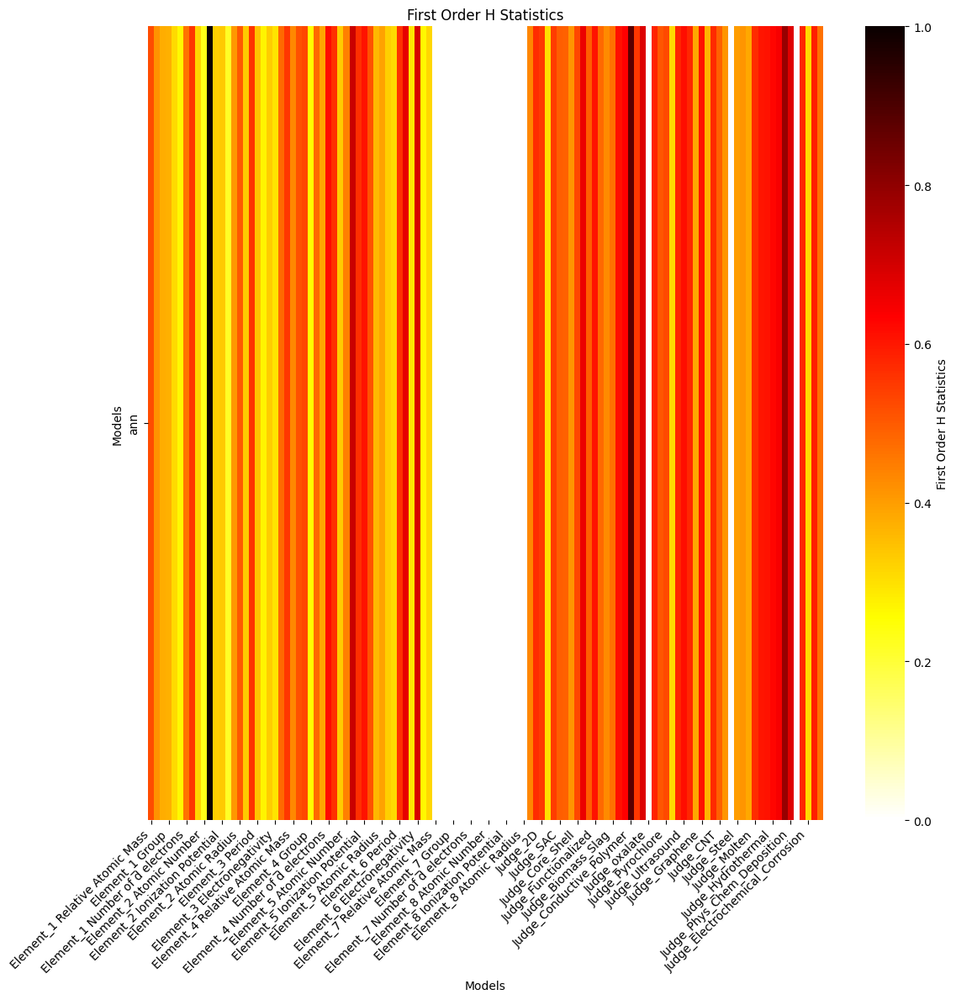

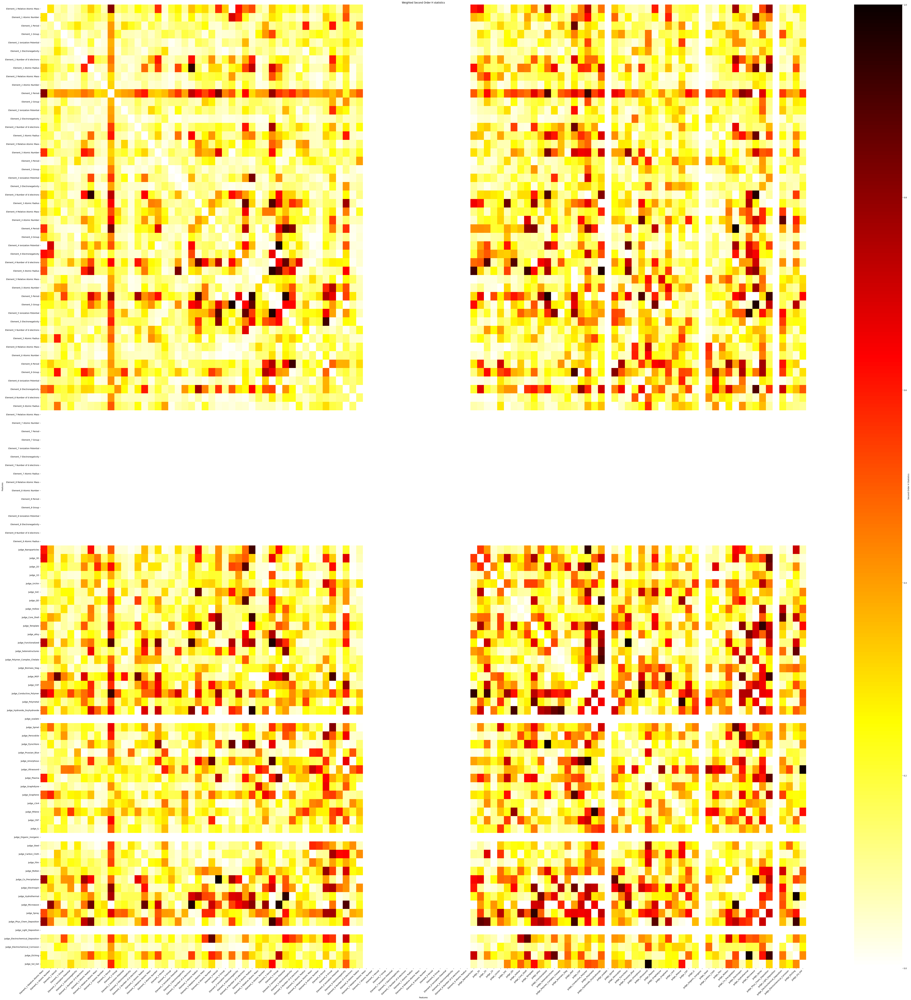

In [8]:
project_name='Acid_OER'
###H interaction compute###
matrix_list,second_order_matrix,first_order_matrix,h_mat_image_1st,h_mat_image_2nd=CMT.h_index_weighted_matrix_compute(project_name=project_name)

###create H interaction directory if it doesn't exist###
save_dir_H = f"./{project_name}/H_Compute_Save"
os.makedirs(save_dir_H, exist_ok=True)

###Save the data
np.save(os.path.join(save_dir_H, "matrix_list.npy"), matrix_list)
np.save(os.path.join(save_dir_H, "second_order_matrix.npy"), second_order_matrix)
np.save(os.path.join(save_dir_H, "first_order_matrix.npy"), first_order_matrix)

In [9]:
first_order_matrix

,Element_1 Relative Atomic Mass,Element_1 Atomic Number,Element_1 Period,Element_1 Group,Element_1 Ionization Potential,Element_1 Electronegativity,Element_1 Number of d electrons,Element_1 Atomic Radius,Element_2 Relative Atomic Mass,Element_2 Atomic Number,...,Judge_Electrospin,Judge_Hydrothermal,Judge_Microwave,Judge_Spray,Judge_Phys_Chem_Deposition,Judge_Light_Deposition,Judge_Electrochemical_Deposition,Judge_Electrochemical_Corrosion,Judge_Etching,Judge_Sol_Gel
ann,0.522685,0.414912,0.378793,0.37193,0.312261,0.262929,0.464526,0.557712,0.318031,0.230868,...,0.607075,0.62693,0.647661,0.78689,0.681465,0.0,0.579369,0.309195,0.586993,0.468307


In [10]:
second_order_matrix

,Element_1 Relative Atomic Mass,Element_1 Atomic Number,Element_1 Period,Element_1 Group,Element_1 Ionization Potential,Element_1 Electronegativity,Element_1 Number of d electrons,Element_1 Atomic Radius,Element_2 Relative Atomic Mass,Element_2 Atomic Number,...,Judge_Electrospin,Judge_Hydrothermal,Judge_Microwave,Judge_Spray,Judge_Phys_Chem_Deposition,Judge_Light_Deposition,Judge_Electrochemical_Deposition,Judge_Electrochemical_Corrosion,Judge_Etching,Judge_Sol_Gel
Element_1 Relative Atomic Mass,0.000000,0.294170,0.067702,0.116771,0.040346,0.076445,0.165934,0.327712,0.196657,0.073135,...,0.189176,0.156939,0.000000,0.528641,0.795546,0.0,0.111502,0.062748,0.271883,0.210221
Element_1 Atomic Number,0.294170,0.000000,0.103051,0.082325,0.046831,0.087207,0.123795,0.208387,0.165341,0.116813,...,0.350018,0.104864,0.804007,0.369702,0.453479,0.0,0.151405,0.051645,0.066329,0.196074
Element_1 Period,0.067702,0.103051,0.000000,0.121693,0.186652,0.288680,0.143104,0.143838,0.069397,0.065990,...,0.139752,0.272819,0.428739,0.321029,0.088065,0.0,0.108784,0.241914,0.077224,0.122783
Element_1 Group,0.116771,0.082325,0.121693,0.000000,0.048103,0.160346,0.040145,0.090698,0.122953,0.032581,...,0.151685,0.138989,0.041147,0.462141,0.088902,0.0,0.523577,0.206494,0.096351,0.099091
Element_1 Ionization Potential,0.040346,0.046831,0.186652,0.048103,0.000000,0.076864,0.054632,0.204585,0.017832,0.036086,...,0.412466,0.157676,0.174719,0.195638,0.275546,0.0,0.190360,0.092782,0.130907,0.306165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Judge_Light_Deposition,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
Judge_Electrochemical_Deposition,0.111502,0.151405,0.108784,0.523577,0.190360,0.035820,0.093195,0.054805,0.232890,0.116759,...,0.622048,0.493802,0.519154,0.390500,0.347757,0.0,0.000000,0.189761,0.457038,0.317113
Judge_Electrochemical_Corrosion,0.062748,0.051645,0.241914,0.206494,0.092782,0.100958,0.043401,0.032370,0.094897,0.076127,...,0.147613,0.188973,0.187042,0.490977,0.073753,0.0,0.189761,0.000000,0.058137,0.252523
Judge_Etching,0.271883,0.066329,0.077224,0.096351,0.130907,0.152828,0.376816,0.526486,0.282101,0.237927,...,0.000000,0.988416,0.093893,0.611017,0.917306,0.0,0.457038,0.058137,0.000000,0.426811


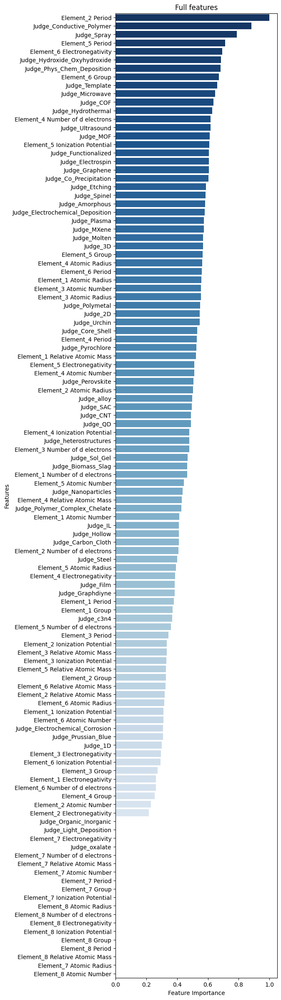

In [11]:
# Full features
fig, ax = plt.subplots(figsize=(5,30))
features = first_order_matrix.loc['ann'].sort_values(ascending=False)
colors = sns.color_palette("Blues", len(features))[::-1]  # Reverse the color palette
sns.barplot(y=features.index, x=features.values, palette=colors, ax=ax)
plt.title('Full features')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.show()

In [8]:
project_name='Acid_OER'
save_dir_H = f"./{project_name}/H_Compute_Save"
# Specify the file path
file_path = os.path.join(save_dir_H, "second_order_matrix.npy")

# Load the array from the file
second_order_matrix = np.load(file_path)

In [12]:
average_50x50 = np.mean(second_order_matrix[64:, 64:])
average_48x48 = np.mean(second_order_matrix[:48, :48])
average_64_columns_last_50_rows = np.mean(second_order_matrix[:48, -50:])
print(average_50x50,average_48x48,average_64_columns_last_50_rows)

0.23996770231313685 0.18082988956929588 0.21510619988013455
